In [1]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
%matplotlib inline  


/Users/chronowanderer/anaconda3/envs/tensorflow/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
%store -r numSeries
%store -r numPredict
%store -r TRAIN_SIZE
%store -r EFFECTIVE_COEFFICIENT
%store -r EFFECTIVE_LOC
%store -r tmax
%store -r h
%store -r lentmax

%store -r norm
%store -r a
%store -r sigma
%store -r Target
%store -r Response
%store -r Error
%store -r RTloc
%store -r Dat


In [3]:
FORECAST_MAX = 32
TIME_STEPS = 32
HIDDEN_UNITS = 64
SECOND_HIDDEN_UNITS = 32
INPUT_UNITS = 2
OUTPUT_UNITS = 2
BATCH_SIZE = 4
EPOCH = 10
look_back = TIME_STEPS
T = numpy.linspace(0, tmax, lentmax, endpoint = False)
DATA_i = 0
DATA_f = lentmax - 1


In [4]:
def atan_positive(x, y):
    if (x > 0) & (y > 0):
        theta = math.atan(y / x)
    elif (x == 0) & (y > 0):
        theta = math.pi / 2
    elif (x < 0):
        theta = math.pi + math.atan(y / x)
    elif (x == 0) & (y < 0):
        theta = 3 * math.pi / 2
    elif (x > 0) & (y <= 0):
        theta = 2 * math.pi + math.atan(y / x)
    return theta

def semicircular_error(r, t):
    e = r - t
    if e >= 90:
        e = e - 180
    elif e < -90:
        e = e + 180
    return e

def quardric_dance(o, i):
    delta = o - i
    if delta >= 90:
        return o - 180
    elif delta < -90:
        return o + 180
    return o


In [5]:
Dat = numpy.array(Dat) # all data
Data = Dat[0 : numSeries, :, :] # training & testing & sequently predicting
Data_p = Dat[numSeries : numSeries + numPredict, :, :] # complete prediction

dataset, dataset_t = [], []
for i in numpy.arange(numSeries):
    for j in numpy.arange(lentmax):
        dataset.append(Data[i, j])
        dataset_t.append(Data[i, j])
dataset = numpy.array(dataset)
dataset_p = []
for i in numpy.arange(numPredict):
    for j in numpy.arange(lentmax):
        dataset_p.append(Data_p[i, j])
        dataset_t.append(Data_p[i, j])
predict = numpy.array(dataset_p)
dataset_t = numpy.array(dataset_t)

print dataset.shape, predict.shape, dataset_t.shape


(1000000, 2) (200000, 2) (1200000, 2)


In [6]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset_t = scaler.fit_transform(dataset_t)
dataset = dataset_t[0:numSeries*lentmax, :]
predict = dataset_t[numSeries*lentmax:(numSeries+numPredict)*lentmax, :]


In [7]:
TOTAL_TIME = Data.shape[1]

# split into train and test sets
train_size = TRAIN_SIZE
test_size = TOTAL_TIME - train_size + look_back
train, test = [], []
for k in range(numSeries):
    kk = k * TOTAL_TIME
    for t in range(kk, kk+train_size):
        train.append(dataset[t, :])
    for t in range(kk+train_size-look_back, kk+TOTAL_TIME):
        test.append(dataset[t, :])
train = numpy.array(train)
test = numpy.array(test)
        
print train.shape, test.shape, predict.shape

# use this function to prepare the train and test datasets for modeling
trainX, trainY = [], []
for k in range(numSeries):
    kk = k * train_size
    for i in range(train_size - look_back):
        temp = train[(kk + i) : (kk + i + look_back), :]
        trainX.append(temp)
        trainY.append(train[kk + i + look_back, :])
    
trainX = numpy.array(trainX)
trainY = numpy.array(trainY)

# reshape input to be [samples, time steps, features]
trainX = numpy.reshape(trainX, (trainX.shape[0], look_back, trainX.shape[2]))


(50000, 2) (966000, 2) (200000, 2)


In [8]:
# create and fit the LSTM network
model = Sequential()

model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS)))
#model.add(LSTM(HIDDEN_UNITS, input_shape=(look_back, INPUT_UNITS), return_sequences=True))
#model.add(LSTM(SECOND_HIDDEN_UNITS))

model.add(Dense(OUTPUT_UNITS))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs = EPOCH, batch_size = BATCH_SIZE, verbose = 2)


Epoch 1/10
 - 190s - loss: 2.6681e-04
Epoch 2/10
 - 175s - loss: 1.7282e-05
Epoch 3/10
 - 174s - loss: 1.0730e-05
Epoch 4/10
 - 175s - loss: 9.7807e-06
Epoch 5/10
 - 175s - loss: 9.4016e-06
Epoch 6/10
 - 175s - loss: 9.1025e-06
Epoch 7/10
 - 174s - loss: 8.6628e-06
Epoch 8/10
 - 175s - loss: 8.5703e-06
Epoch 9/10
 - 175s - loss: 8.3811e-06
Epoch 10/10
 - 173s - loss: 8.1802e-06


In [9]:
# prepare for the forecasting
trainPredict = model.predict(trainX)

# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.4f RMSE' % (trainScore))

# shift train predictions for plotting
trainPredictPlot = numpy.empty_like(Data)
trainPredictPlot[:, :, :] = numpy.nan
for s in range(numSeries):
    for t in range(train_size - look_back):
        trainPredictPlot[s, t + look_back, :] = trainPredict[t + s * (train_size - look_back), :]


Train Score: 0.1910 RMSE


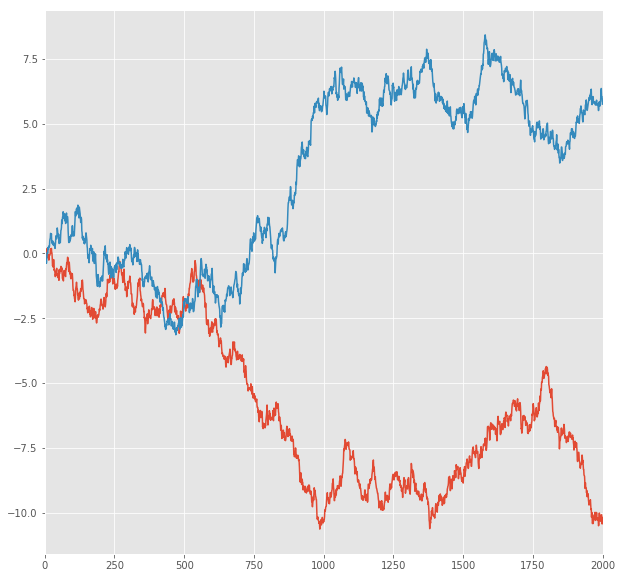

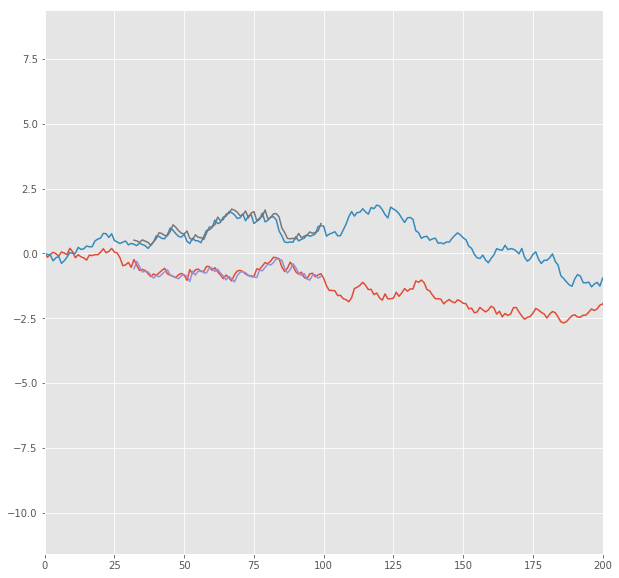

In [10]:
#lalala
plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, lentmax)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
loc = 0
plt.xlim(0, TRAIN_SIZE + 100)
plt.plot(Data[loc, :, 0])
plt.plot(Data[loc, :, 1])
plt.plot(trainPredictPlot[loc, :, 0])
plt.plot(trainPredictPlot[loc, :, 1])
plt.show()


In [11]:
testX, predictX = [], []
for k in range(numSeries):
    kk = k * test_size
    for i in range(test_size - look_back):
        temp = test[(kk + i) : (kk + i + look_back), :]
        testX.append(temp)
for k in range(numPredict):
    kk = k * lentmax
    for i in range(lentmax - look_back):
        temp = predict[(kk + i) : (kk + i + look_back), :]
        predictX.append(temp)
testX = numpy.array(testX)
predictX = numpy.array(predictX)
testX = numpy.reshape(testX, (testX.shape[0], look_back, testX.shape[2]))
predictX = numpy.reshape(predictX, (predictX.shape[0], look_back, predictX.shape[2]))


1 -step(s) forecast:
Test Score for 1 -steps forecast: 0.2585 RMSE
Predict Score for 1 -steps forecast: 0.2435 RMSE
Error Test Score for 1 -steps forecast: 0.0767 RMSE
RT Test Score for 1 -steps forecast: 0.0782 RMSE
Error Test Corr for 1 -steps forecast: 0.9890
RT Test Corr for 1 -steps forecast: 0.9825


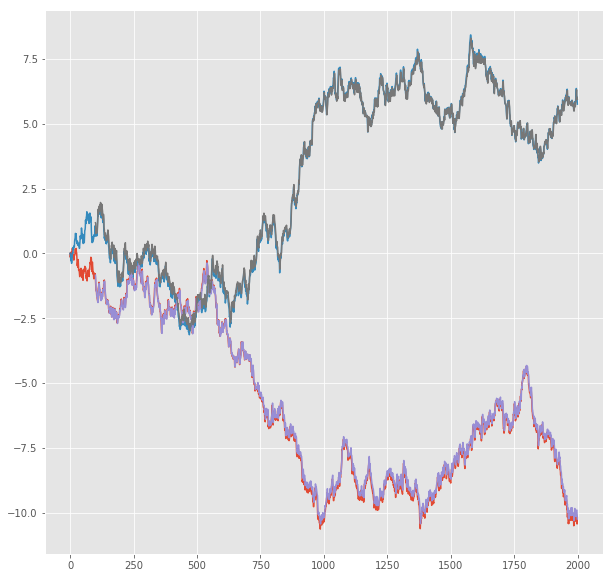

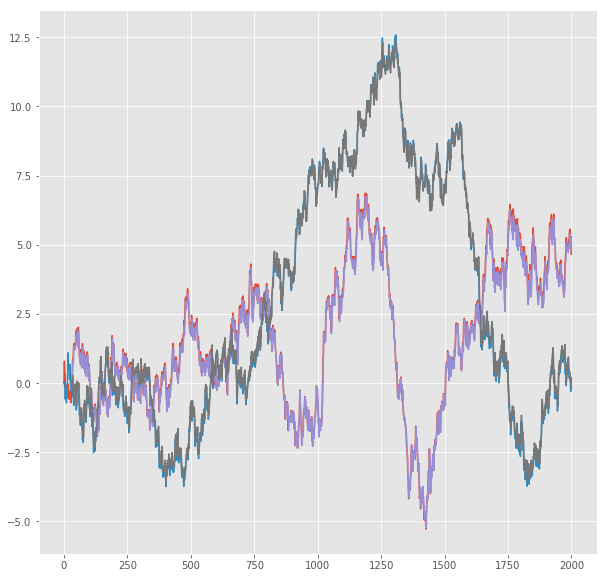

R^2 score for regression on Error: 0.9781
k = 0.9900


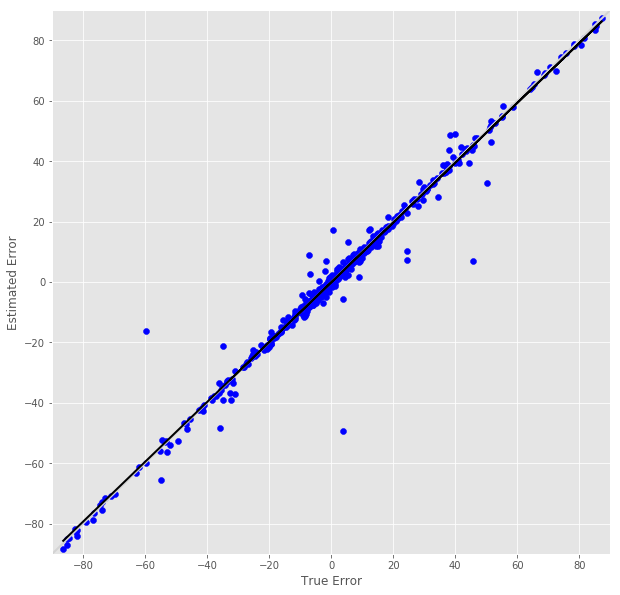

R^2 score for regression on RT: 0.9652
k = 1.0012


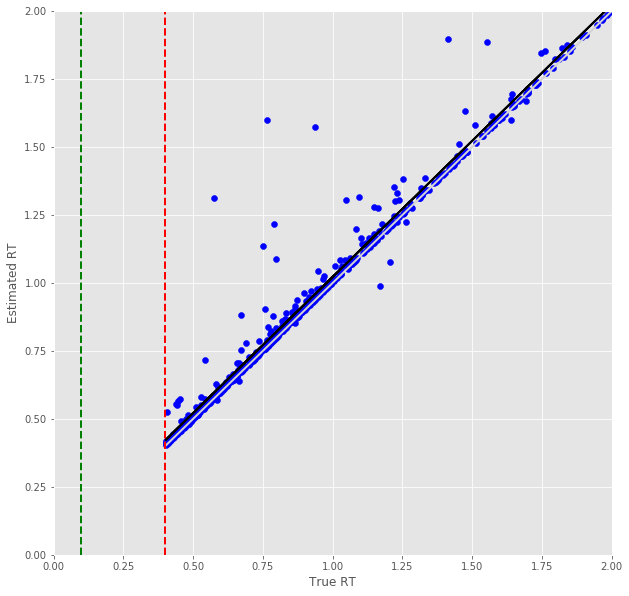

Error Prediction Score: 0.0304 RMSE
RT Prediction Score: 0.0408 RMSE
Error Prediction Corr: 0.9976
RT Prediction Corr: 0.9955
R^2 score for regression on Error: 0.9951
k = 1.0043


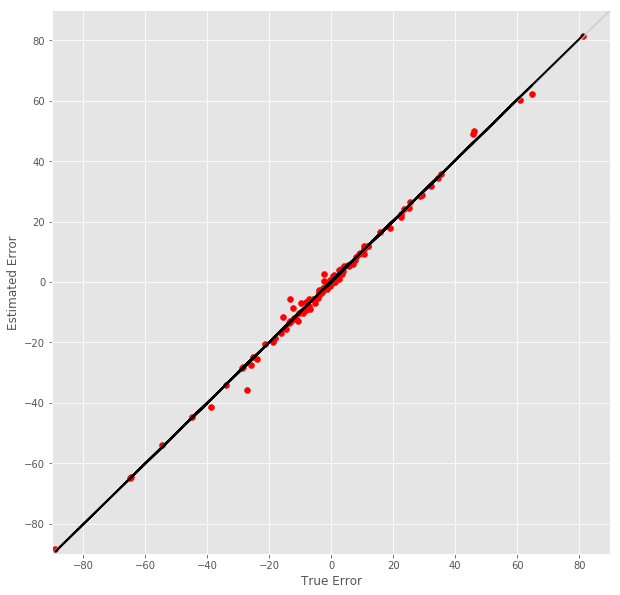

R^2 score for regression on RT: 0.9911
k = 1.0003


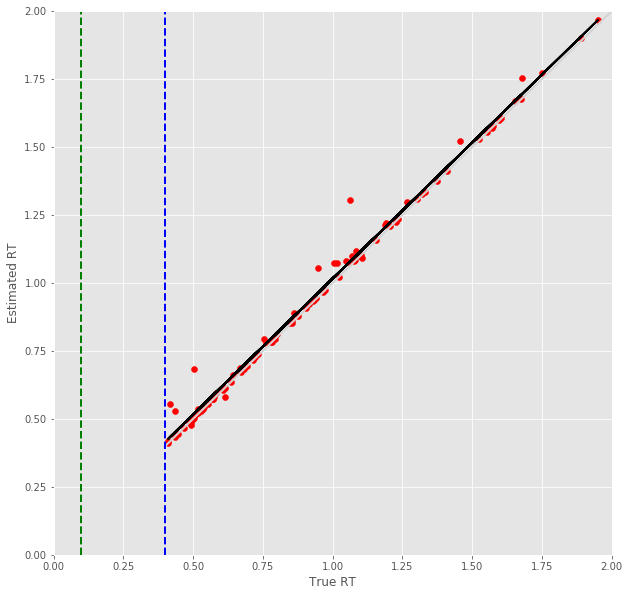

2 -step(s) forecast:
Test Score for 2 -steps forecast: 0.4616 RMSE
Predict Score for 2 -steps forecast: 0.4303 RMSE
Error Test Score for 2 -steps forecast: 0.1066 RMSE
RT Test Score for 2 -steps forecast: 0.1018 RMSE
Error Test Corr for 2 -steps forecast: 0.9792
RT Test Corr for 2 -steps forecast: 0.9722


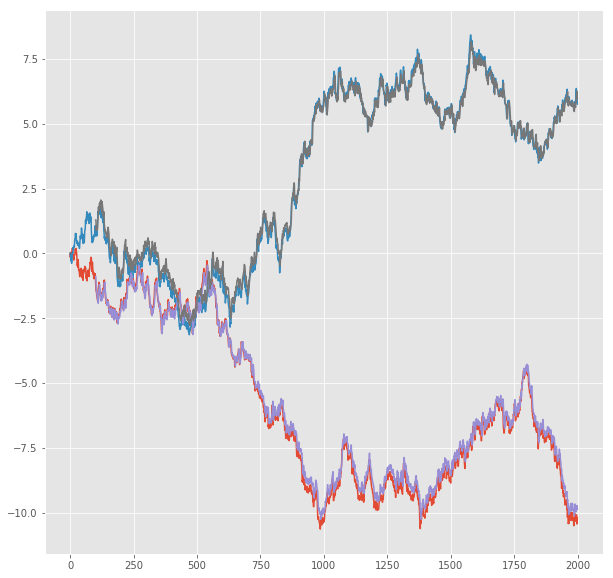

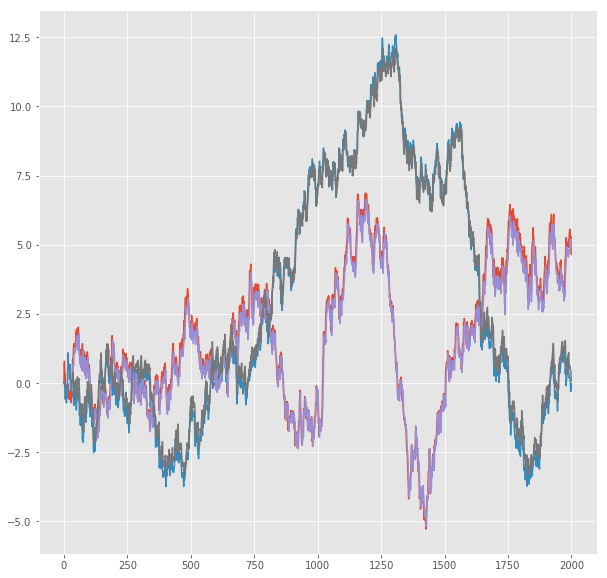

R^2 score for regression on Error: 0.9589
k = 0.9886


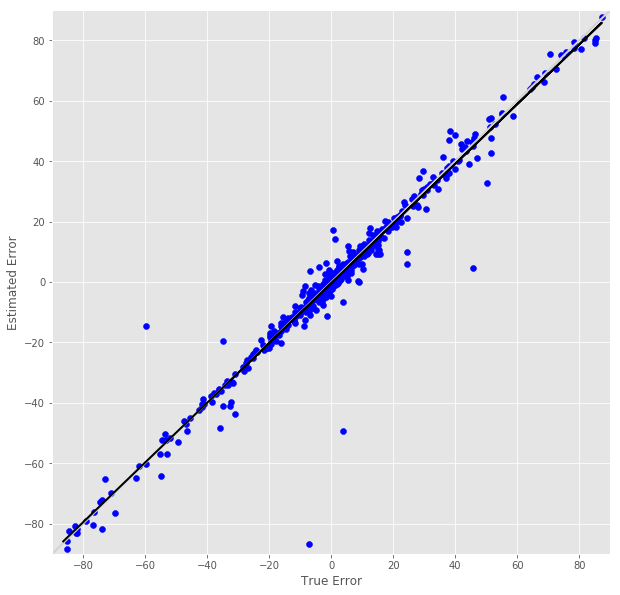

R^2 score for regression on RT: 0.9451
k = 1.0115


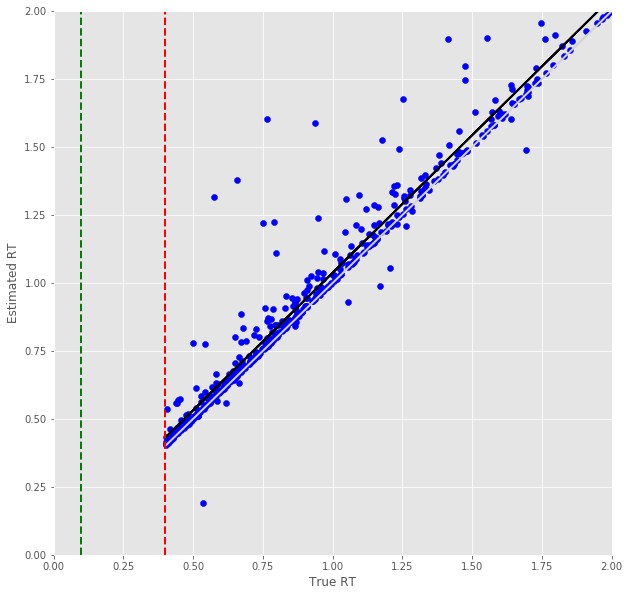

Error Prediction Score: 0.0974 RMSE
RT Prediction Score: 0.1088 RMSE
Error Prediction Corr: 0.9753
RT Prediction Corr: 0.9684
R^2 score for regression on Error: 0.9511
k = 1.0189


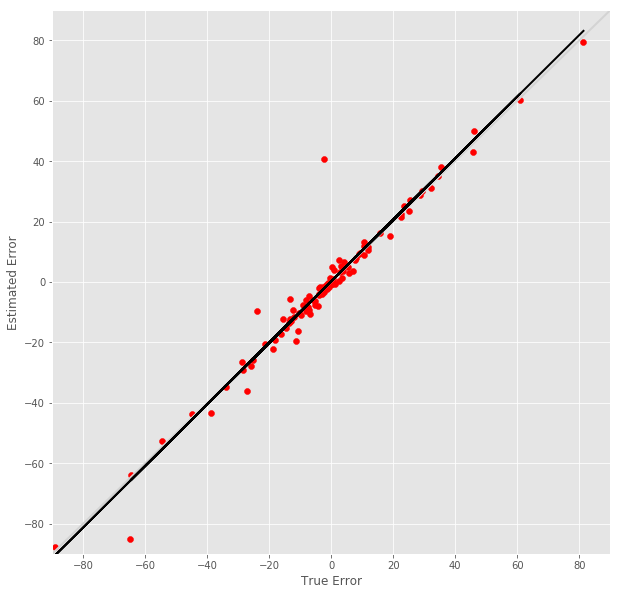

R^2 score for regression on RT: 0.9377
k = 1.0234


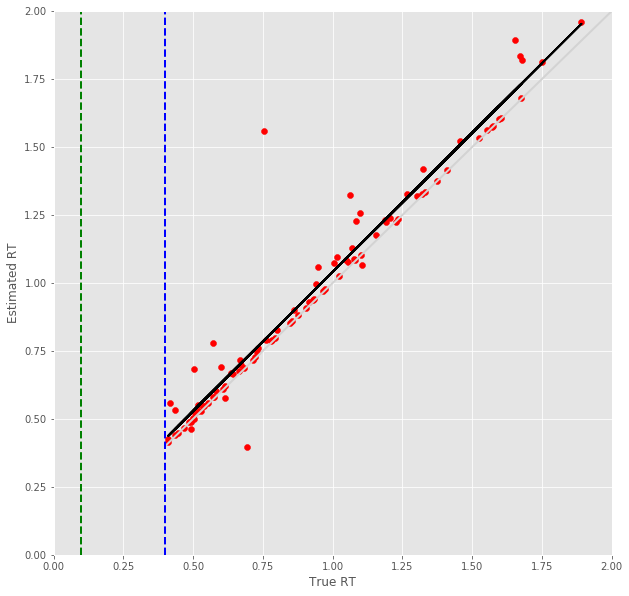

3 -step(s) forecast:
Test Score for 3 -steps forecast: 0.6574 RMSE
Predict Score for 3 -steps forecast: 0.6102 RMSE
Error Test Score for 3 -steps forecast: 0.1205 RMSE
RT Test Score for 3 -steps forecast: 0.1234 RMSE
Error Test Corr for 3 -steps forecast: 0.9728
RT Test Corr for 3 -steps forecast: 0.9613


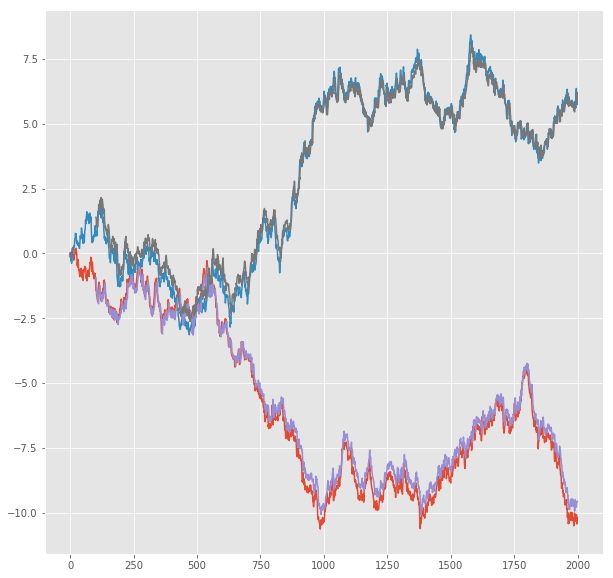

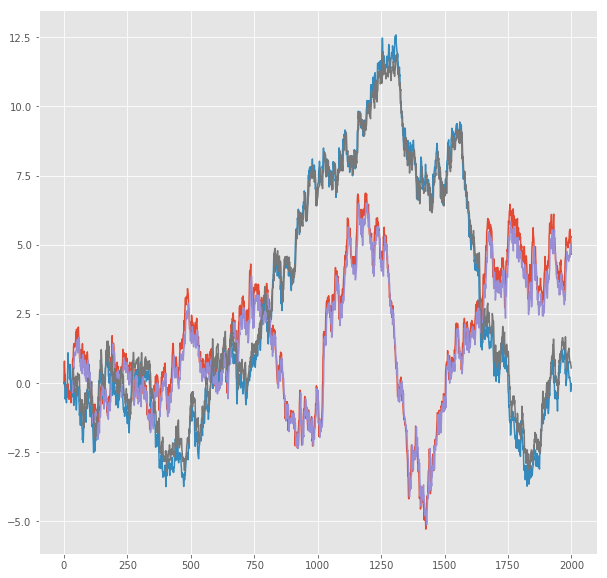

R^2 score for regression on Error: 0.9464
k = 0.9815


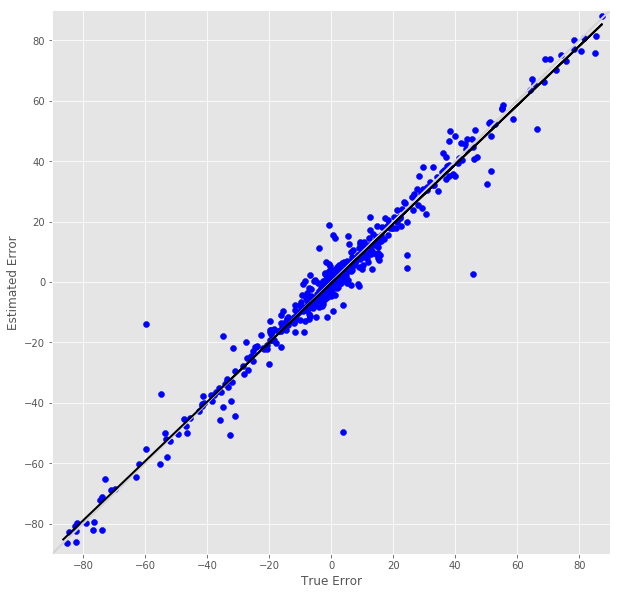

R^2 score for regression on RT: 0.9240
k = 1.0117


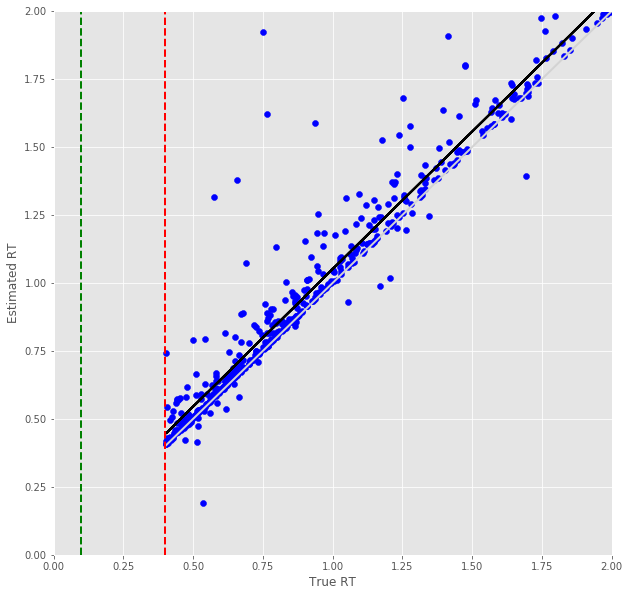

Error Prediction Score: 0.1076 RMSE
RT Prediction Score: 0.1262 RMSE
Error Prediction Corr: 0.9705
RT Prediction Corr: 0.9616
R^2 score for regression on Error: 0.9420
k = 1.0268


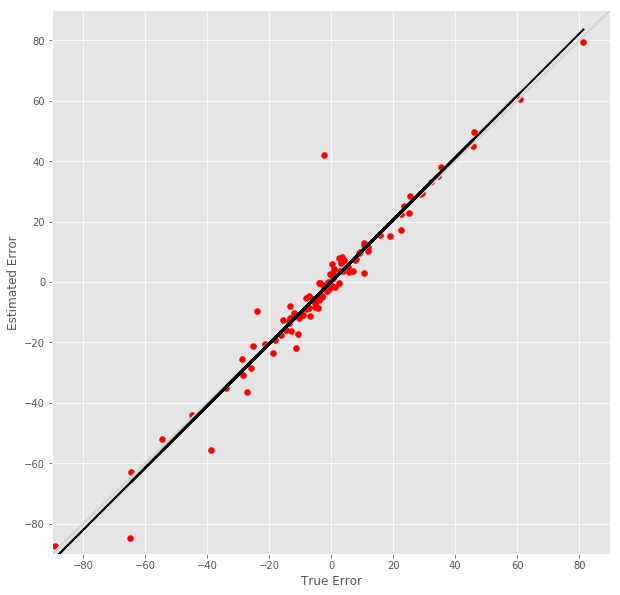

R^2 score for regression on RT: 0.9247
k = 1.0365


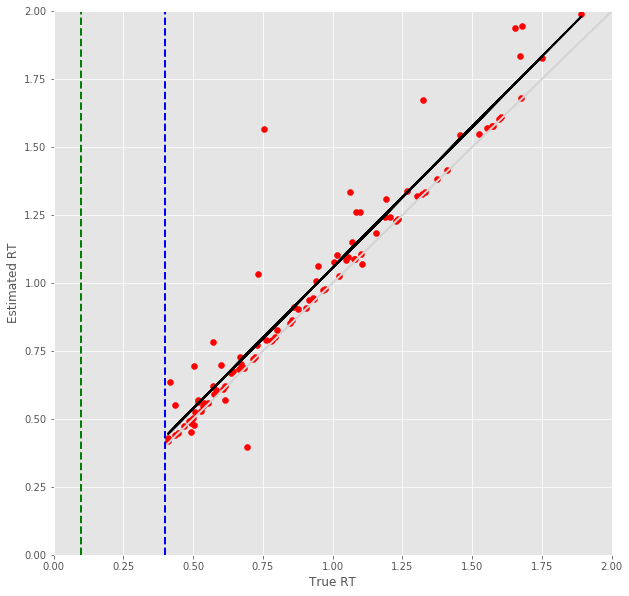

4 -step(s) forecast:
Test Score for 4 -steps forecast: 0.8443 RMSE
Predict Score for 4 -steps forecast: 0.7824 RMSE
Error Test Score for 4 -steps forecast: 0.1423 RMSE
RT Test Score for 4 -steps forecast: 0.1445 RMSE
Error Test Corr for 4 -steps forecast: 0.9621
RT Test Corr for 4 -steps forecast: 0.9484


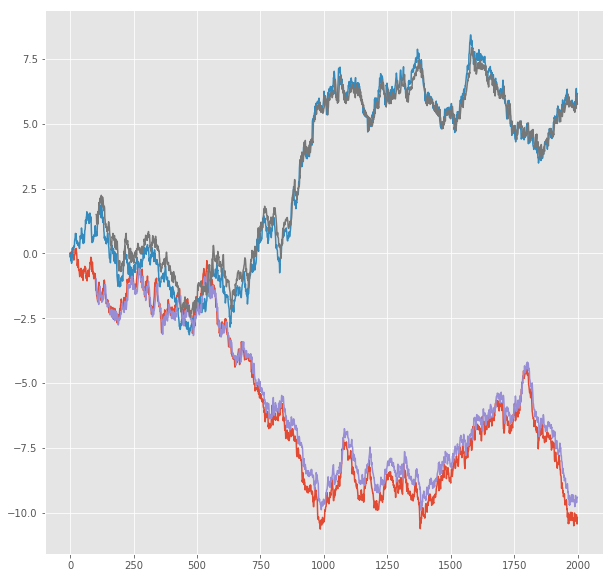

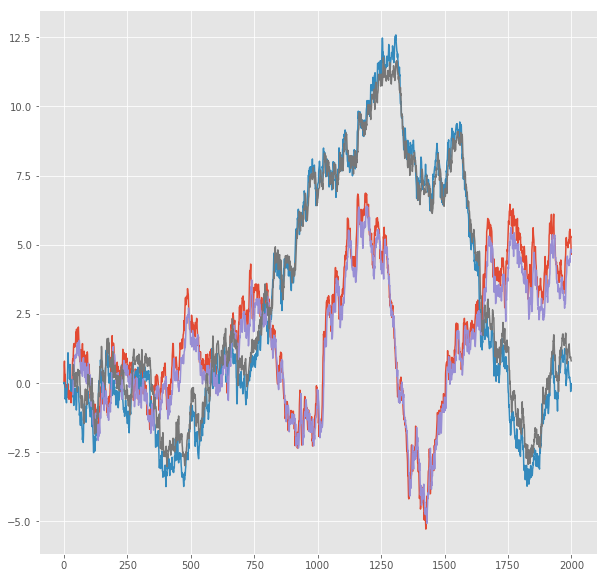

R^2 score for regression on Error: 0.9256
k = 0.9679


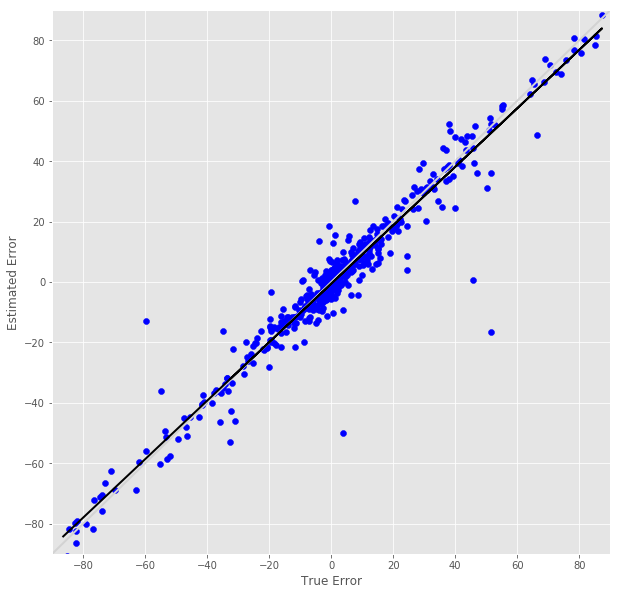

R^2 score for regression on RT: 0.8994
k = 1.0202


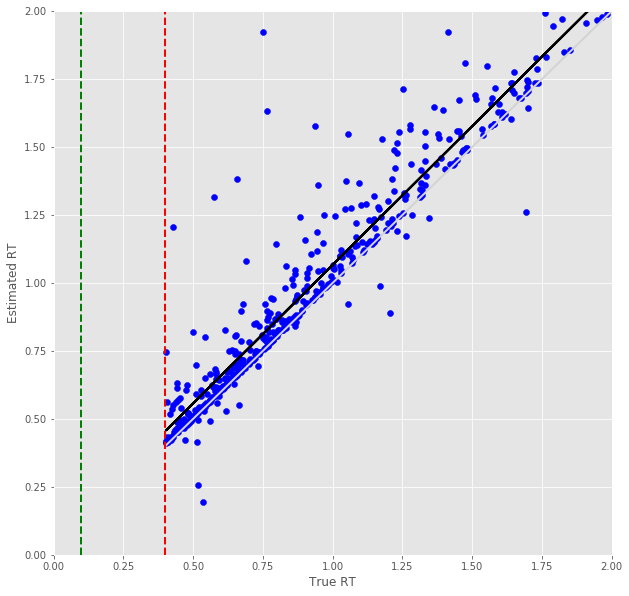

Error Prediction Score: 0.1299 RMSE
RT Prediction Score: 0.1448 RMSE
Error Prediction Corr: 0.9571
RT Prediction Corr: 0.9474
R^2 score for regression on Error: 0.9161
k = 1.0120


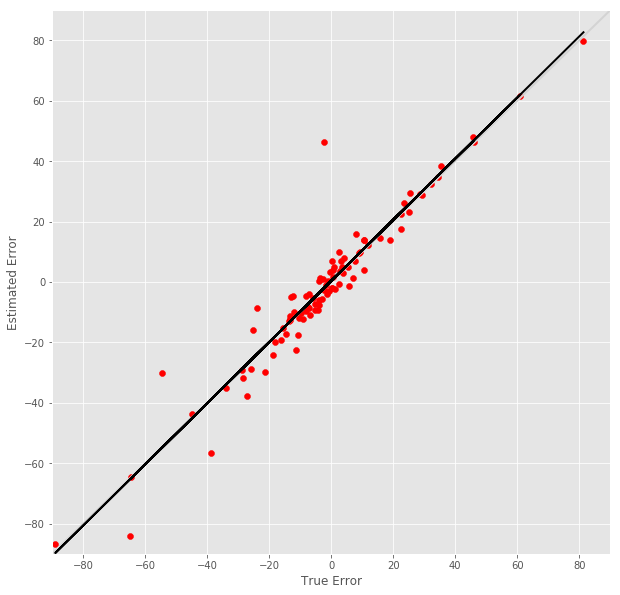

R^2 score for regression on RT: 0.8975
k = 1.0213


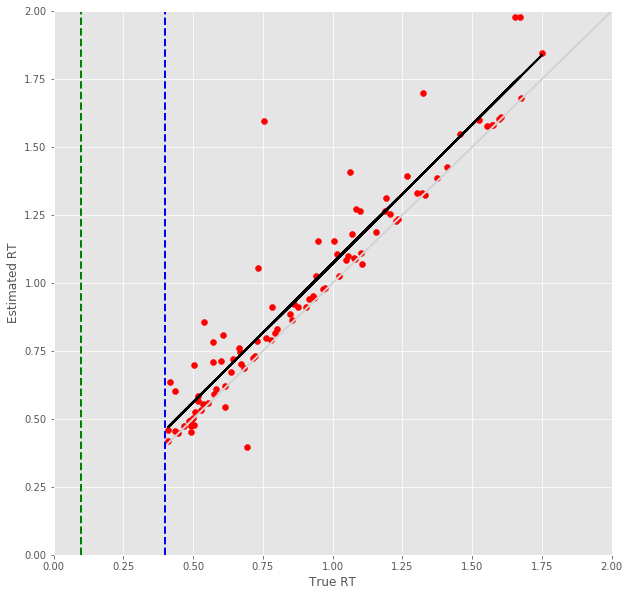

5 -step(s) forecast:
Test Score for 5 -steps forecast: 1.0221 RMSE
Predict Score for 5 -steps forecast: 0.9467 RMSE
Error Test Score for 5 -steps forecast: 0.1544 RMSE
RT Test Score for 5 -steps forecast: 0.1750 RMSE
Error Test Corr for 5 -steps forecast: 0.9562
RT Test Corr for 5 -steps forecast: 0.9229


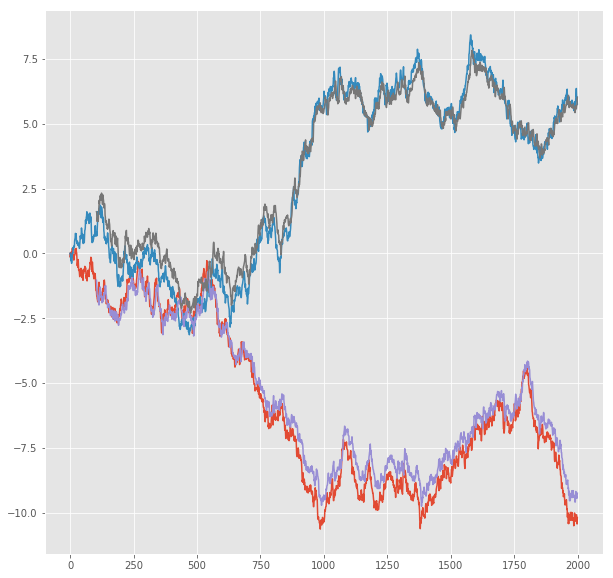

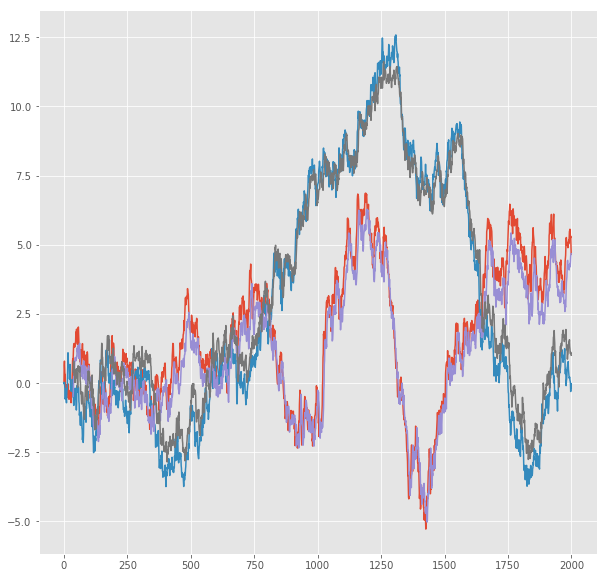

R^2 score for regression on Error: 0.9143
k = 0.9743


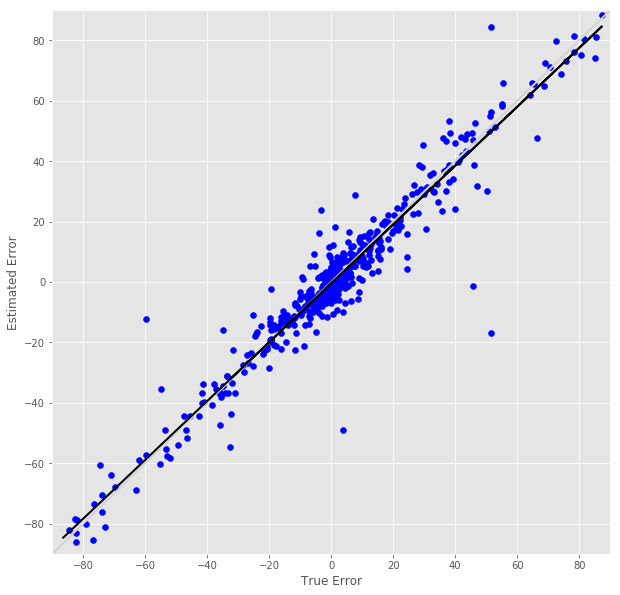

R^2 score for regression on RT: 0.8518
k = 1.0144


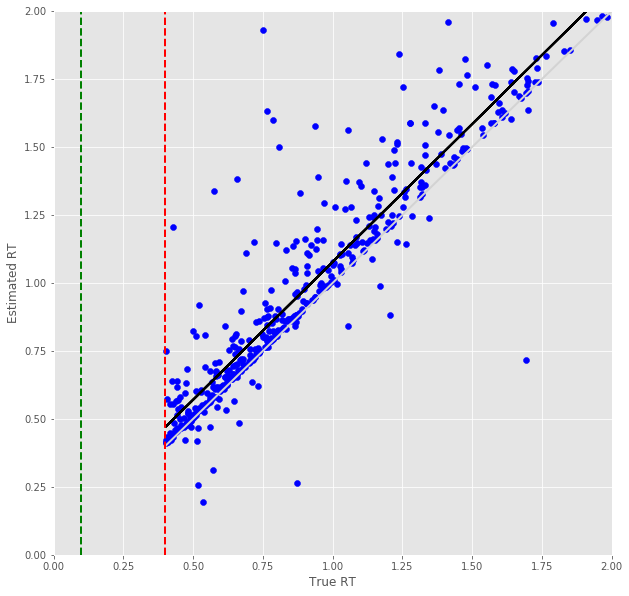

Error Prediction Score: 0.1521 RMSE
RT Prediction Score: 0.2121 RMSE
Error Prediction Corr: 0.9416
RT Prediction Corr: 0.8877
R^2 score for regression on Error: 0.8866
k = 0.9997


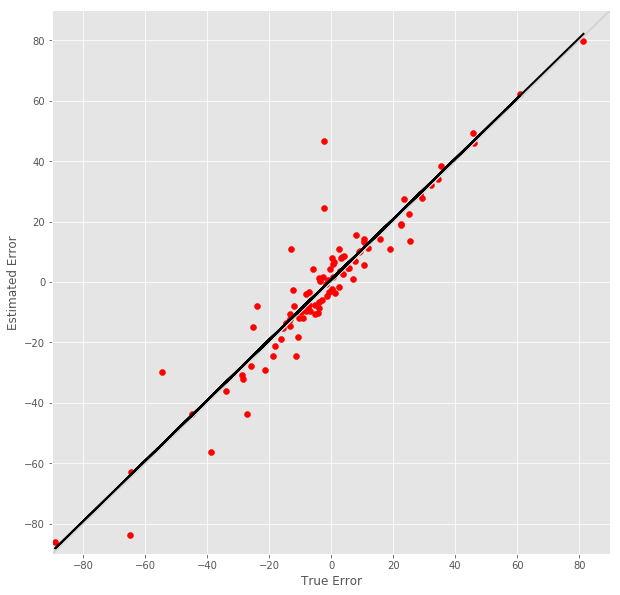

R^2 score for regression on RT: 0.7881
k = 0.9810


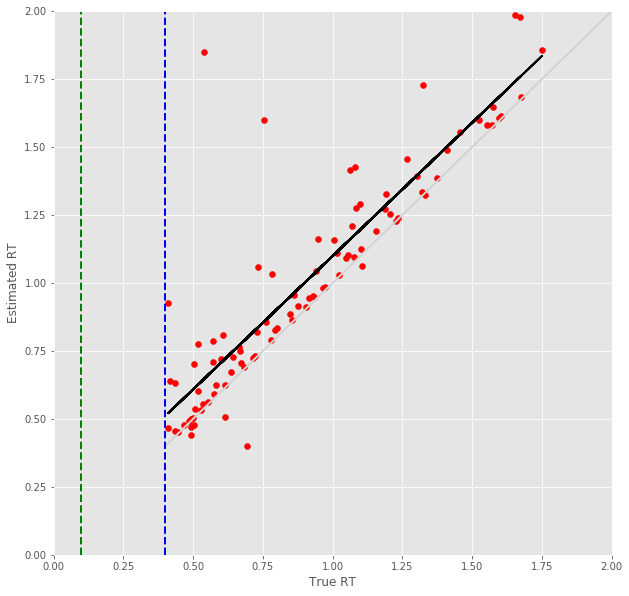

6 -step(s) forecast:
Test Score for 6 -steps forecast: 1.1920 RMSE
Predict Score for 6 -steps forecast: 1.1042 RMSE
Error Test Score for 6 -steps forecast: 0.1706 RMSE
RT Test Score for 6 -steps forecast: 0.2042 RMSE
Error Test Corr for 6 -steps forecast: 0.9475
RT Test Corr for 6 -steps forecast: 0.8993


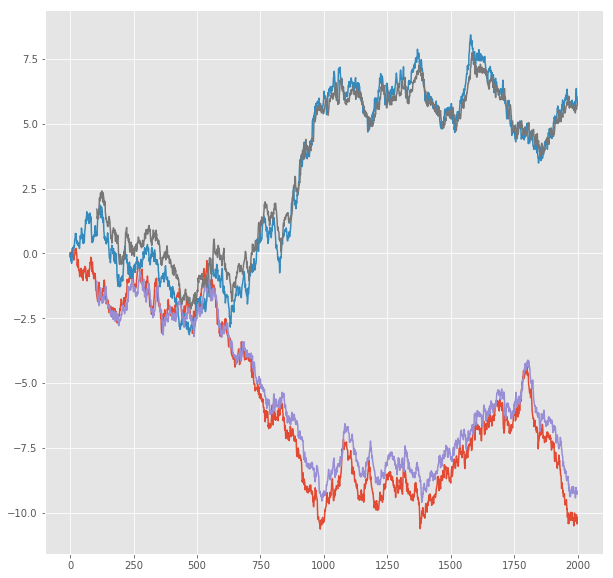

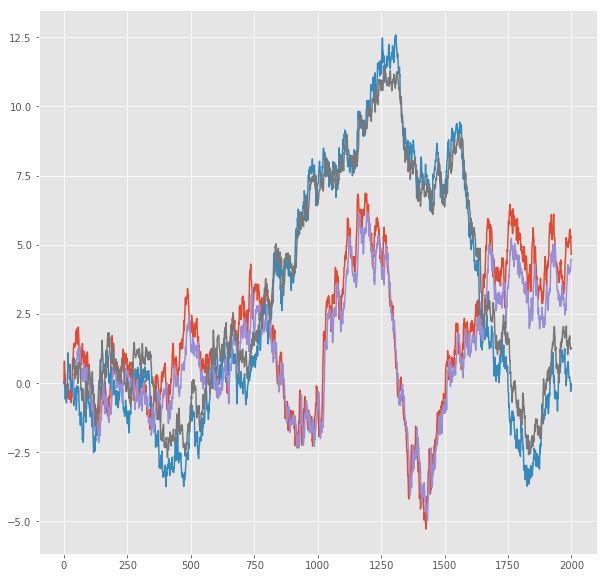

R^2 score for regression on Error: 0.8977
k = 0.9756


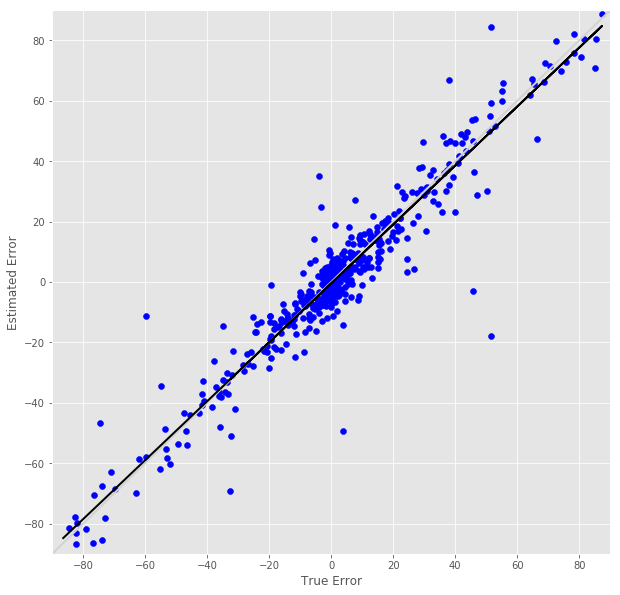

R^2 score for regression on RT: 0.8088
k = 1.0213


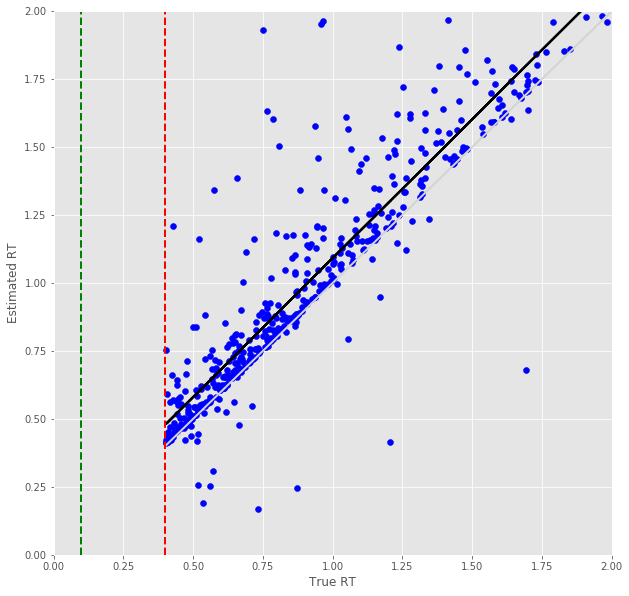

Error Prediction Score: 0.2192 RMSE
RT Prediction Score: 0.2292 RMSE
Error Prediction Corr: 0.8859
RT Prediction Corr: 0.8597
R^2 score for regression on Error: 0.7849
k = 0.9723


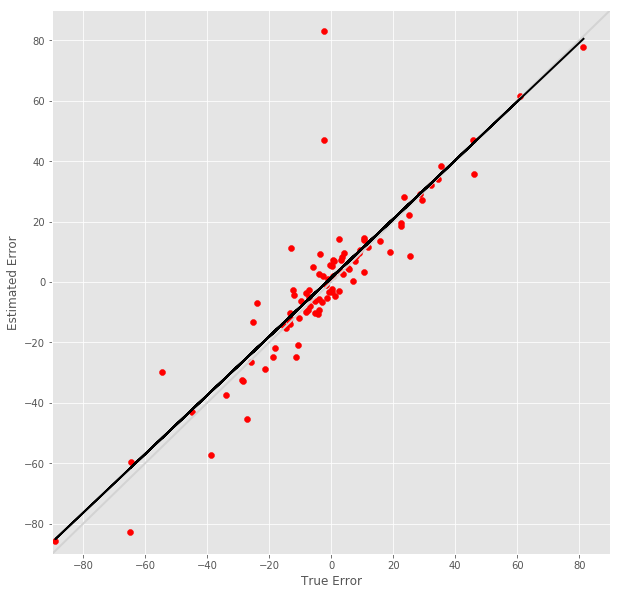

R^2 score for regression on RT: 0.7391
k = 0.9701


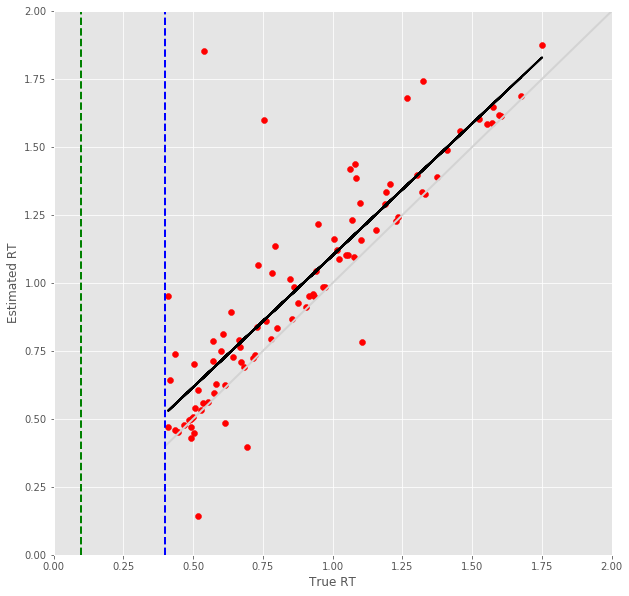

7 -step(s) forecast:
Test Score for 7 -steps forecast: 1.3555 RMSE
Predict Score for 7 -steps forecast: 1.2562 RMSE
Error Test Score for 7 -steps forecast: 0.1930 RMSE
RT Test Score for 7 -steps forecast: 0.2300 RMSE
Error Test Corr for 7 -steps forecast: 0.9330
RT Test Corr for 7 -steps forecast: 0.8739


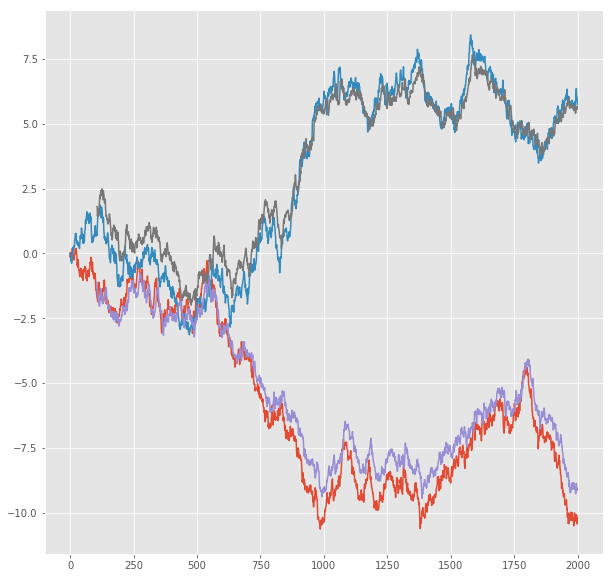

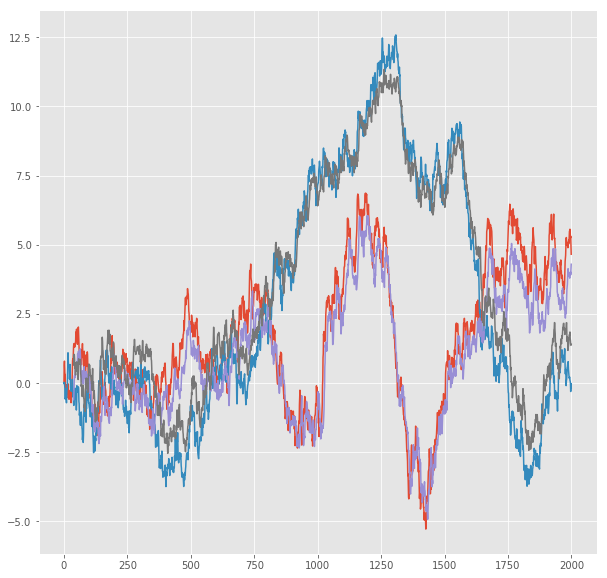

R^2 score for regression on Error: 0.8705
k = 0.9654


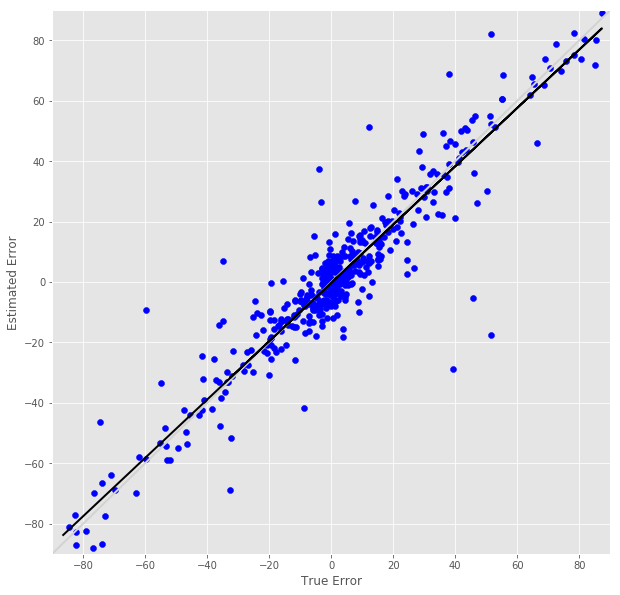

R^2 score for regression on RT: 0.7637
k = 1.0100


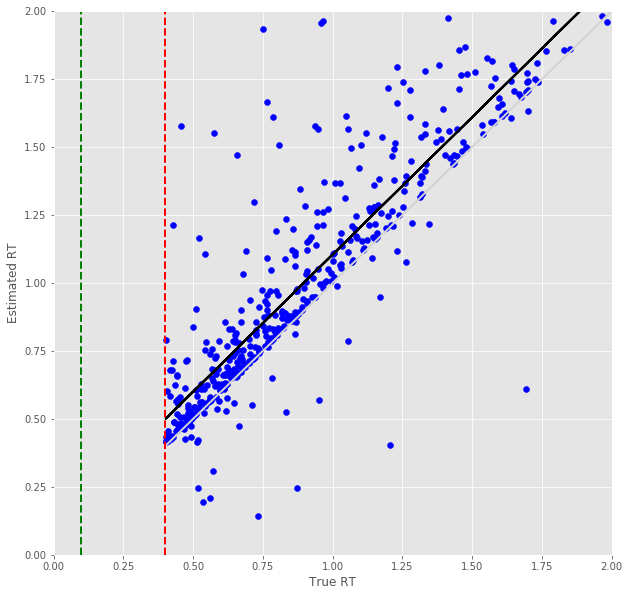

Error Prediction Score: 0.2325 RMSE
RT Prediction Score: 0.2491 RMSE
Error Prediction Corr: 0.8684
RT Prediction Corr: 0.8456
R^2 score for regression on Error: 0.7541
k = 0.9588


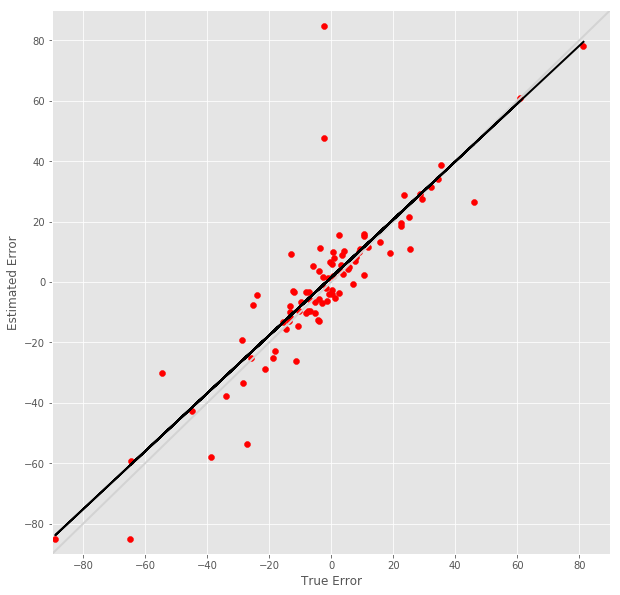

R^2 score for regression on RT: 0.7151
k = 0.9941


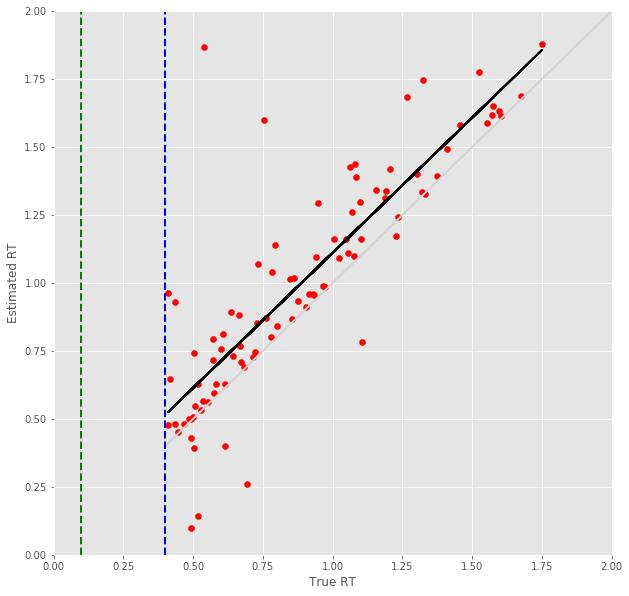

8 -step(s) forecast:
Test Score for 8 -steps forecast: 1.5137 RMSE
Predict Score for 8 -steps forecast: 1.4037 RMSE
Error Test Score for 8 -steps forecast: 0.2061 RMSE
RT Test Score for 8 -steps forecast: 0.2453 RMSE
Error Test Corr for 8 -steps forecast: 0.9228
RT Test Corr for 8 -steps forecast: 0.8627


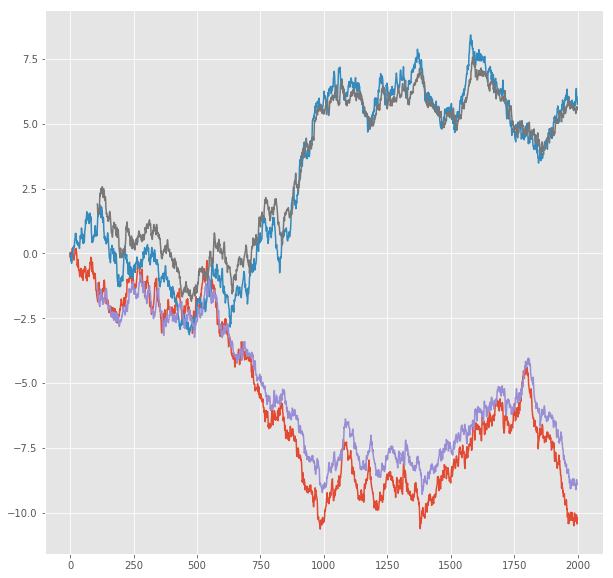

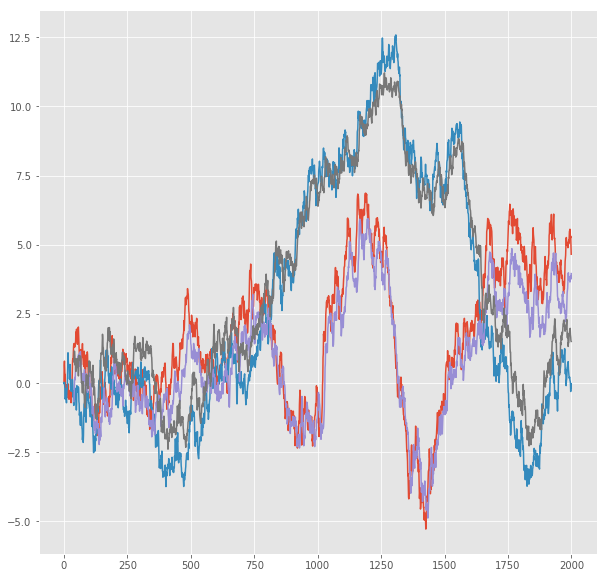

R^2 score for regression on Error: 0.8516
k = 0.9568


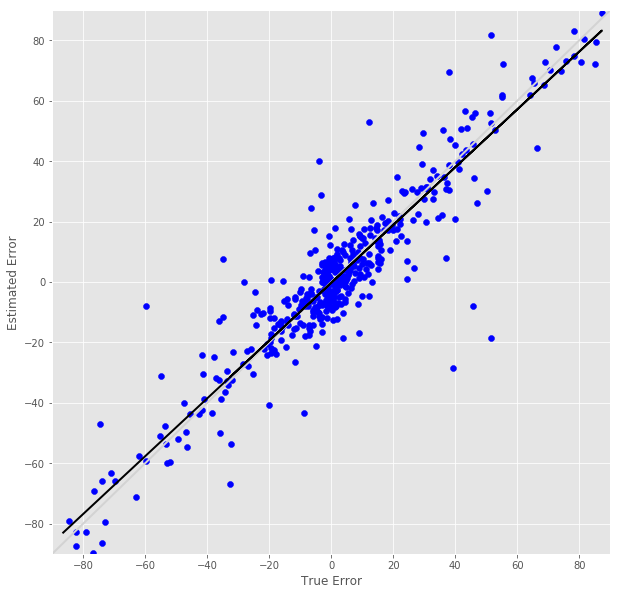

R^2 score for regression on RT: 0.7442
k = 1.0178


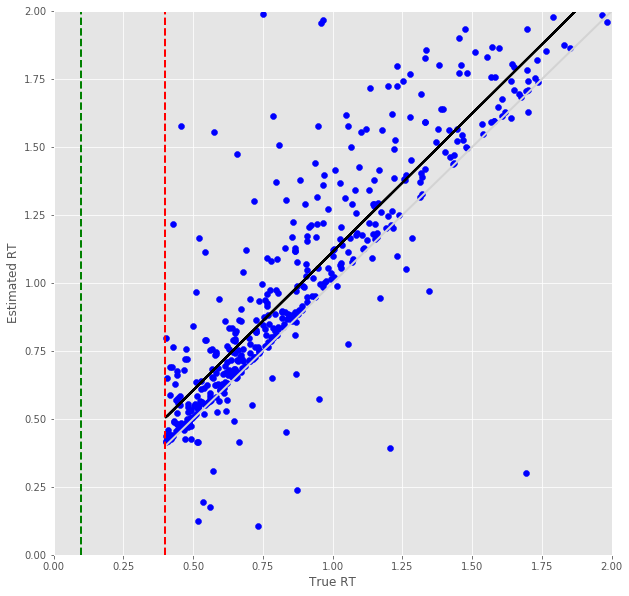

Error Prediction Score: 0.2599 RMSE
RT Prediction Score: 0.2919 RMSE
Error Prediction Corr: 0.8287
RT Prediction Corr: 0.7986
R^2 score for regression on Error: 0.6867
k = 0.9120


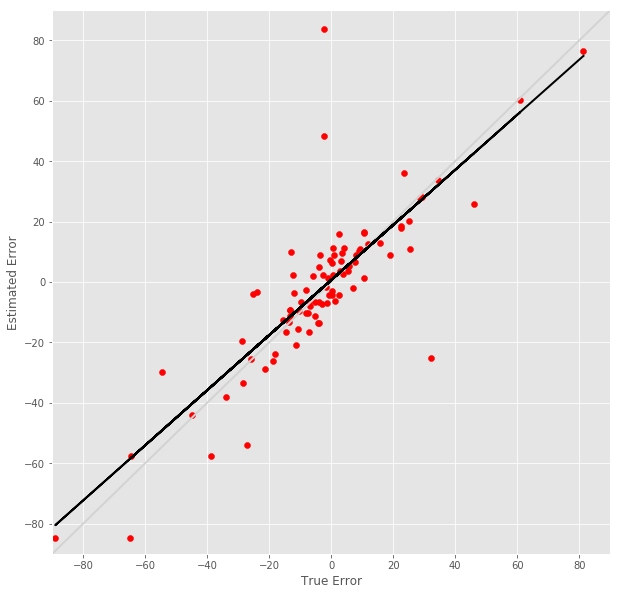

R^2 score for regression on RT: 0.6378
k = 0.9488


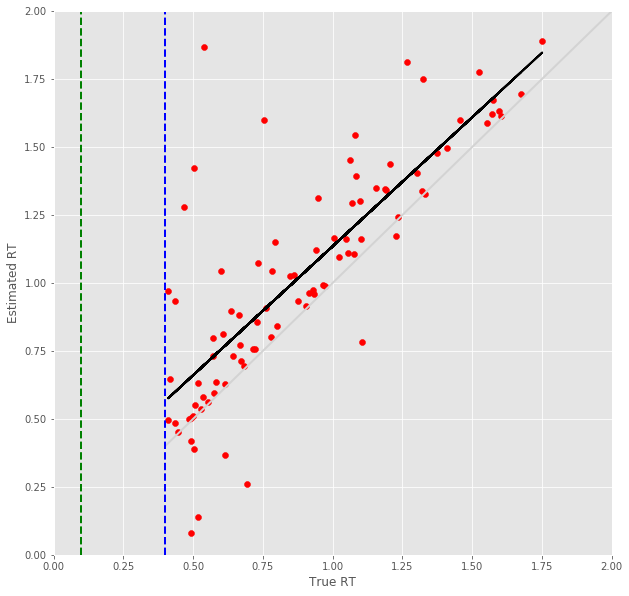

9 -step(s) forecast:
Test Score for 9 -steps forecast: 1.6672 RMSE
Predict Score for 9 -steps forecast: 1.5473 RMSE
Error Test Score for 9 -steps forecast: 0.2196 RMSE
RT Test Score for 9 -steps forecast: 0.2622 RMSE
Error Test Corr for 9 -steps forecast: 0.9164
RT Test Corr for 9 -steps forecast: 0.8400


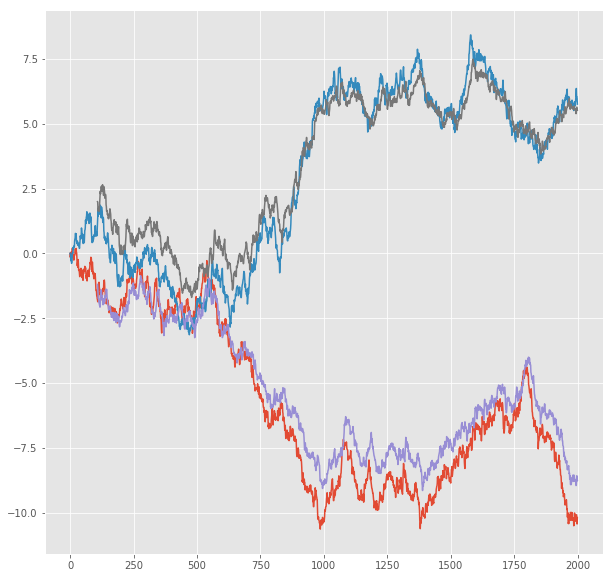

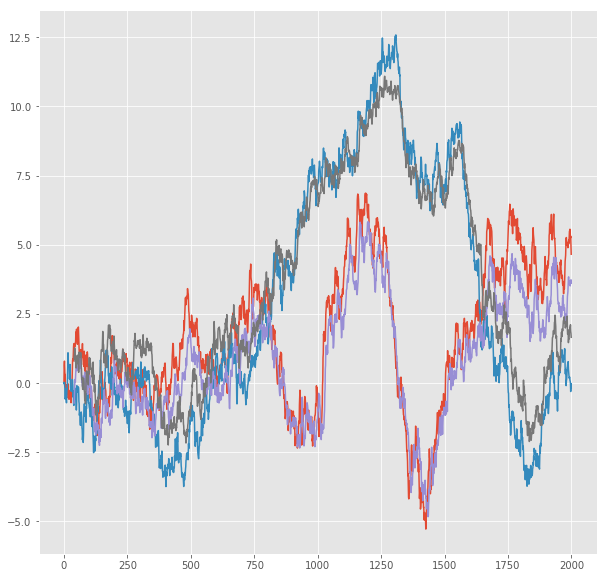

R^2 score for regression on Error: 0.8398
k = 0.9751


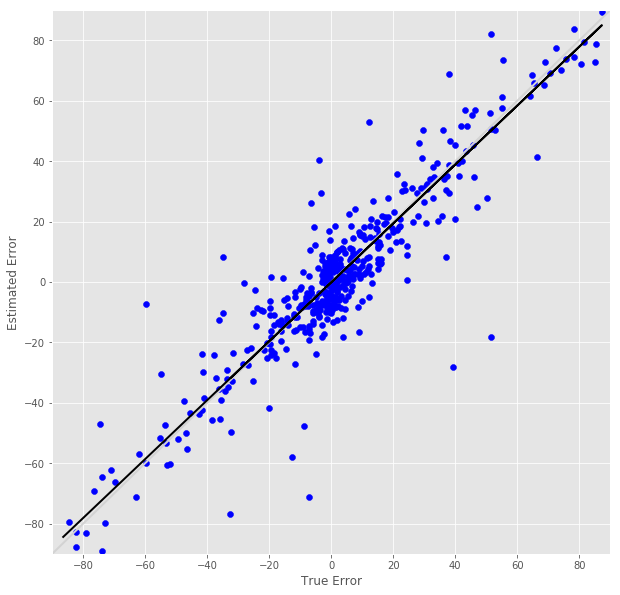

R^2 score for regression on RT: 0.7056
k = 1.0058


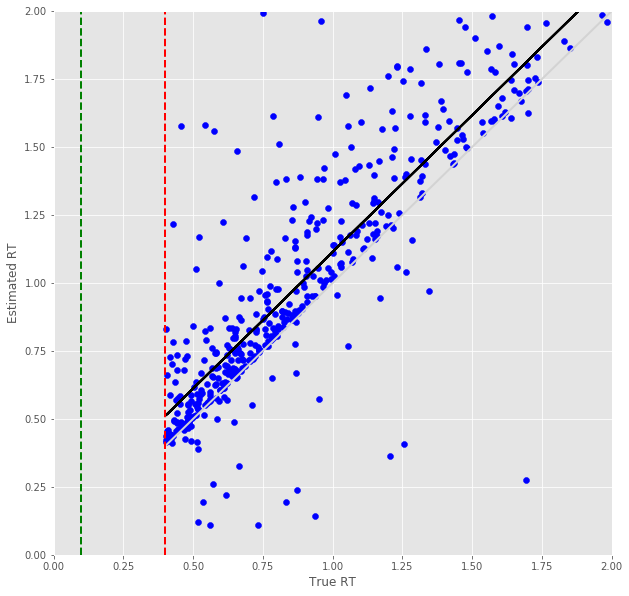

Error Prediction Score: 0.2634 RMSE
RT Prediction Score: 0.3235 RMSE
Error Prediction Corr: 0.8269
RT Prediction Corr: 0.7893
R^2 score for regression on Error: 0.6838
k = 0.9149


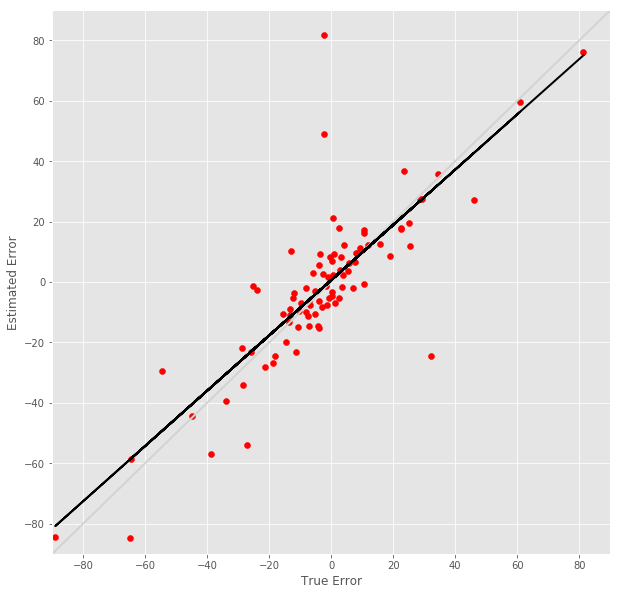

R^2 score for regression on RT: 0.6231
k = 1.0011


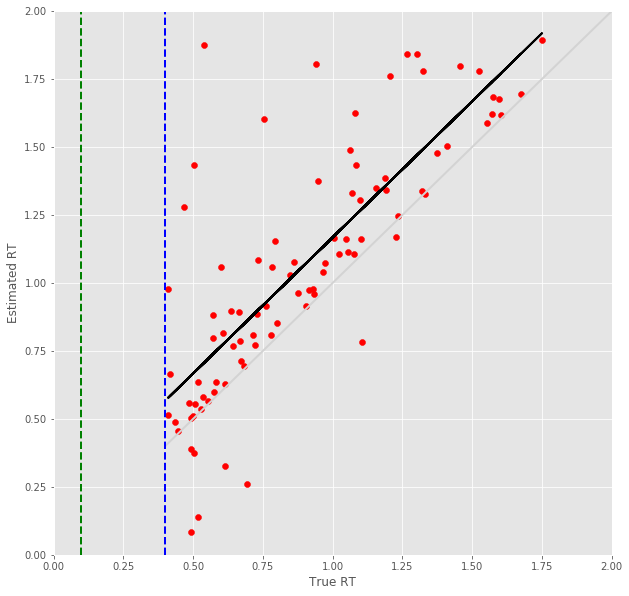

10 -step(s) forecast:
Test Score for 10 -steps forecast: 1.8166 RMSE
Predict Score for 10 -steps forecast: 1.6872 RMSE
Error Test Score for 10 -steps forecast: 0.2410 RMSE
RT Test Score for 10 -steps forecast: 0.2837 RMSE
Error Test Corr for 10 -steps forecast: 0.9027
RT Test Corr for 10 -steps forecast: 0.8131


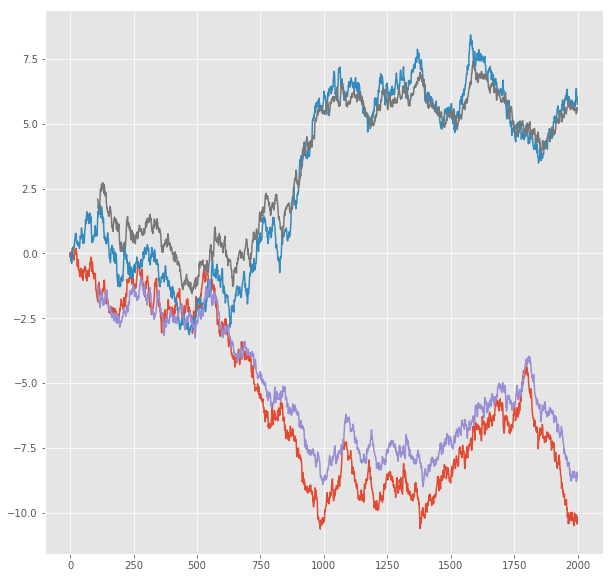

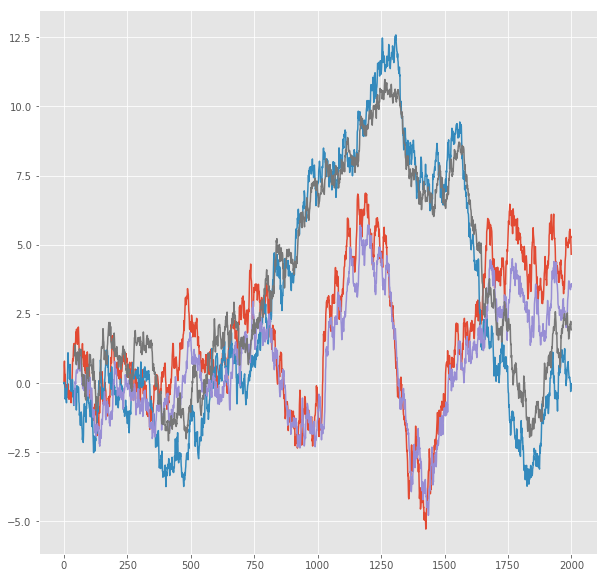

R^2 score for regression on Error: 0.8148
k = 0.9765


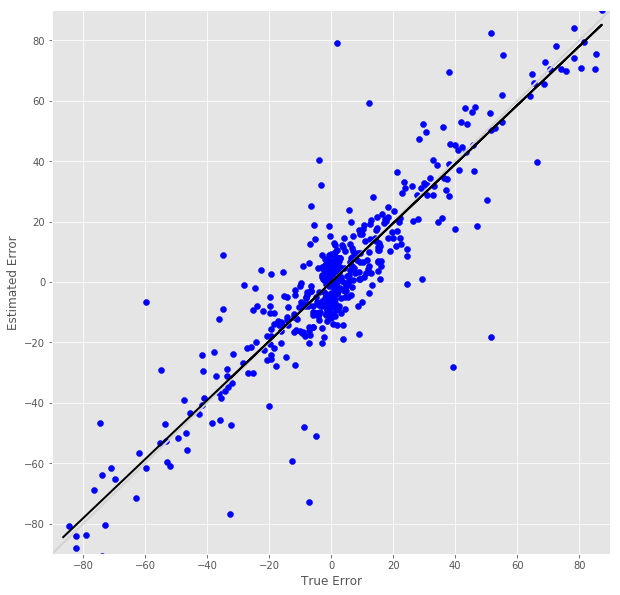

R^2 score for regression on RT: 0.6611
k = 1.0009


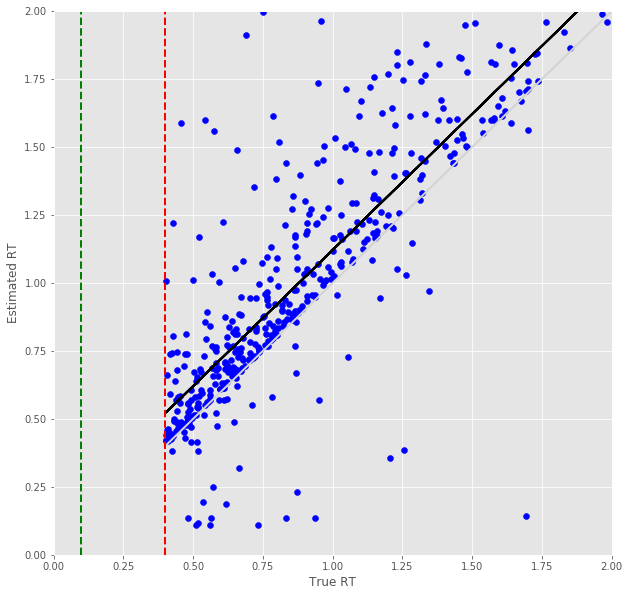

Error Prediction Score: 0.2728 RMSE
RT Prediction Score: 0.3482 RMSE
Error Prediction Corr: 0.8192
RT Prediction Corr: 0.7520
R^2 score for regression on Error: 0.6710
k = 0.9088


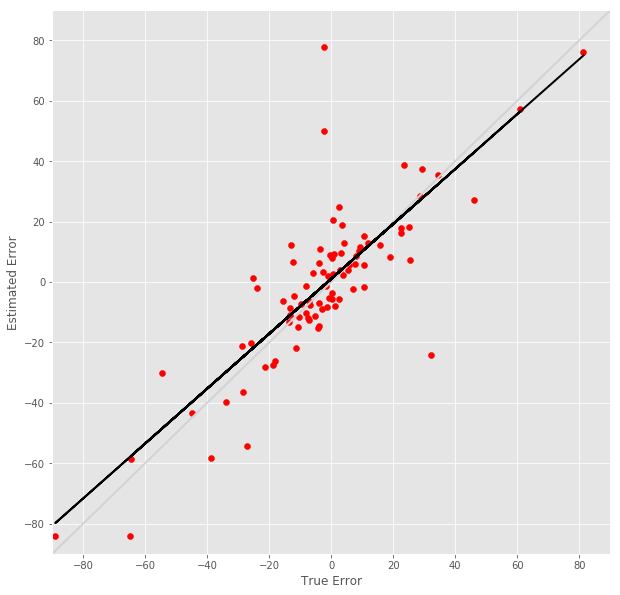

R^2 score for regression on RT: 0.5656
k = 0.9521


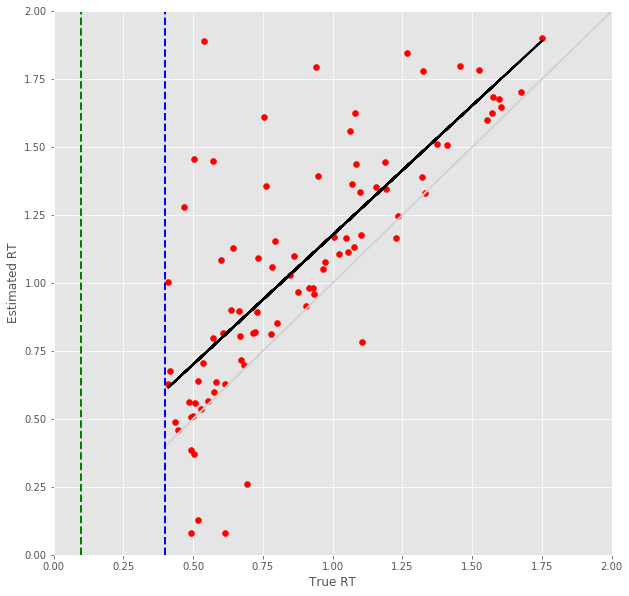

11 -step(s) forecast:
Test Score for 11 -steps forecast: 1.9619 RMSE
Predict Score for 11 -steps forecast: 1.8237 RMSE
Error Test Score for 11 -steps forecast: 0.2580 RMSE
RT Test Score for 11 -steps forecast: 0.3052 RMSE
Error Test Corr for 11 -steps forecast: 0.8902
RT Test Corr for 11 -steps forecast: 0.7876


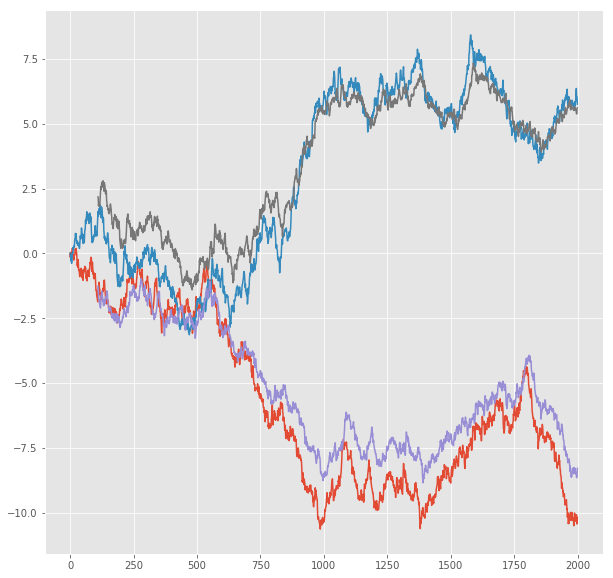

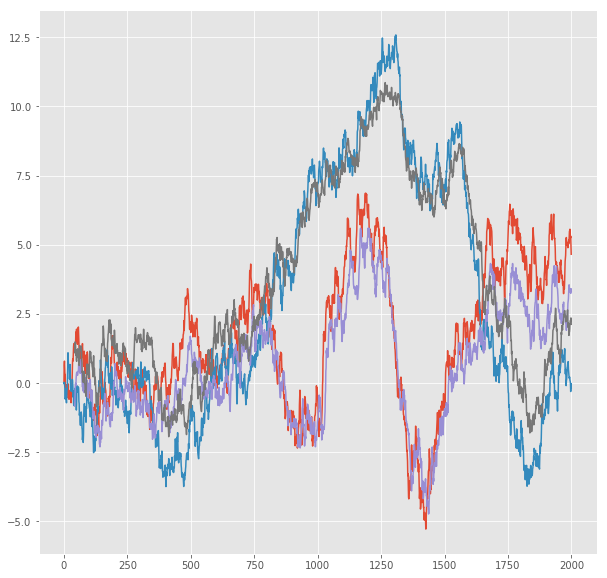

R^2 score for regression on Error: 0.7924
k = 0.9792


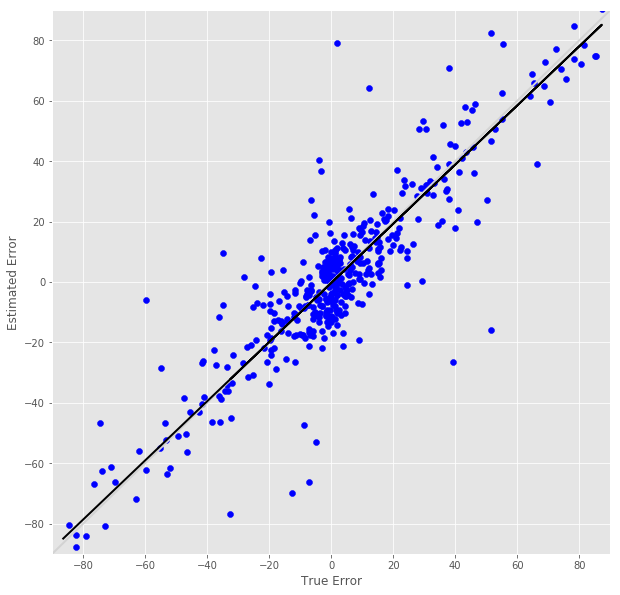

R^2 score for regression on RT: 0.6203
k = 0.9963


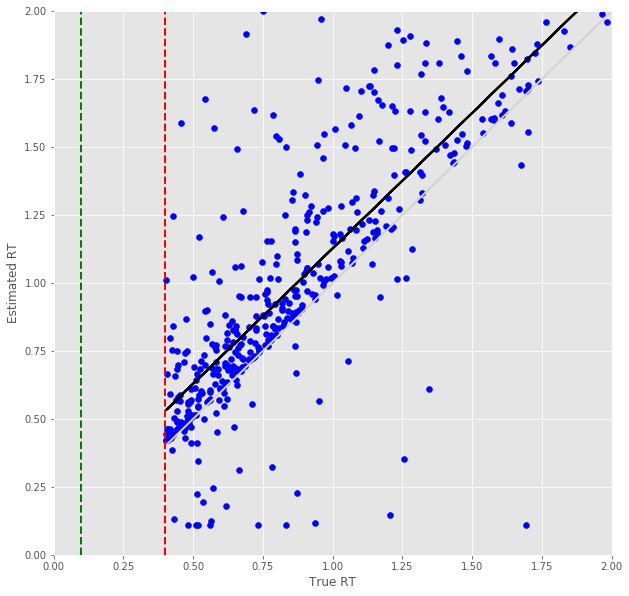

Error Prediction Score: 0.2794 RMSE
RT Prediction Score: 0.3718 RMSE
Error Prediction Corr: 0.8087
RT Prediction Corr: 0.7312
R^2 score for regression on Error: 0.6539
k = 0.8959


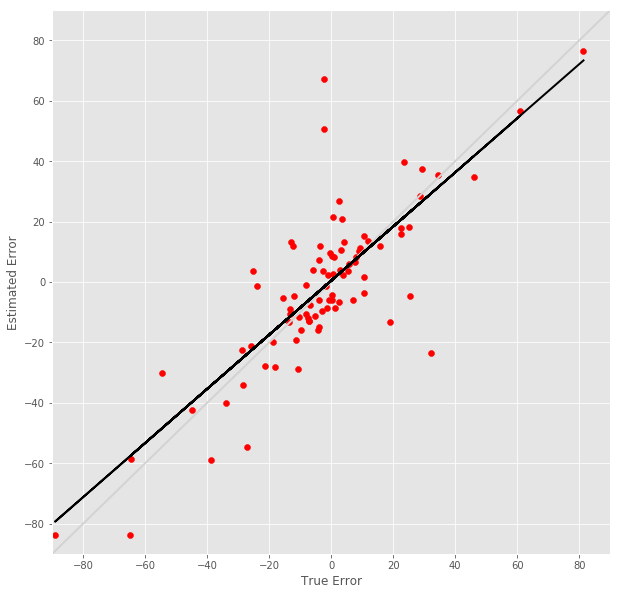

R^2 score for regression on RT: 0.5347
k = 0.9510


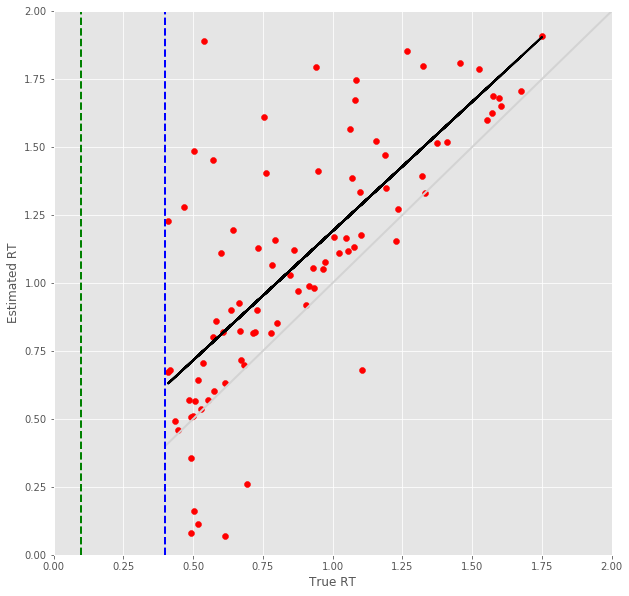

12 -step(s) forecast:
Test Score for 12 -steps forecast: 2.1034 RMSE
Predict Score for 12 -steps forecast: 1.9569 RMSE
Error Test Score for 12 -steps forecast: 0.2706 RMSE
RT Test Score for 12 -steps forecast: 0.3126 RMSE
Error Test Corr for 12 -steps forecast: 0.8801
RT Test Corr for 12 -steps forecast: 0.7786


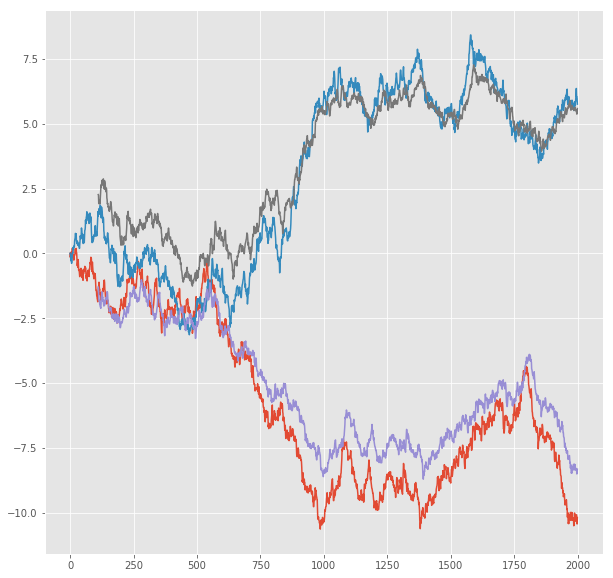

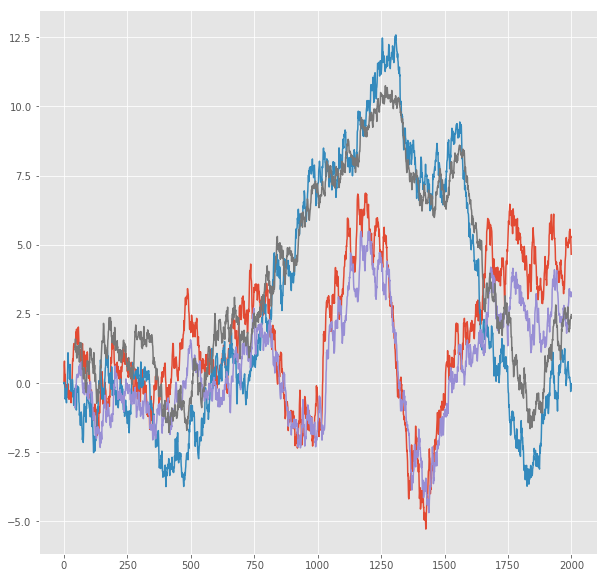

R^2 score for regression on Error: 0.7746
k = 0.9808


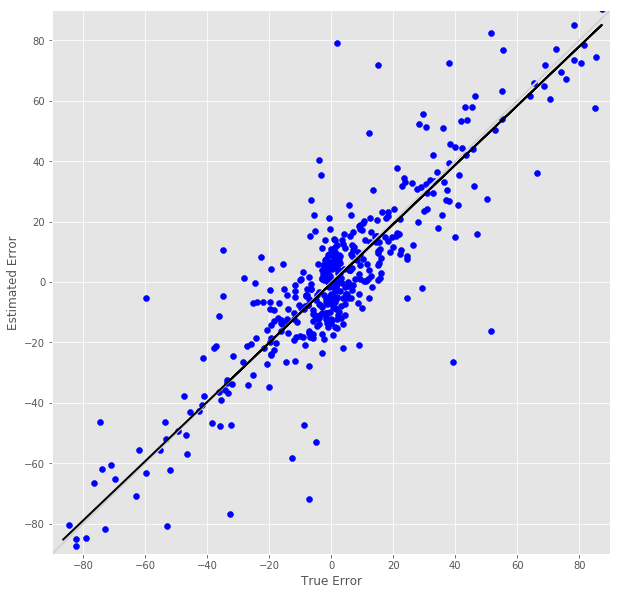

R^2 score for regression on RT: 0.6062
k = 0.9947


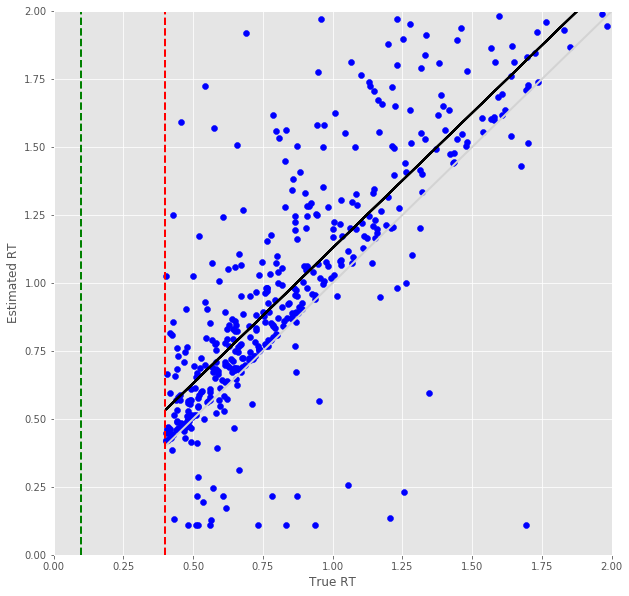

Error Prediction Score: 0.2858 RMSE
RT Prediction Score: 0.3887 RMSE
Error Prediction Corr: 0.8015
RT Prediction Corr: 0.7158
R^2 score for regression on Error: 0.6425
k = 0.8942


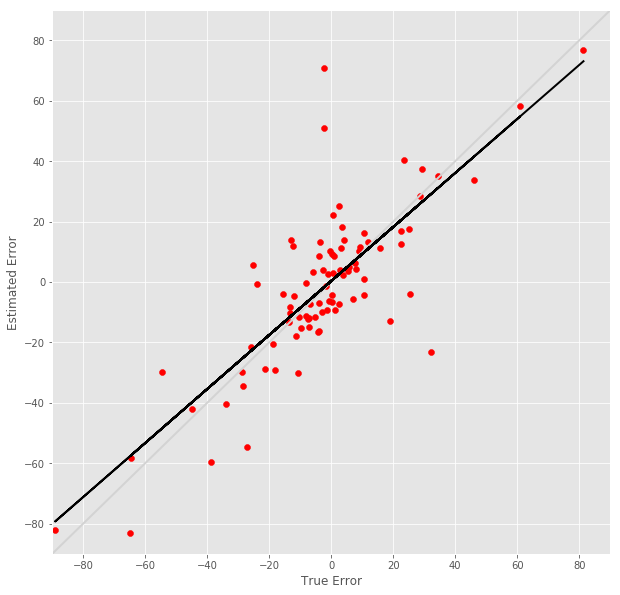

R^2 score for regression on RT: 0.5123
k = 0.9453


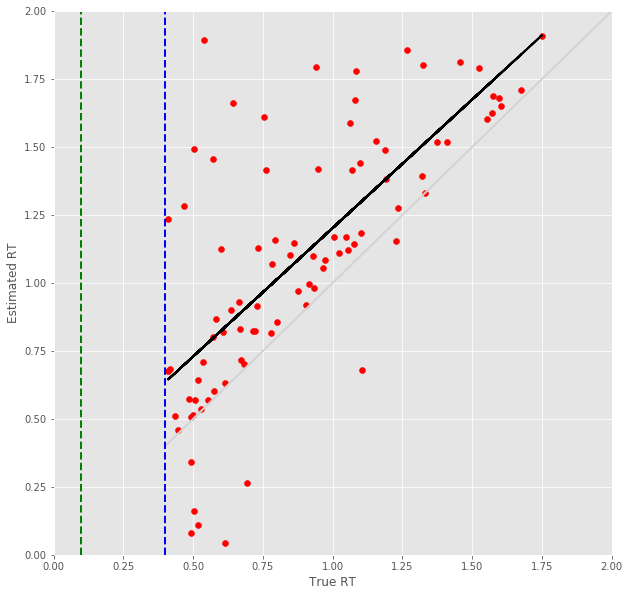

13 -step(s) forecast:
Test Score for 13 -steps forecast: 2.2410 RMSE
Predict Score for 13 -steps forecast: 2.0867 RMSE
Error Test Score for 13 -steps forecast: 0.2928 RMSE
RT Test Score for 13 -steps forecast: 0.3336 RMSE
Error Test Corr for 13 -steps forecast: 0.8568
RT Test Corr for 13 -steps forecast: 0.7408


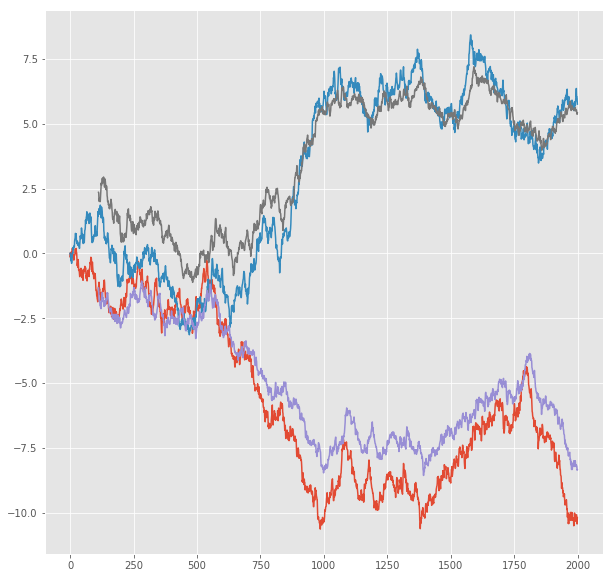

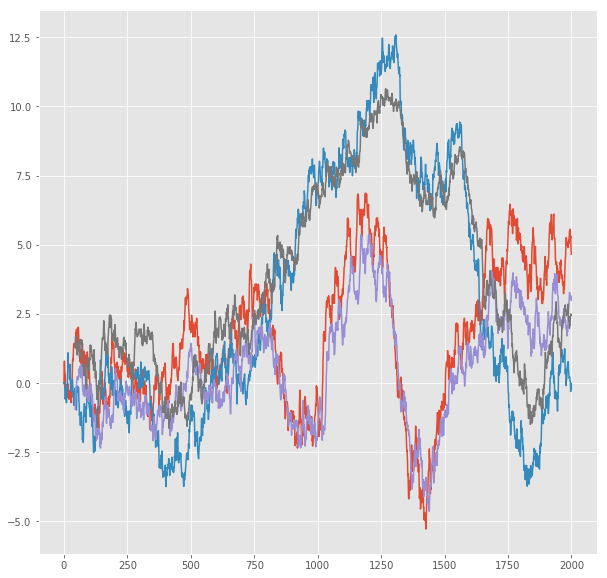

R^2 score for regression on Error: 0.7341
k = 0.9503


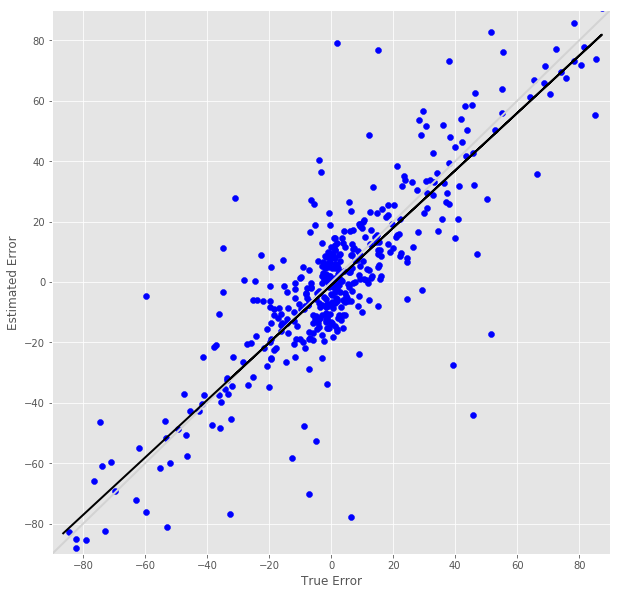

R^2 score for regression on RT: 0.5488
k = 0.9614


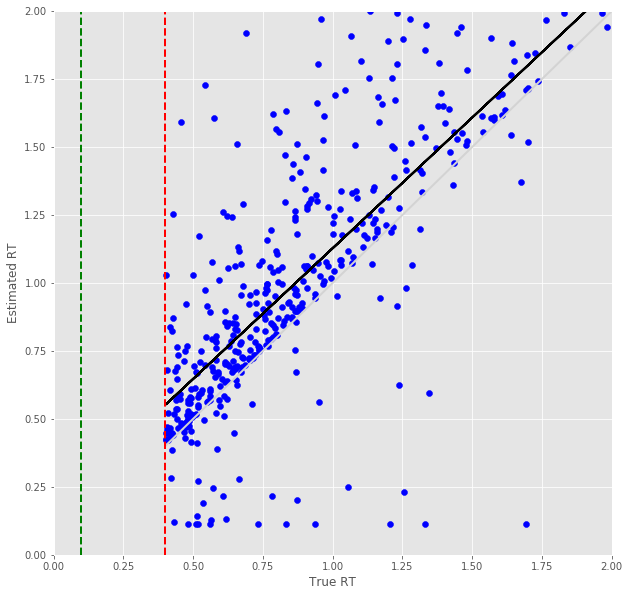

Error Prediction Score: 0.3030 RMSE
RT Prediction Score: 0.4058 RMSE
Error Prediction Corr: 0.7868
RT Prediction Corr: 0.7009
R^2 score for regression on Error: 0.6190
k = 0.9050


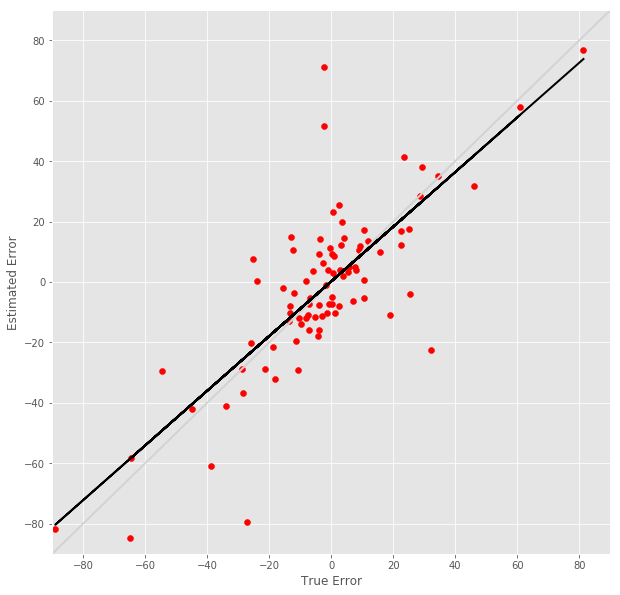

R^2 score for regression on RT: 0.4913
k = 0.9340


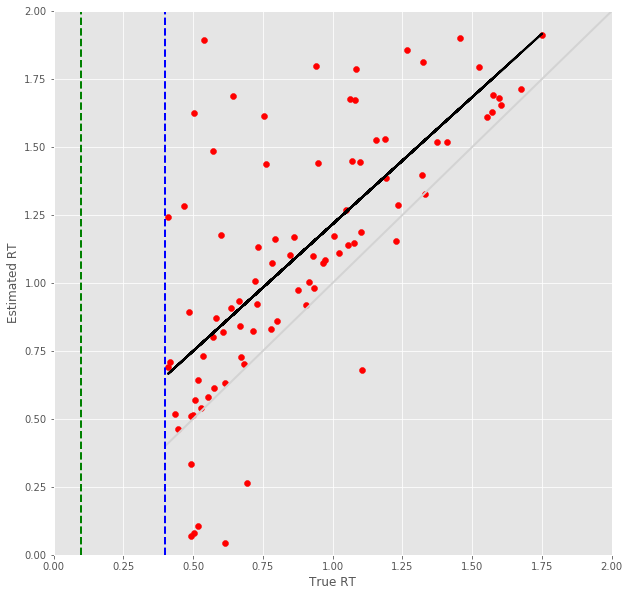

14 -step(s) forecast:
Test Score for 14 -steps forecast: 2.3748 RMSE
Predict Score for 14 -steps forecast: 2.2132 RMSE
Error Test Score for 14 -steps forecast: 0.3036 RMSE
RT Test Score for 14 -steps forecast: 0.3452 RMSE
Error Test Corr for 14 -steps forecast: 0.8463
RT Test Corr for 14 -steps forecast: 0.7249


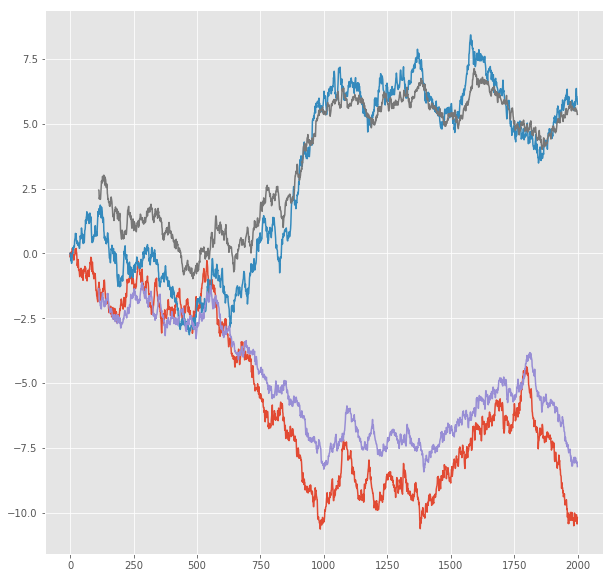

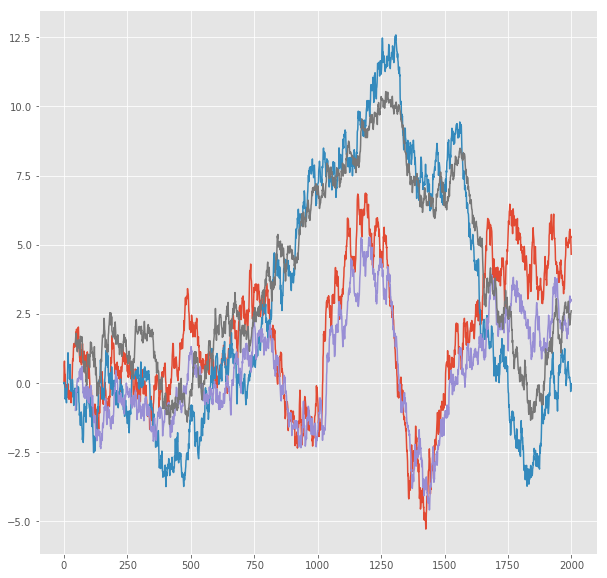

R^2 score for regression on Error: 0.7162
k = 0.9502


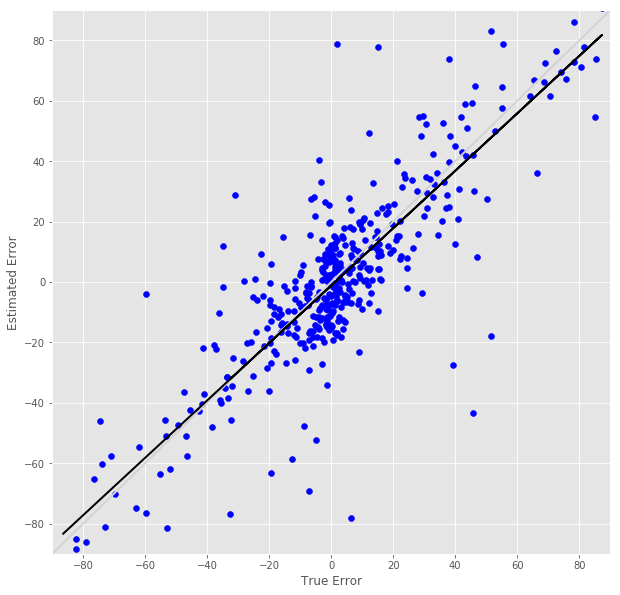

R^2 score for regression on RT: 0.5254
k = 0.9472


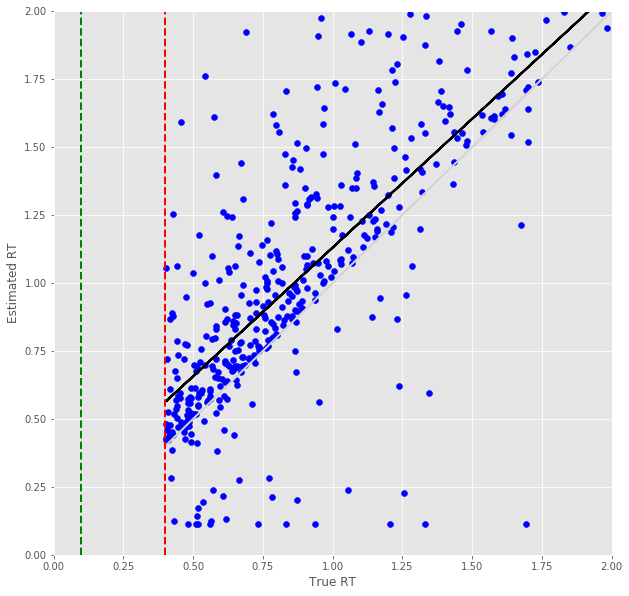

Error Prediction Score: 0.3131 RMSE
RT Prediction Score: 0.4265 RMSE
Error Prediction Corr: 0.7699
RT Prediction Corr: 0.6805
R^2 score for regression on Error: 0.5927
k = 0.8817


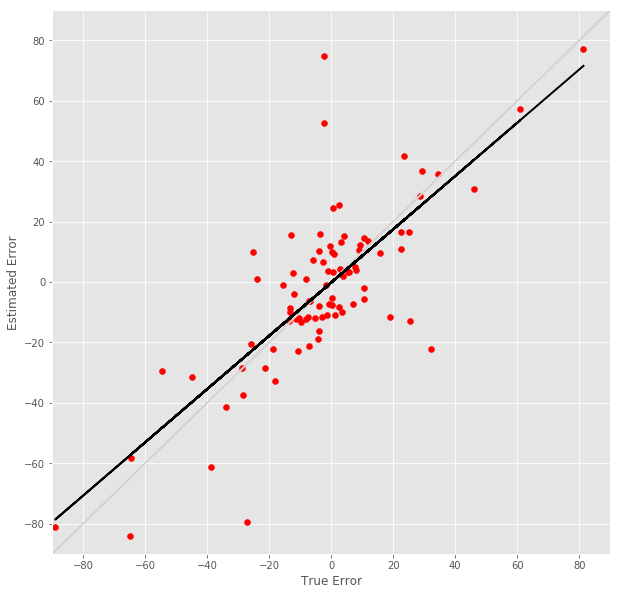

R^2 score for regression on RT: 0.4630
k = 0.9193


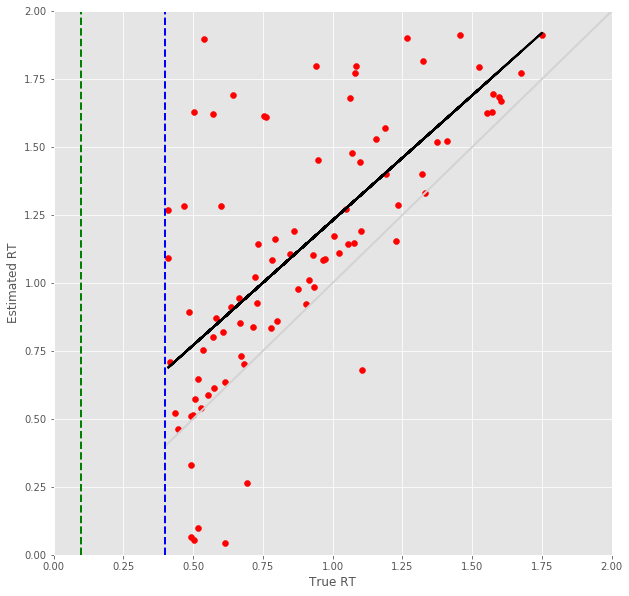

15 -step(s) forecast:
Test Score for 15 -steps forecast: 2.5049 RMSE
Predict Score for 15 -steps forecast: 2.3364 RMSE
Error Test Score for 15 -steps forecast: 0.3166 RMSE
RT Test Score for 15 -steps forecast: 0.3605 RMSE
Error Test Corr for 15 -steps forecast: 0.8360
RT Test Corr for 15 -steps forecast: 0.6943


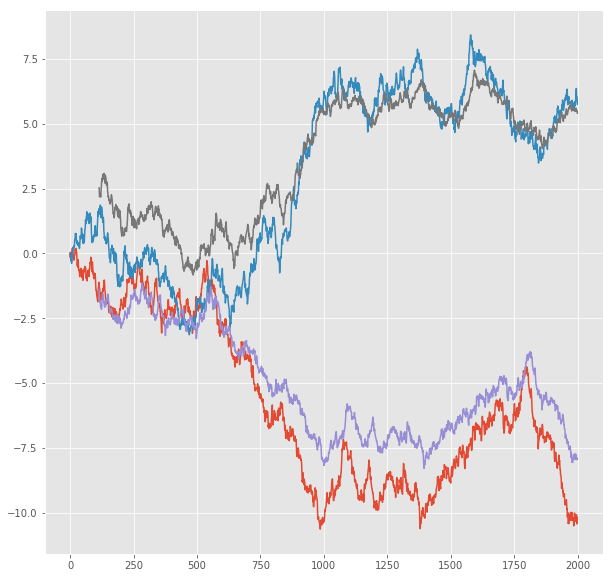

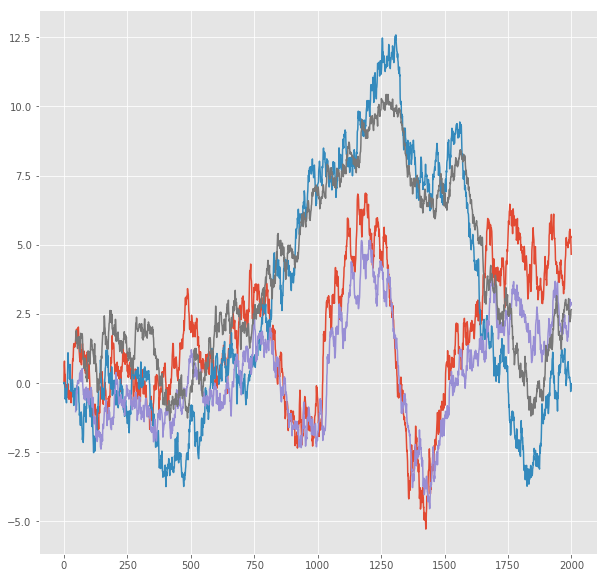

R^2 score for regression on Error: 0.6990
k = 0.9466


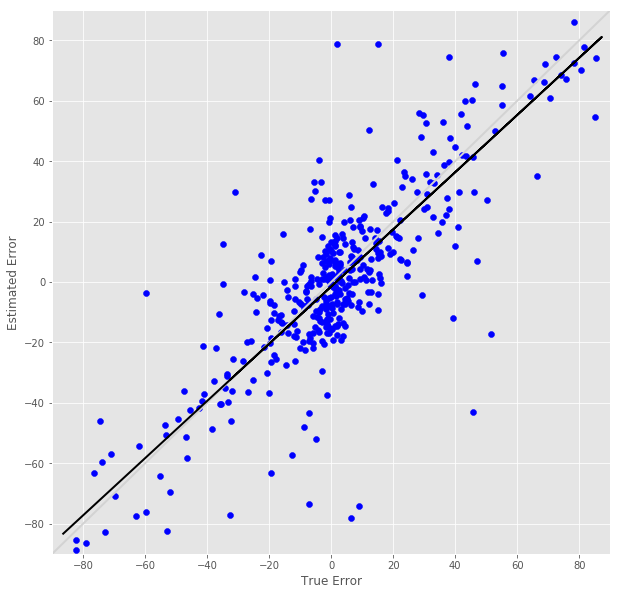

R^2 score for regression on RT: 0.4821
k = 0.9238


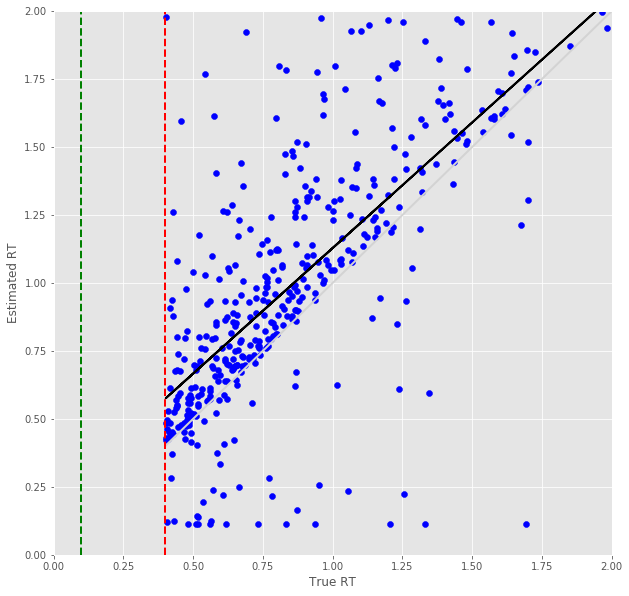

Error Prediction Score: 0.3218 RMSE
RT Prediction Score: 0.4508 RMSE
Error Prediction Corr: 0.7636
RT Prediction Corr: 0.6532
R^2 score for regression on Error: 0.5830
k = 0.8903


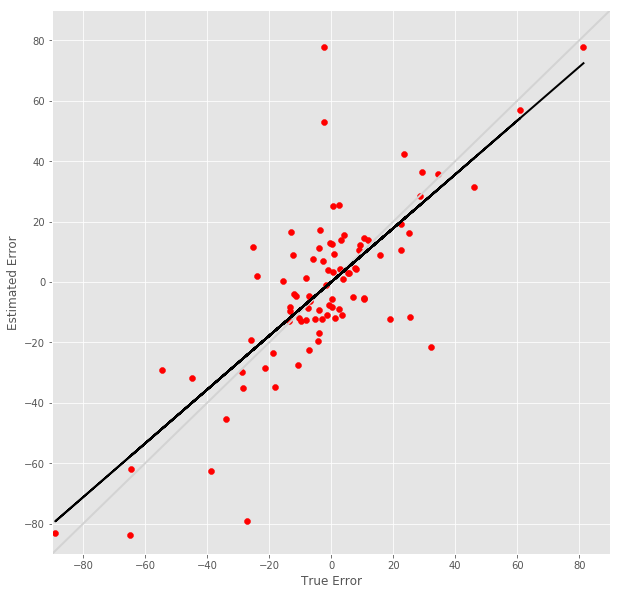

R^2 score for regression on RT: 0.4266
k = 0.8951


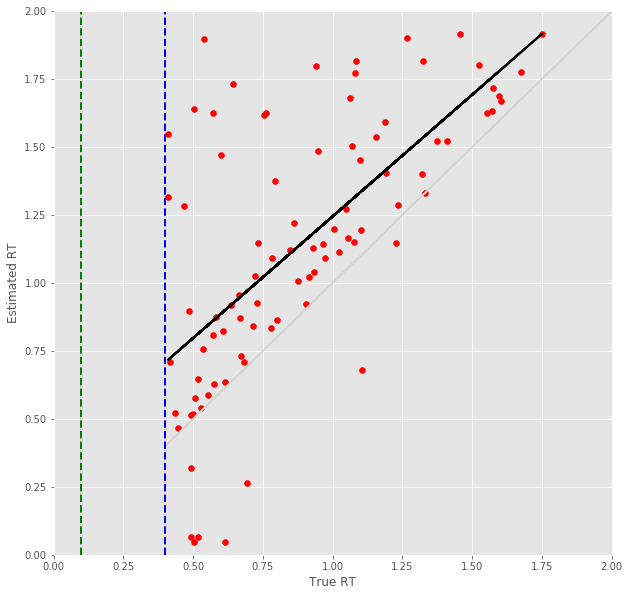

16 -step(s) forecast:
Test Score for 16 -steps forecast: 2.6314 RMSE
Predict Score for 16 -steps forecast: 2.4563 RMSE
Error Test Score for 16 -steps forecast: 0.3246 RMSE
RT Test Score for 16 -steps forecast: 0.3786 RMSE
Error Test Corr for 16 -steps forecast: 0.8261
RT Test Corr for 16 -steps forecast: 0.6675


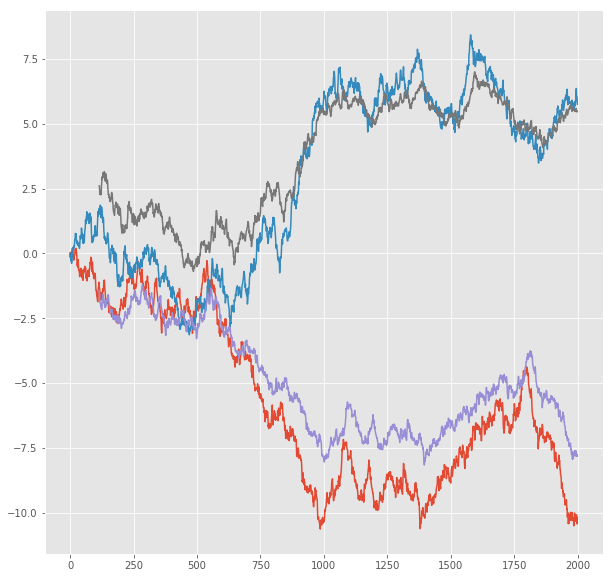

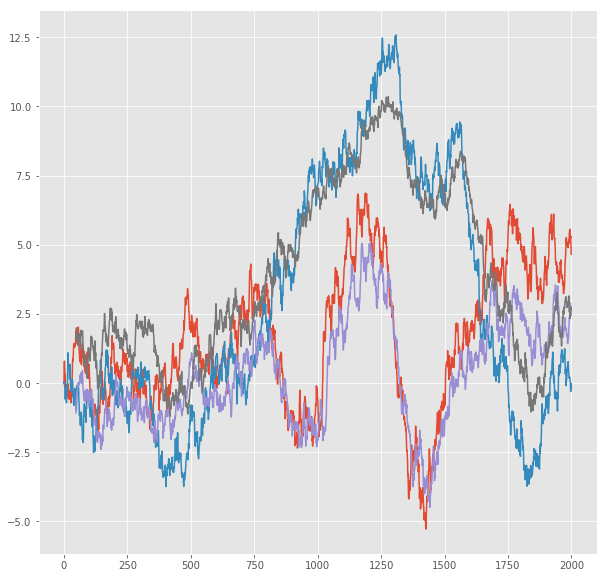

R^2 score for regression on Error: 0.6825
k = 0.9368


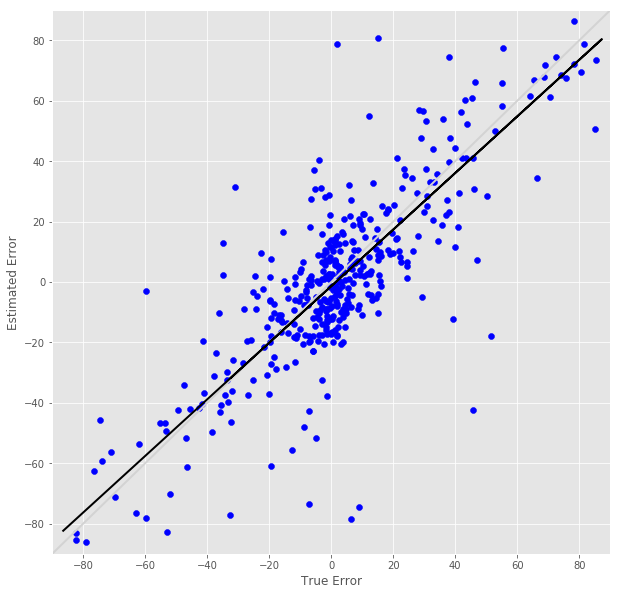

R^2 score for regression on RT: 0.4455
k = 0.9030


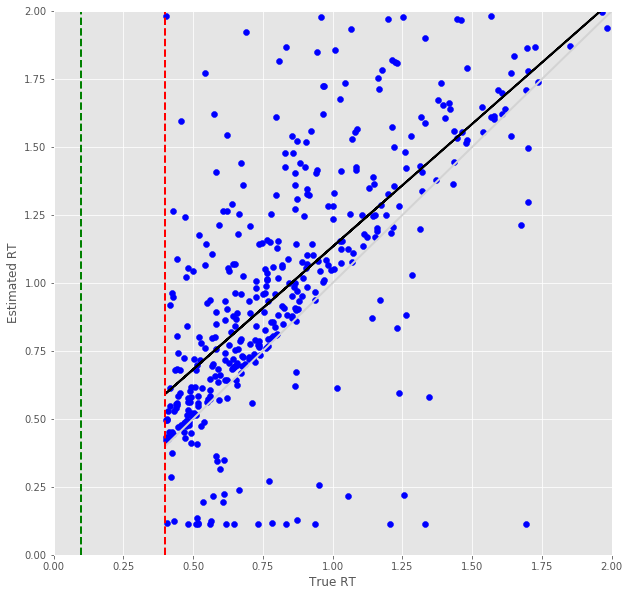

Error Prediction Score: 0.3489 RMSE
RT Prediction Score: 0.4865 RMSE
Error Prediction Corr: 0.7314
RT Prediction Corr: 0.6429
R^2 score for regression on Error: 0.5350
k = 0.8739


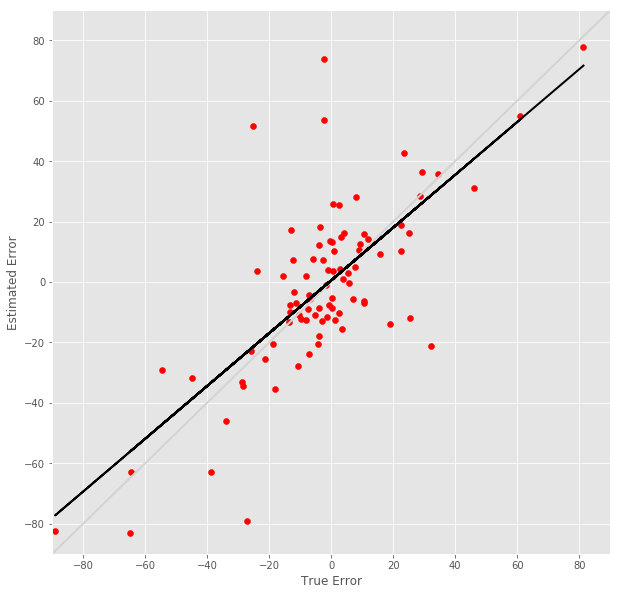

R^2 score for regression on RT: 0.4133
k = 0.9374


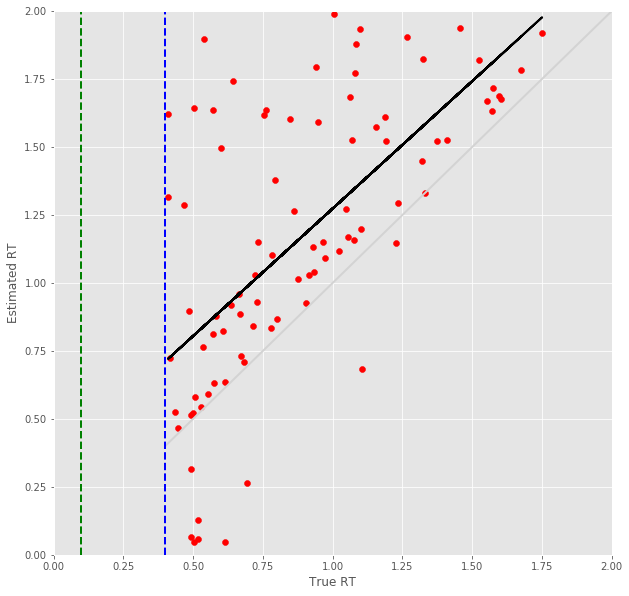

17 -step(s) forecast:
Test Score for 17 -steps forecast: 2.7544 RMSE
Predict Score for 17 -steps forecast: 2.5732 RMSE
Error Test Score for 17 -steps forecast: 0.3447 RMSE
RT Test Score for 17 -steps forecast: 0.3953 RMSE
Error Test Corr for 17 -steps forecast: 0.8101
RT Test Corr for 17 -steps forecast: 0.6462


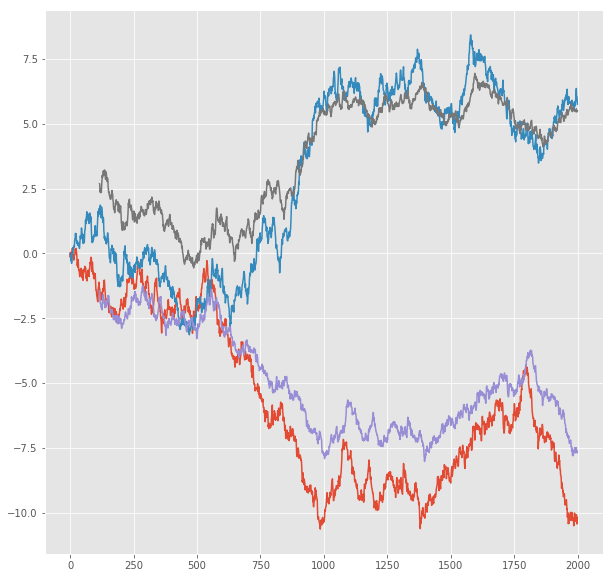

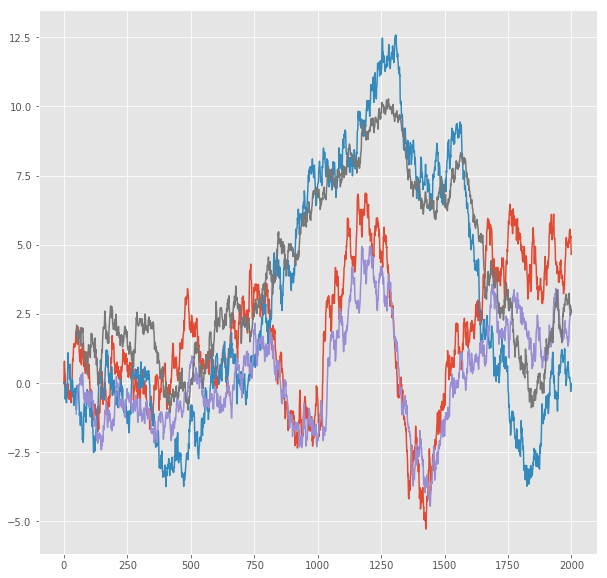

R^2 score for regression on Error: 0.6563
k = 0.9391


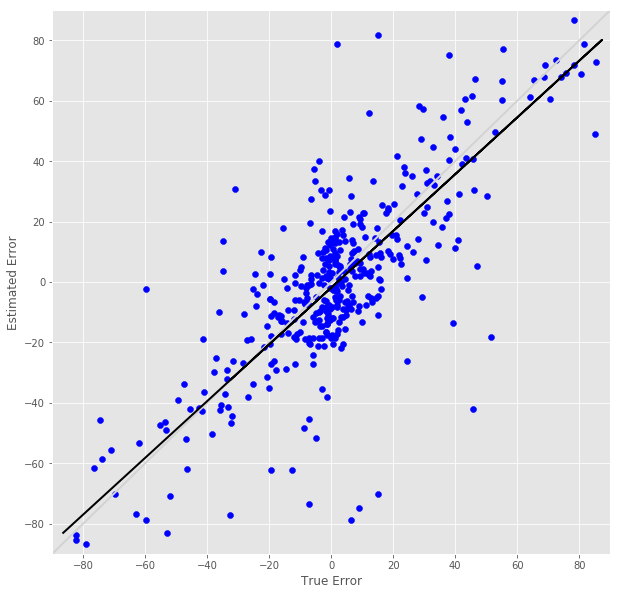

R^2 score for regression on RT: 0.4176
k = 0.8935


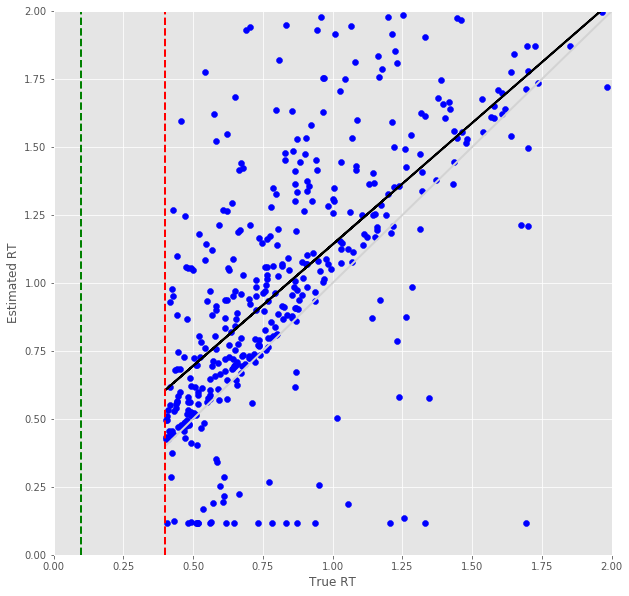

Error Prediction Score: 0.3632 RMSE
RT Prediction Score: 0.5049 RMSE
Error Prediction Corr: 0.7366
RT Prediction Corr: 0.6029
R^2 score for regression on Error: 0.5426
k = 0.9084


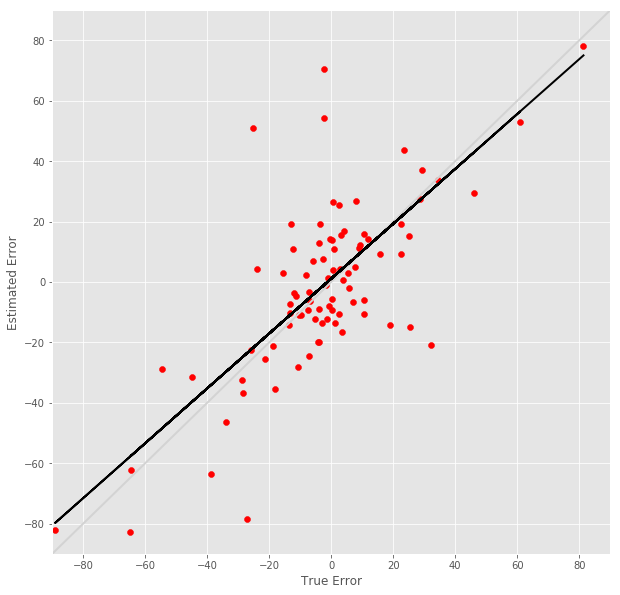

R^2 score for regression on RT: 0.3635
k = 0.9104


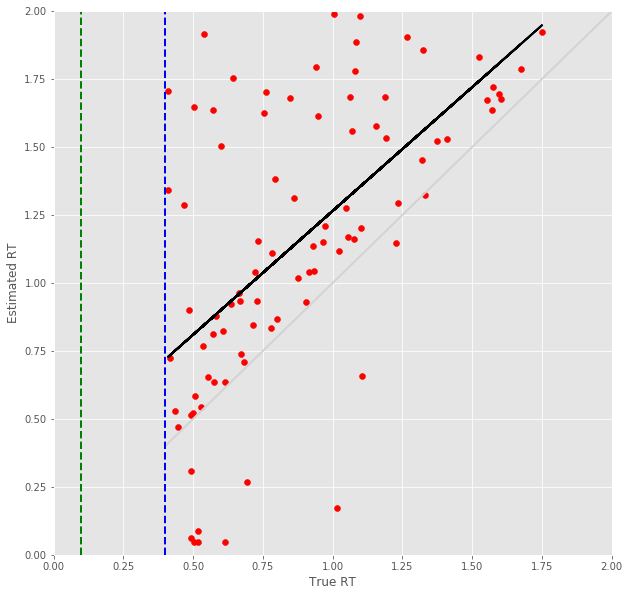

18 -step(s) forecast:
Test Score for 18 -steps forecast: 2.8740 RMSE
Predict Score for 18 -steps forecast: 2.6870 RMSE
Error Test Score for 18 -steps forecast: 0.3621 RMSE
RT Test Score for 18 -steps forecast: 0.4118 RMSE
Error Test Corr for 18 -steps forecast: 0.7976
RT Test Corr for 18 -steps forecast: 0.6160


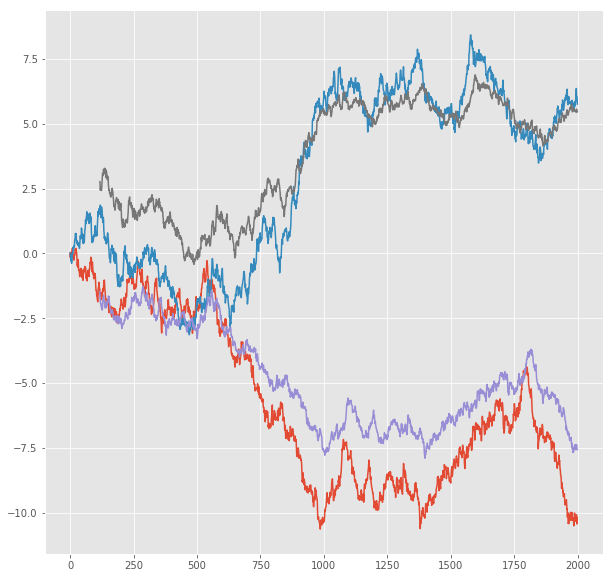

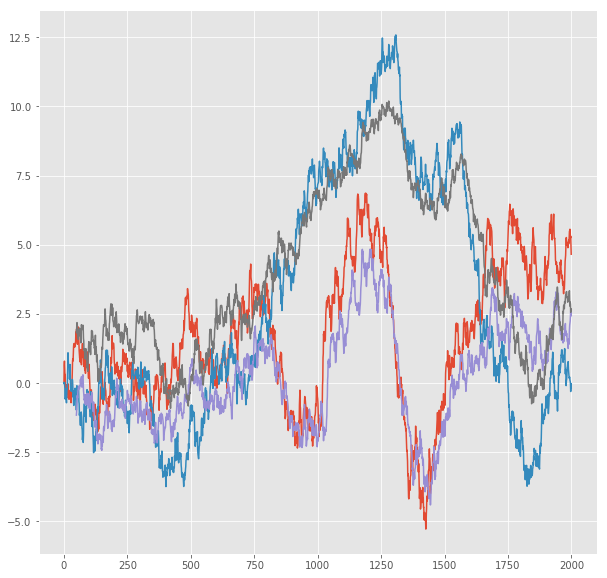

R^2 score for regression on Error: 0.6362
k = 0.9446


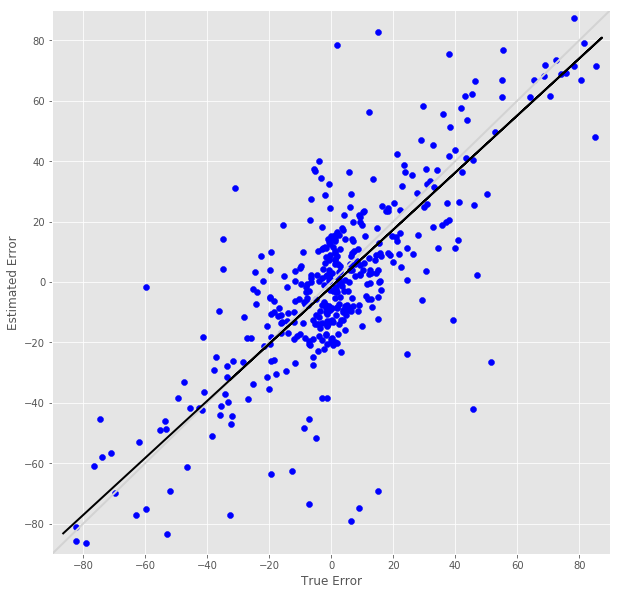

R^2 score for regression on RT: 0.3795
k = 0.8654


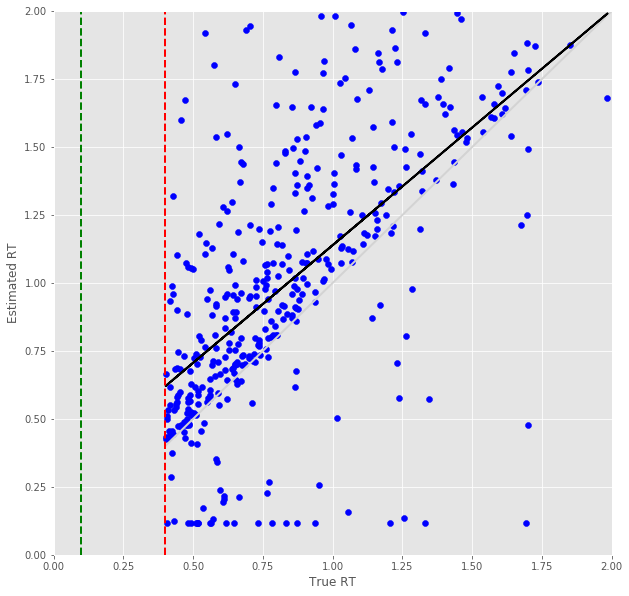

Error Prediction Score: 0.3632 RMSE
RT Prediction Score: 0.5205 RMSE
Error Prediction Corr: 0.7410
RT Prediction Corr: 0.5771
R^2 score for regression on Error: 0.5491
k = 0.9158


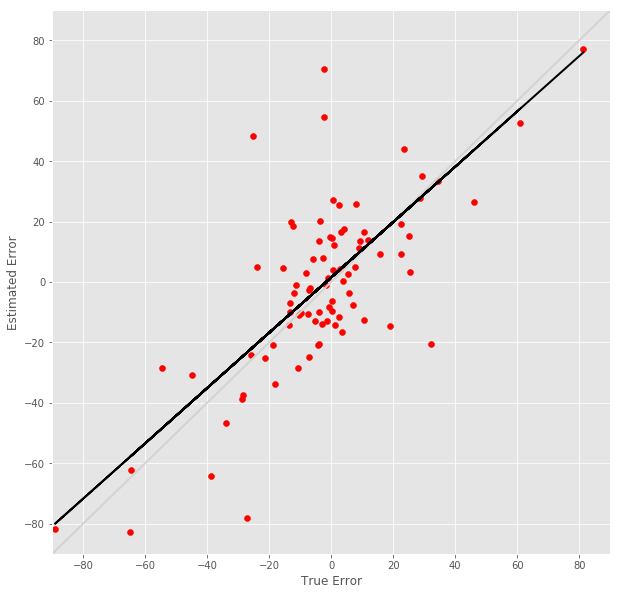

R^2 score for regression on RT: 0.3330
k = 0.8786


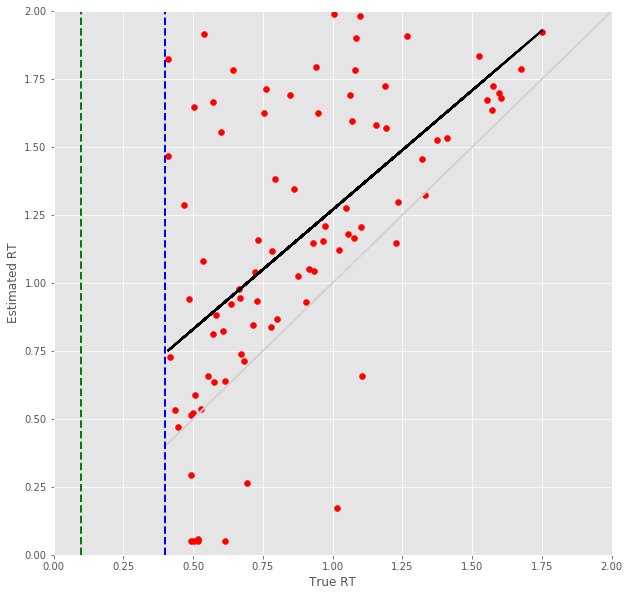

19 -step(s) forecast:
Test Score for 19 -steps forecast: 2.9903 RMSE
Predict Score for 19 -steps forecast: 2.7978 RMSE
Error Test Score for 19 -steps forecast: 0.3691 RMSE
RT Test Score for 19 -steps forecast: 0.4210 RMSE
Error Test Corr for 19 -steps forecast: 0.7915
RT Test Corr for 19 -steps forecast: 0.5978


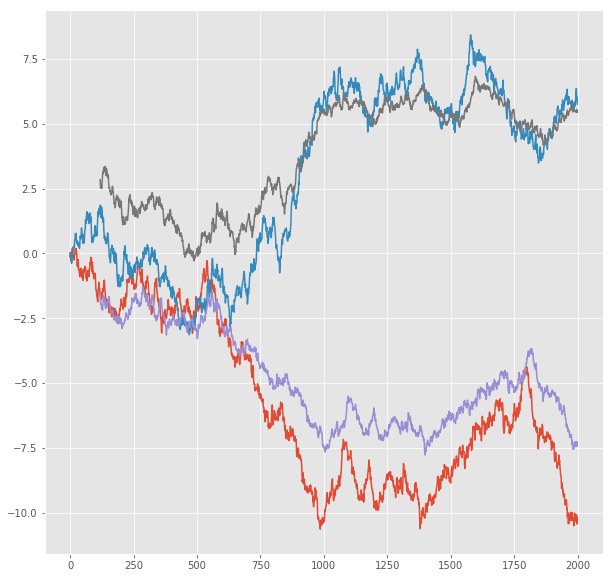

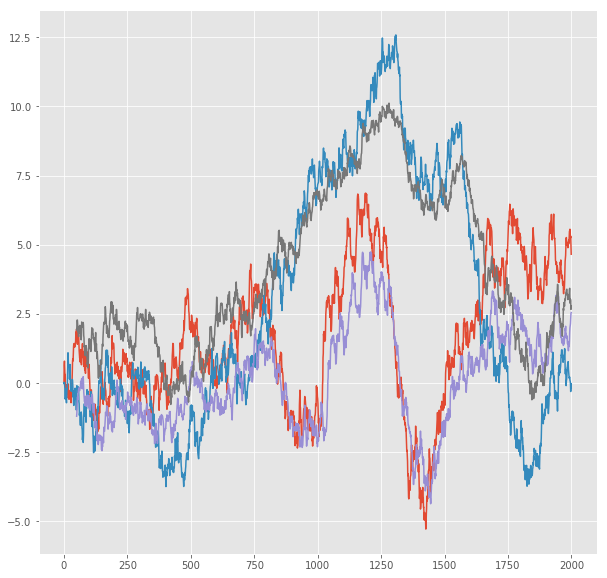

R^2 score for regression on Error: 0.6264
k = 0.9426


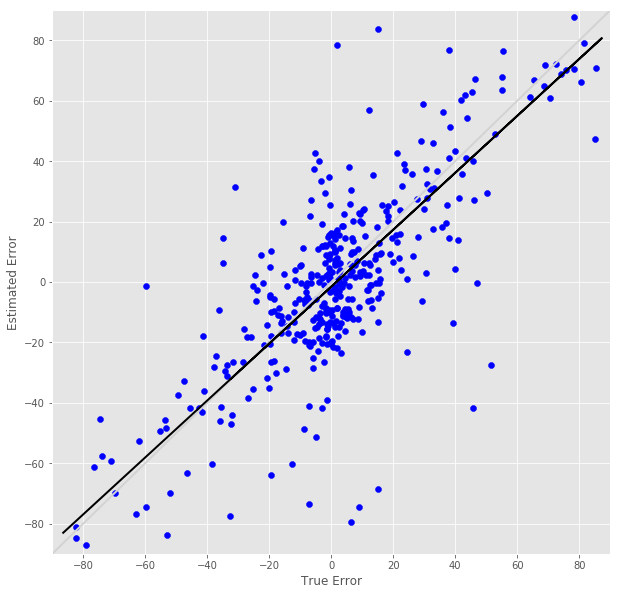

R^2 score for regression on RT: 0.3573
k = 0.8418


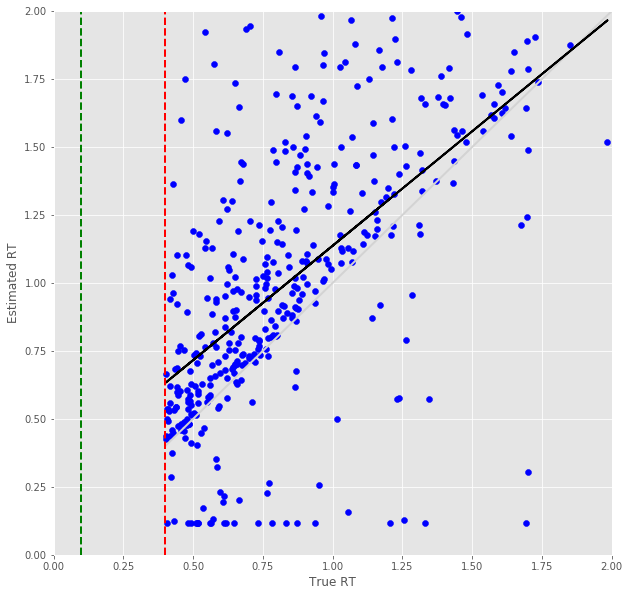

Error Prediction Score: 0.3690 RMSE
RT Prediction Score: 0.5425 RMSE
Error Prediction Corr: 0.7288
RT Prediction Corr: 0.5495
R^2 score for regression on Error: 0.5312
k = 0.8930


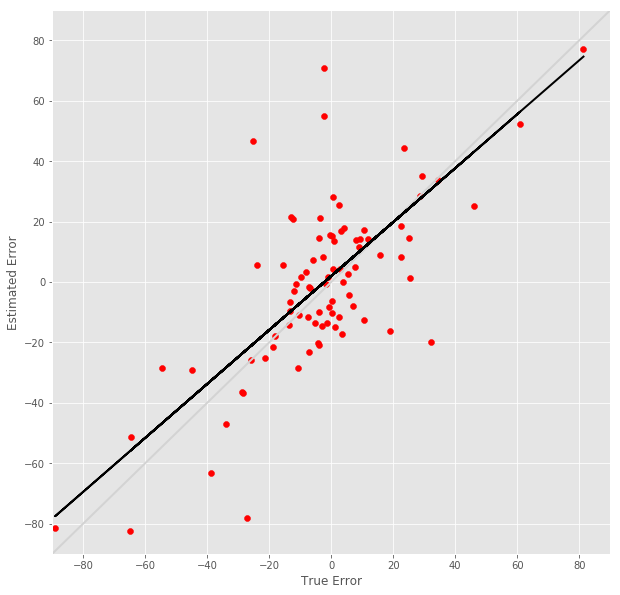

R^2 score for regression on RT: 0.3020
k = 0.8594


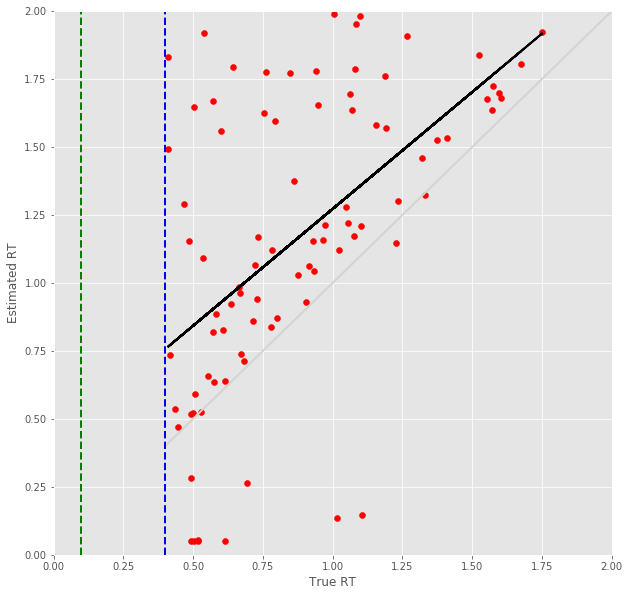

20 -step(s) forecast:
Test Score for 20 -steps forecast: 3.1035 RMSE
Predict Score for 20 -steps forecast: 2.9058 RMSE
Error Test Score for 20 -steps forecast: 0.3808 RMSE
RT Test Score for 20 -steps forecast: 0.4461 RMSE
Error Test Corr for 20 -steps forecast: 0.7841
RT Test Corr for 20 -steps forecast: 0.5387


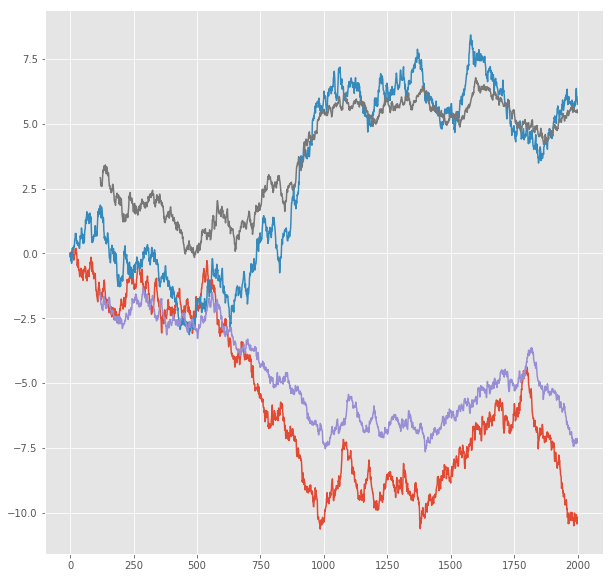

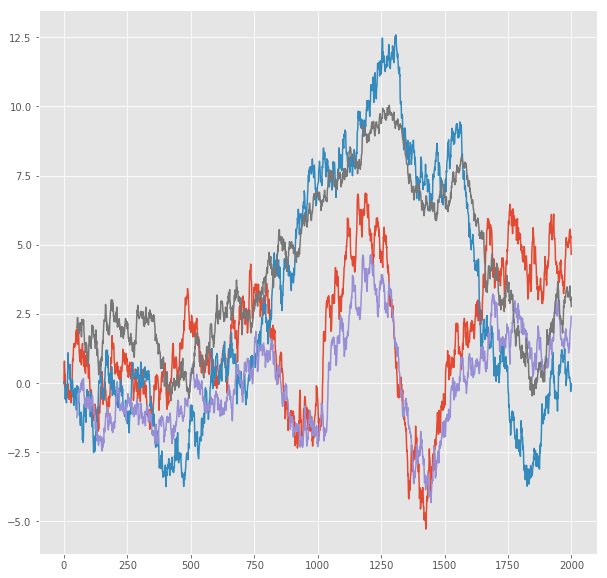

R^2 score for regression on Error: 0.6148
k = 0.9447


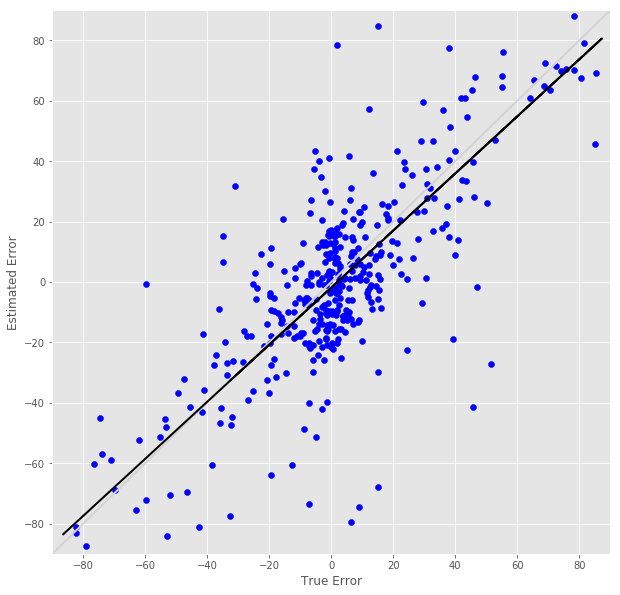

R^2 score for regression on RT: 0.2901
k = 0.7721


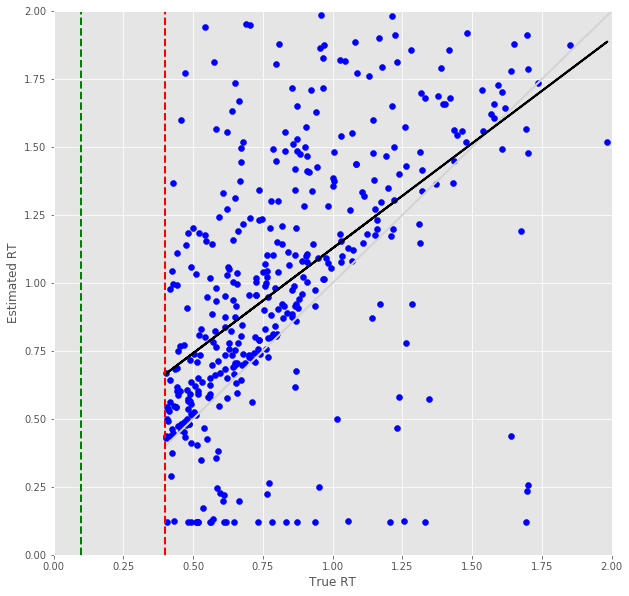

Error Prediction Score: 0.3823 RMSE
RT Prediction Score: 0.5390 RMSE
Error Prediction Corr: 0.7143
RT Prediction Corr: 0.5315
R^2 score for regression on Error: 0.5102
k = 0.9075


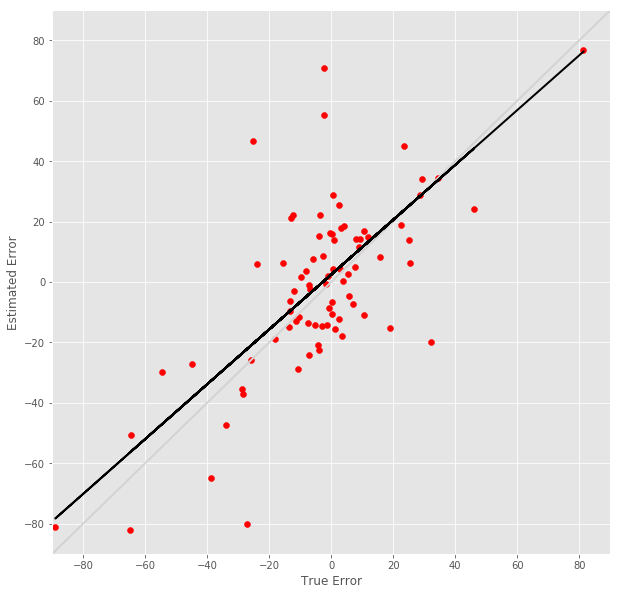

R^2 score for regression on RT: 0.2825
k = 0.8149


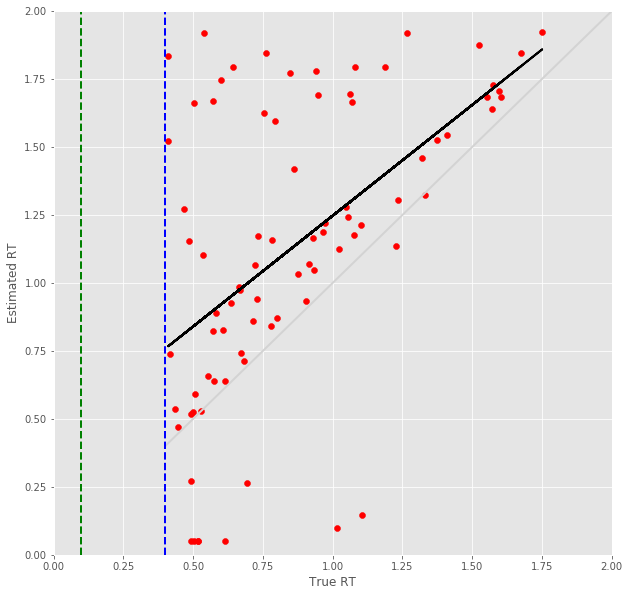

21 -step(s) forecast:
Test Score for 21 -steps forecast: 3.2137 RMSE
Predict Score for 21 -steps forecast: 3.0111 RMSE
Error Test Score for 21 -steps forecast: 0.3962 RMSE
RT Test Score for 21 -steps forecast: 0.4688 RMSE
Error Test Corr for 21 -steps forecast: 0.7718
RT Test Corr for 21 -steps forecast: 0.5046


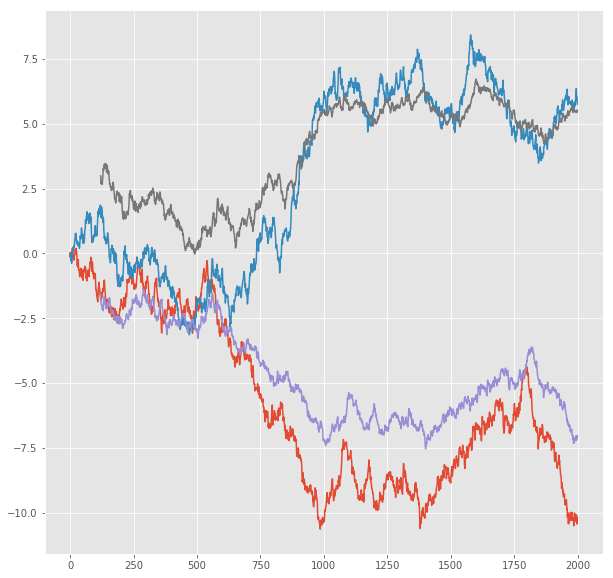

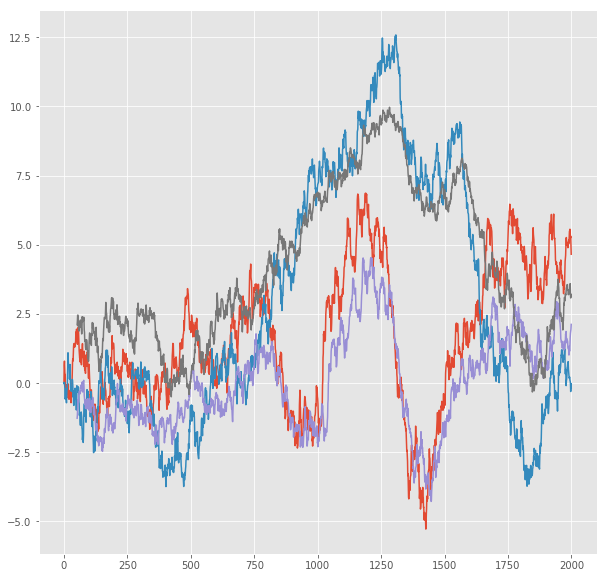

R^2 score for regression on Error: 0.5956
k = 0.9436


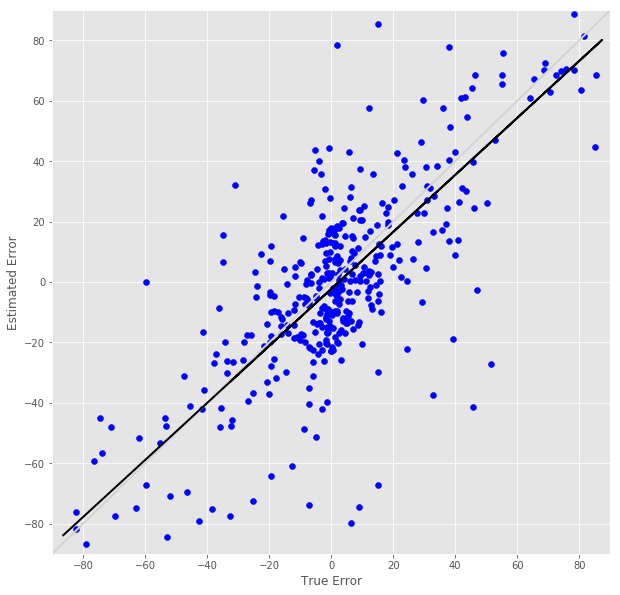

R^2 score for regression on RT: 0.2546
k = 0.7375


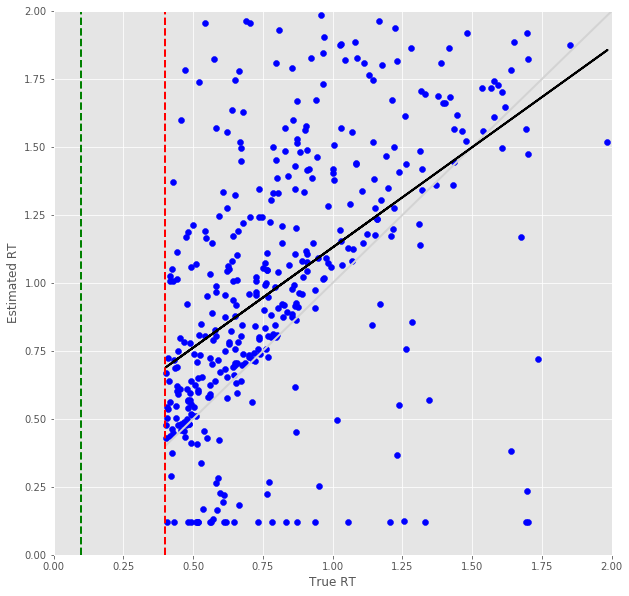

Error Prediction Score: 0.4216 RMSE
RT Prediction Score: 0.5511 RMSE
Error Prediction Corr: 0.6622
RT Prediction Corr: 0.5304
R^2 score for regression on Error: 0.4386
k = 0.8584


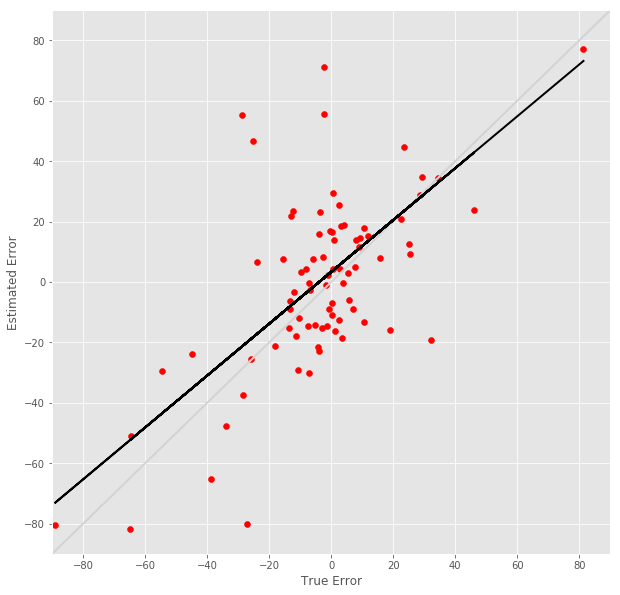

R^2 score for regression on RT: 0.2813
k = 0.8335


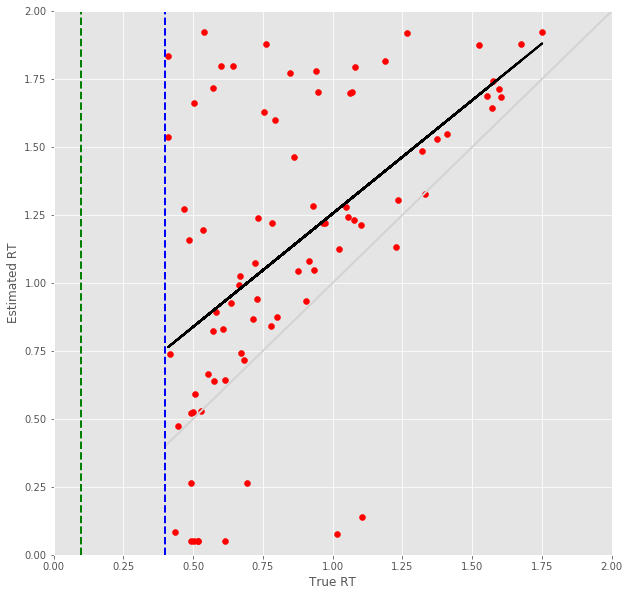

22 -step(s) forecast:
Test Score for 22 -steps forecast: 3.3209 RMSE
Predict Score for 22 -steps forecast: 3.1137 RMSE
Error Test Score for 22 -steps forecast: 0.4109 RMSE
RT Test Score for 22 -steps forecast: 0.4690 RMSE
Error Test Corr for 22 -steps forecast: 0.7577
RT Test Corr for 22 -steps forecast: 0.4990


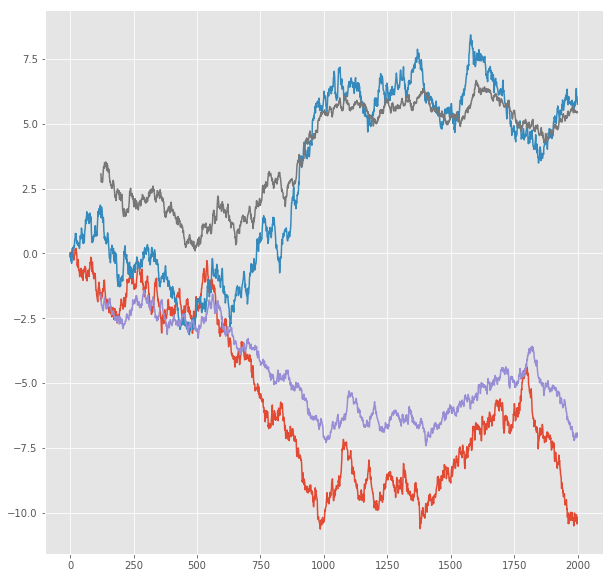

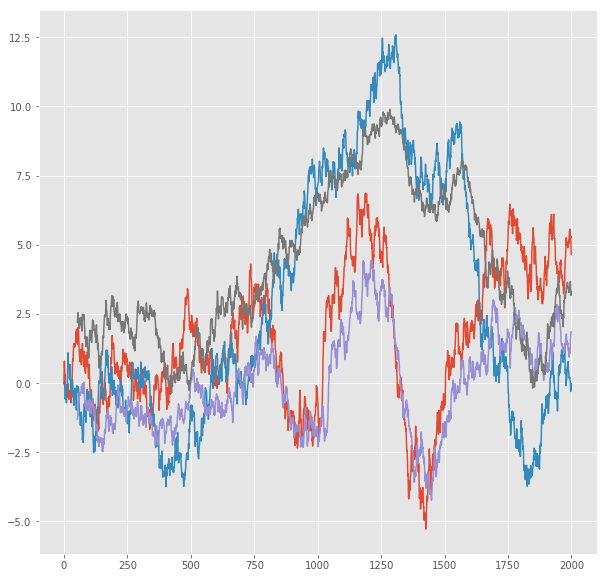

R^2 score for regression on Error: 0.5740
k = 0.9372


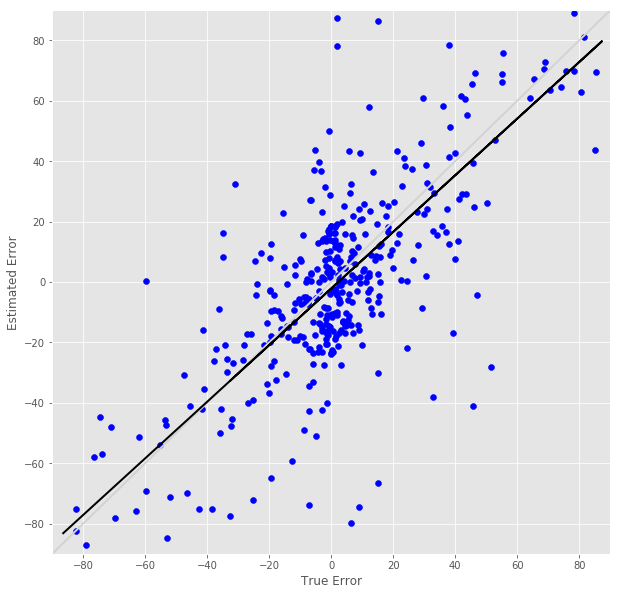

R^2 score for regression on RT: 0.2490
k = 0.7269


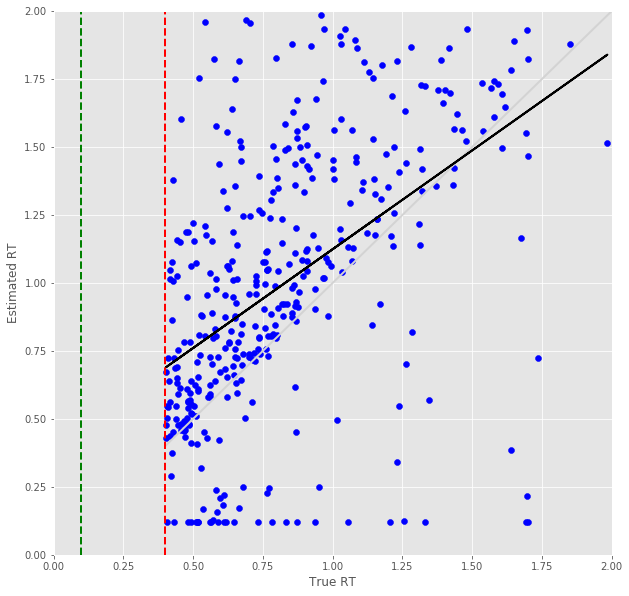

Error Prediction Score: 0.4233 RMSE
RT Prediction Score: 0.5762 RMSE
Error Prediction Corr: 0.6595
RT Prediction Corr: 0.5068
R^2 score for regression on Error: 0.4349
k = 0.8553


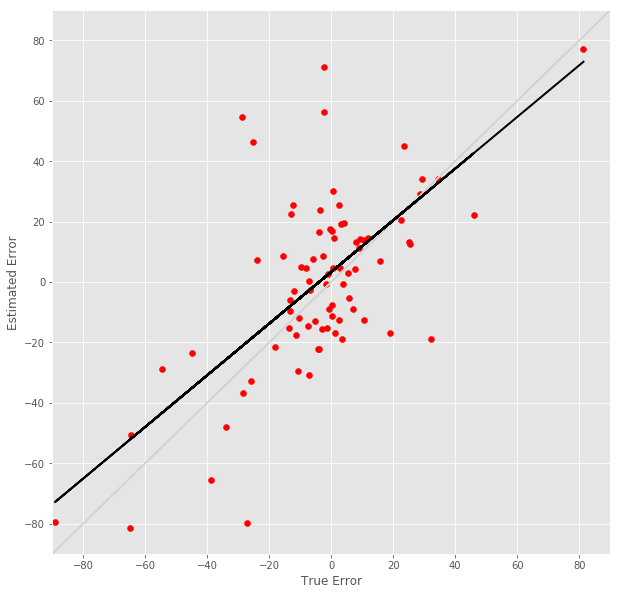

R^2 score for regression on RT: 0.2568
k = 0.8127


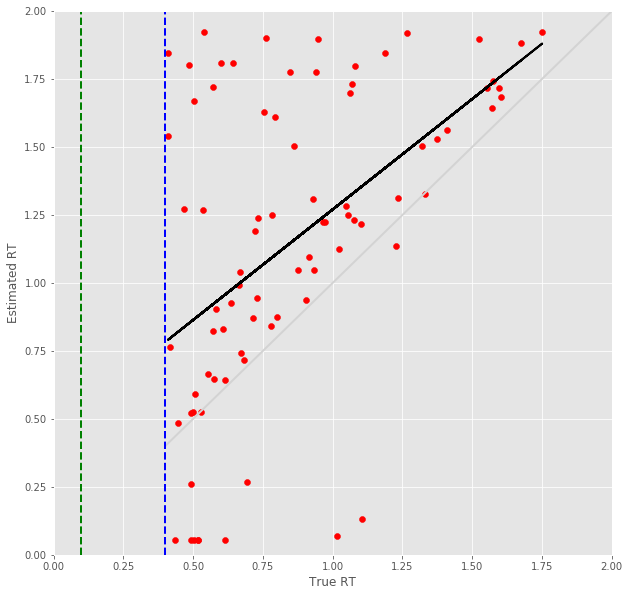

23 -step(s) forecast:
Test Score for 23 -steps forecast: 3.4254 RMSE
Predict Score for 23 -steps forecast: 3.2137 RMSE
Error Test Score for 23 -steps forecast: 0.4221 RMSE
RT Test Score for 23 -steps forecast: 0.4846 RMSE
Error Test Corr for 23 -steps forecast: 0.7455
RT Test Corr for 23 -steps forecast: 0.4817


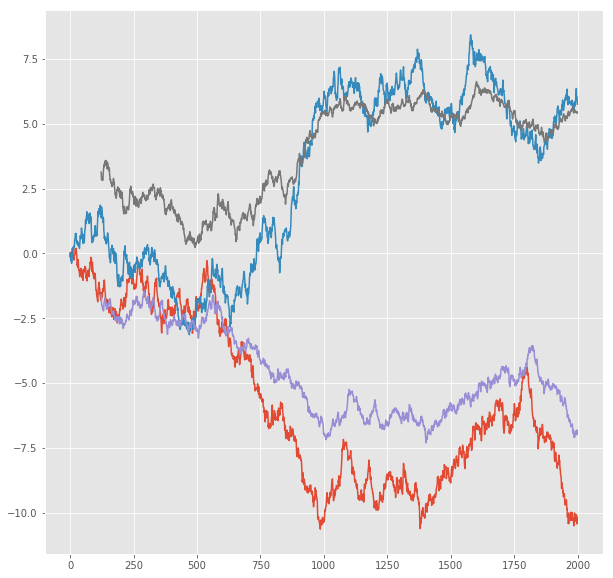

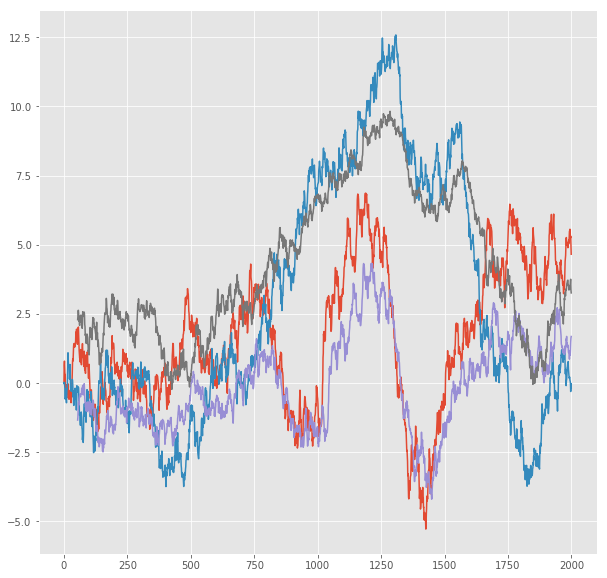

R^2 score for regression on Error: 0.5557
k = 0.9296


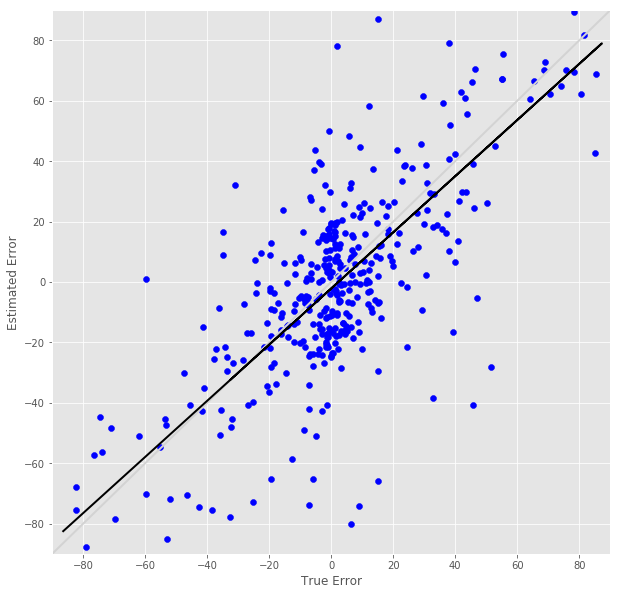

R^2 score for regression on RT: 0.2320
k = 0.7145


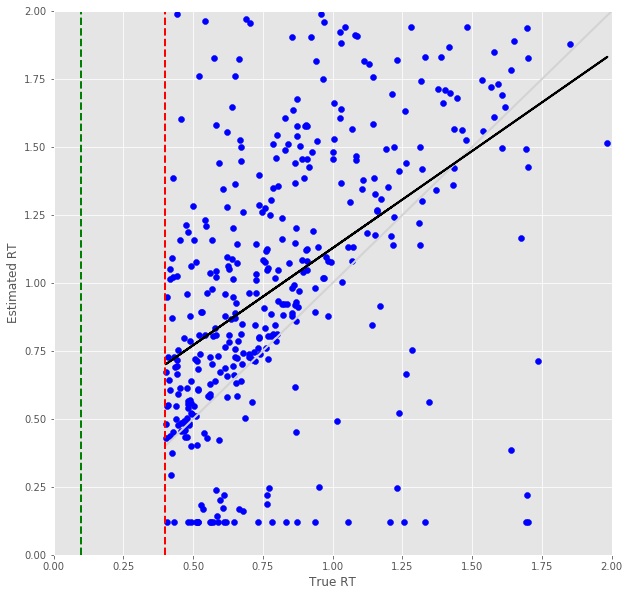

Error Prediction Score: 0.4261 RMSE
RT Prediction Score: 0.5736 RMSE
Error Prediction Corr: 0.6610
RT Prediction Corr: 0.5042
R^2 score for regression on Error: 0.4369
k = 0.8580


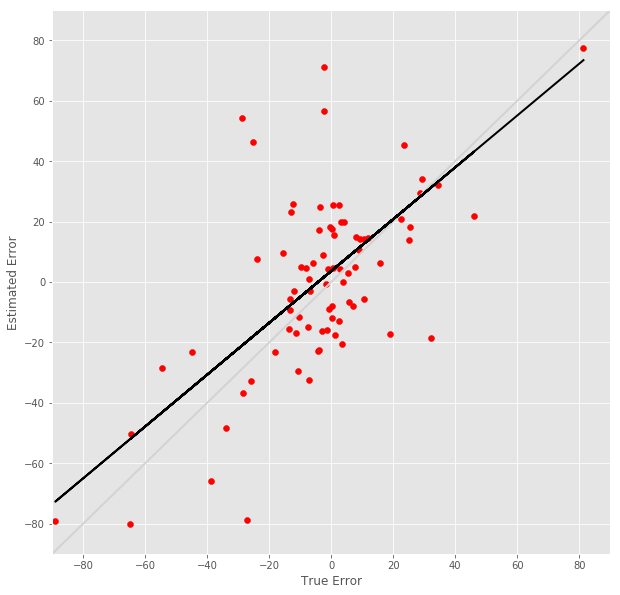

R^2 score for regression on RT: 0.2542
k = 0.7994


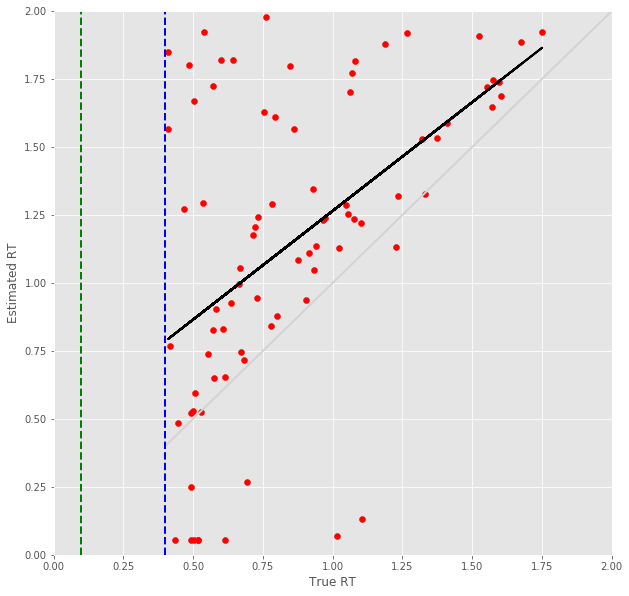

24 -step(s) forecast:
Test Score for 24 -steps forecast: 3.5271 RMSE
Predict Score for 24 -steps forecast: 3.3112 RMSE
Error Test Score for 24 -steps forecast: 0.4338 RMSE
RT Test Score for 24 -steps forecast: 0.4970 RMSE
Error Test Corr for 24 -steps forecast: 0.7304
RT Test Corr for 24 -steps forecast: 0.4509


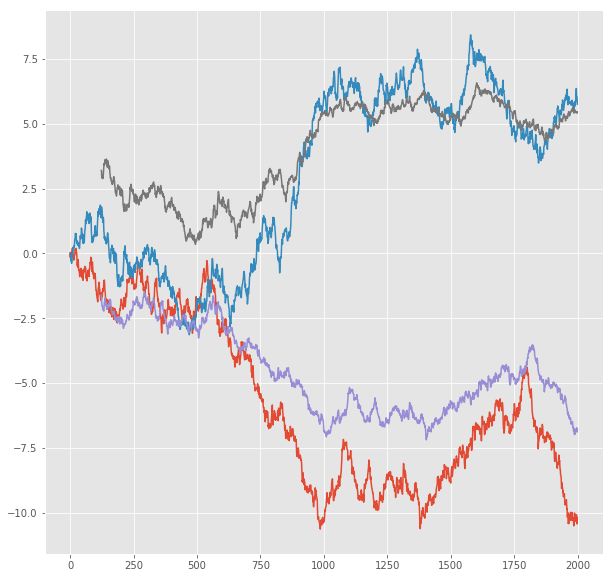

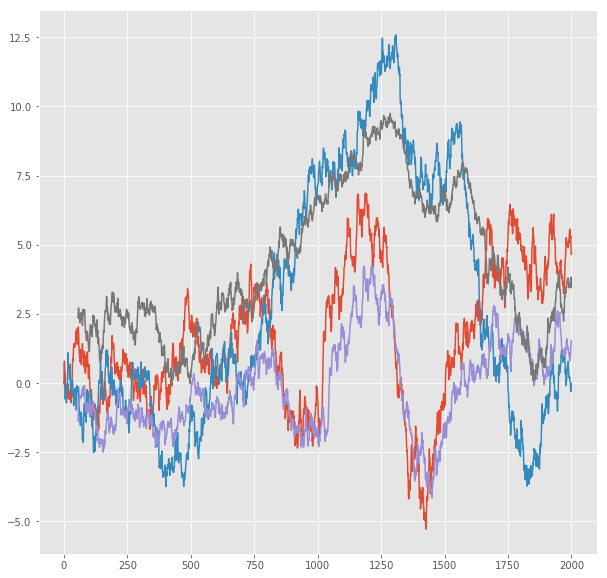

R^2 score for regression on Error: 0.5335
k = 0.9258


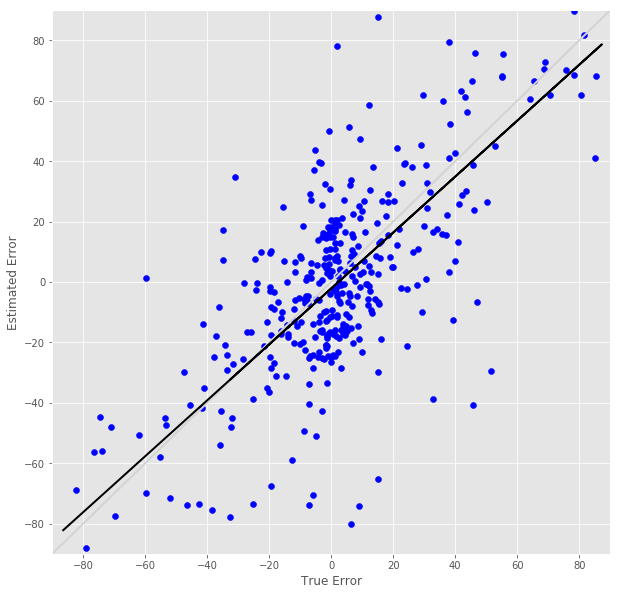

R^2 score for regression on RT: 0.2033
k = 0.6710


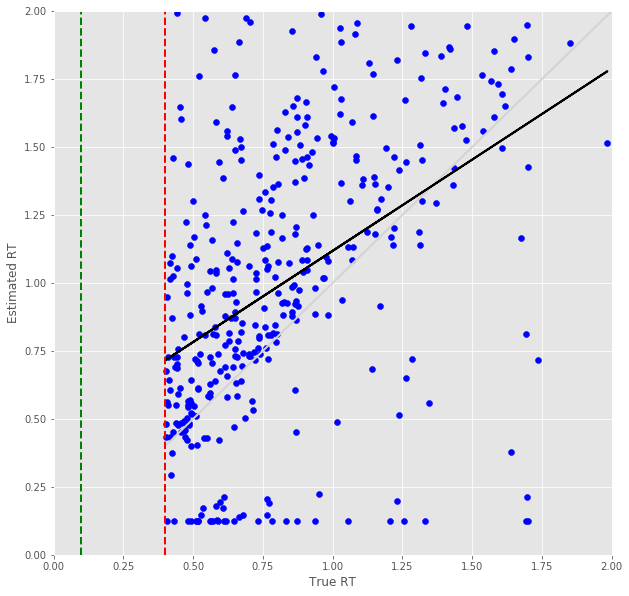

Error Prediction Score: 0.4342 RMSE
RT Prediction Score: 0.5770 RMSE
Error Prediction Corr: 0.6577
RT Prediction Corr: 0.5338
R^2 score for regression on Error: 0.4325
k = 0.8603


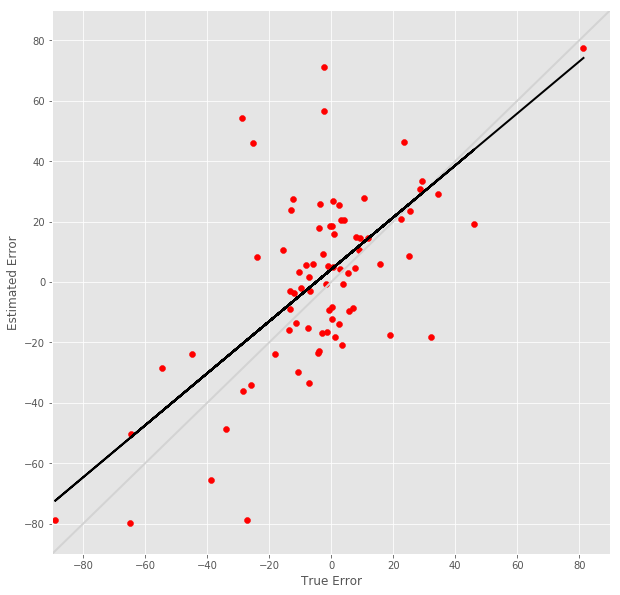

R^2 score for regression on RT: 0.2850
k = 0.8633


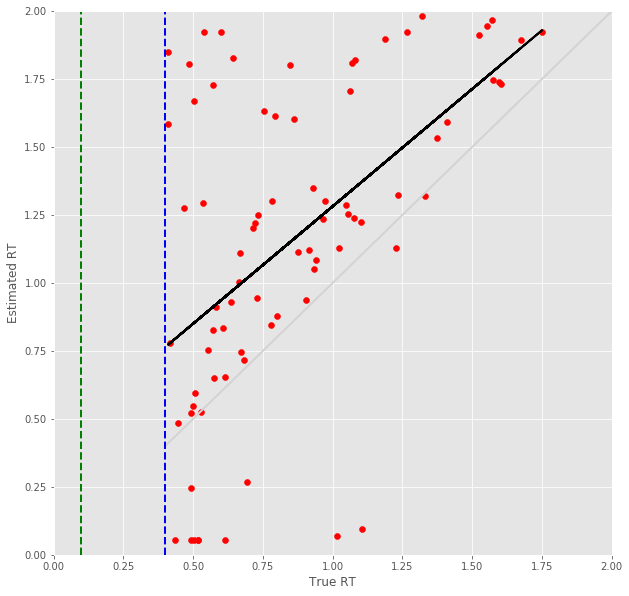

25 -step(s) forecast:
Test Score for 25 -steps forecast: 3.6262 RMSE
Predict Score for 25 -steps forecast: 3.4062 RMSE
Error Test Score for 25 -steps forecast: 0.4400 RMSE
RT Test Score for 25 -steps forecast: 0.4956 RMSE
Error Test Corr for 25 -steps forecast: 0.7250
RT Test Corr for 25 -steps forecast: 0.4534


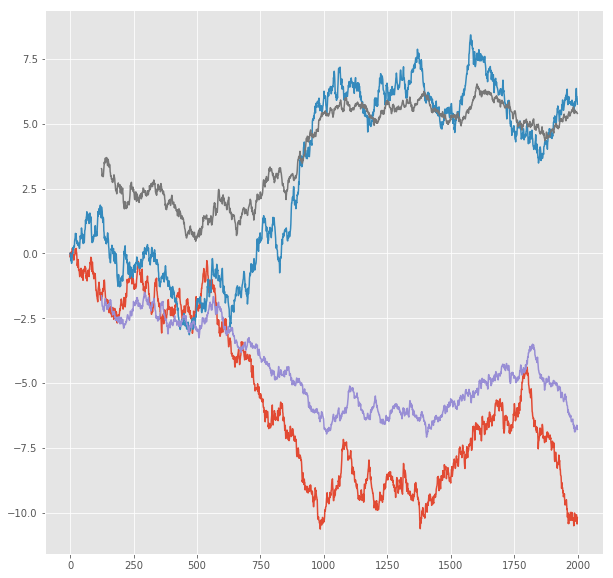

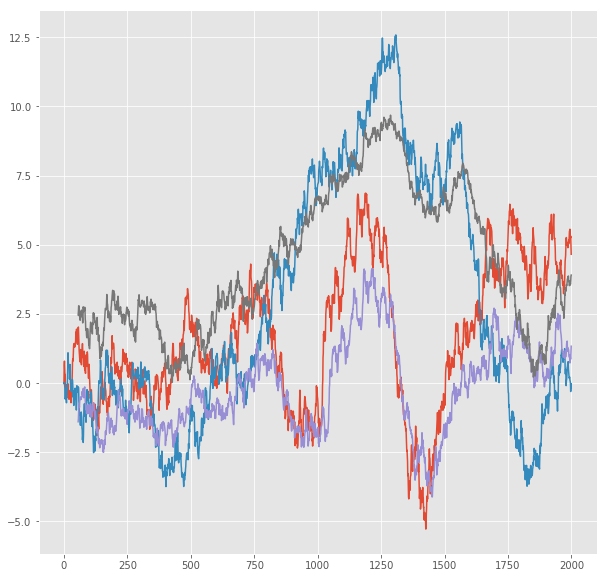

R^2 score for regression on Error: 0.5257
k = 0.9266


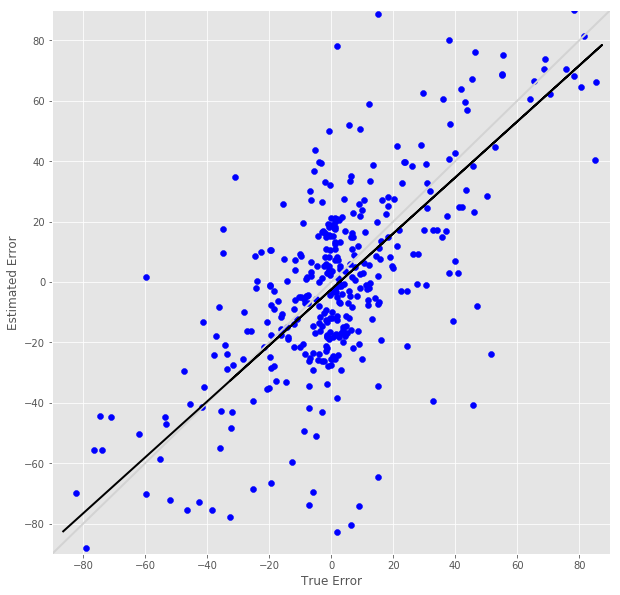

R^2 score for regression on RT: 0.2056
k = 0.6753


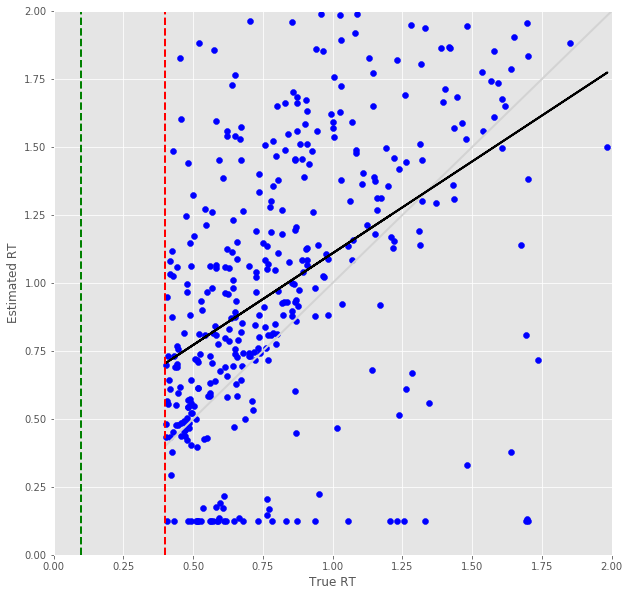

Error Prediction Score: 0.4405 RMSE
RT Prediction Score: 0.5926 RMSE
Error Prediction Corr: 0.6532
RT Prediction Corr: 0.5012
R^2 score for regression on Error: 0.4266
k = 0.8714


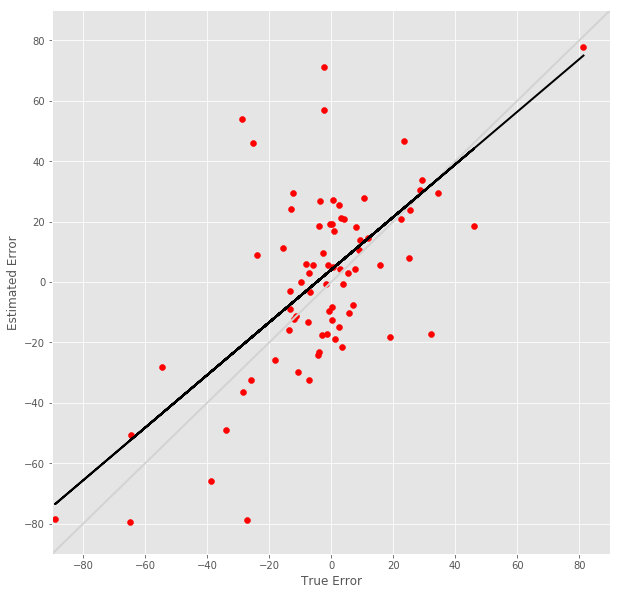

R^2 score for regression on RT: 0.2512
k = 0.8521


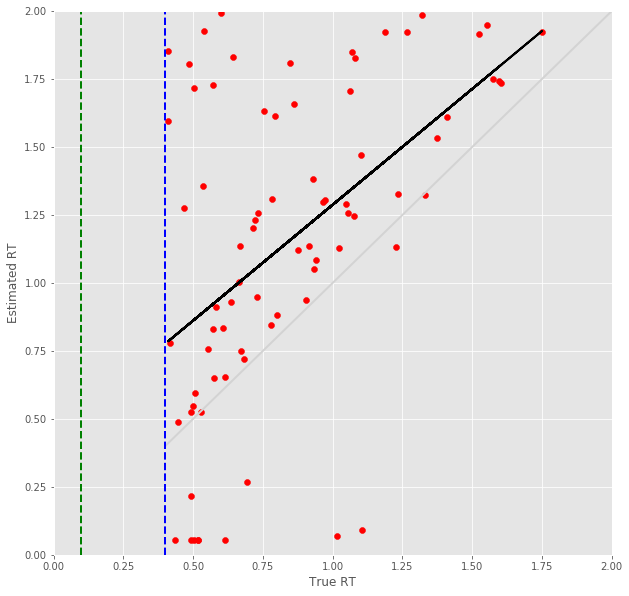

26 -step(s) forecast:
Test Score for 26 -steps forecast: 3.7228 RMSE
Predict Score for 26 -steps forecast: 3.4989 RMSE
Error Test Score for 26 -steps forecast: 0.4487 RMSE
RT Test Score for 26 -steps forecast: 0.5141 RMSE
Error Test Corr for 26 -steps forecast: 0.7152
RT Test Corr for 26 -steps forecast: 0.4235


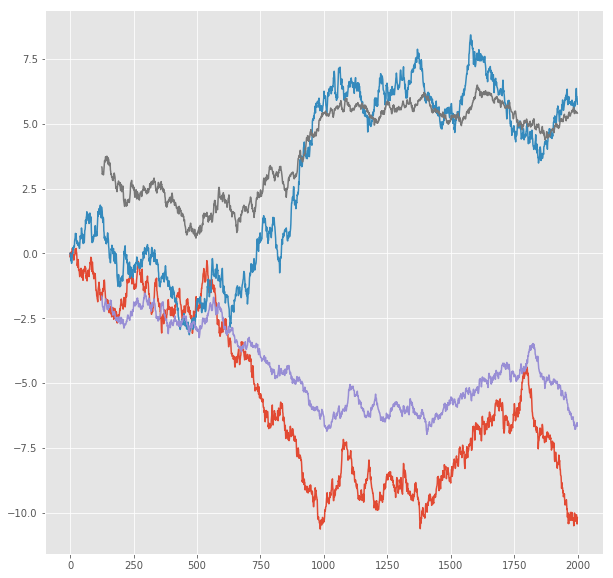

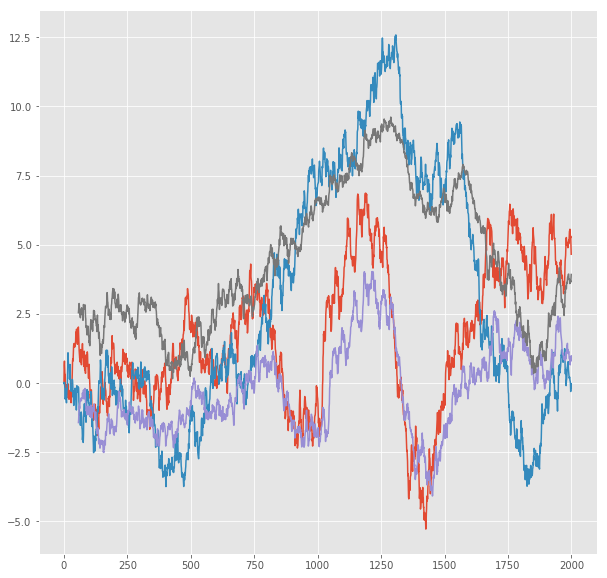

R^2 score for regression on Error: 0.5115
k = 0.9130


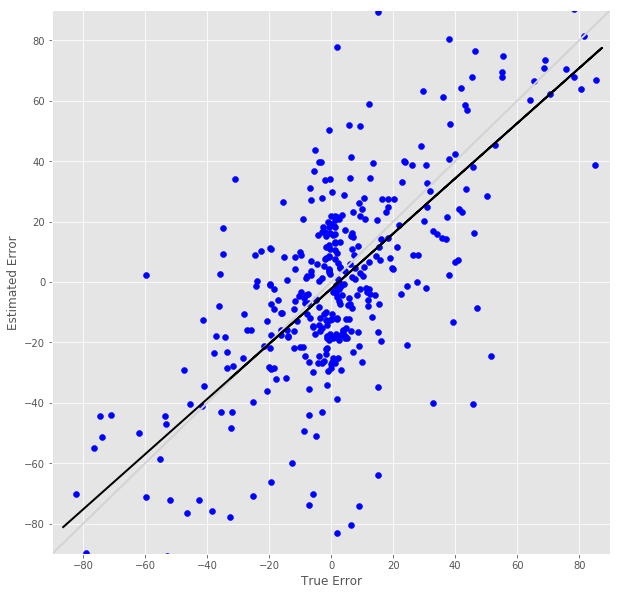

R^2 score for regression on RT: 0.1793
k = 0.6432


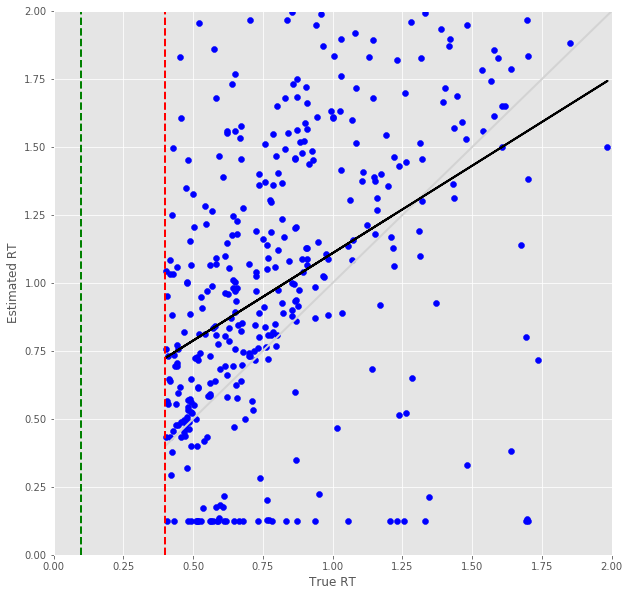

Error Prediction Score: 0.4491 RMSE
RT Prediction Score: 0.5768 RMSE
Error Prediction Corr: 0.6472
RT Prediction Corr: 0.5094
R^2 score for regression on Error: 0.4188
k = 0.8666


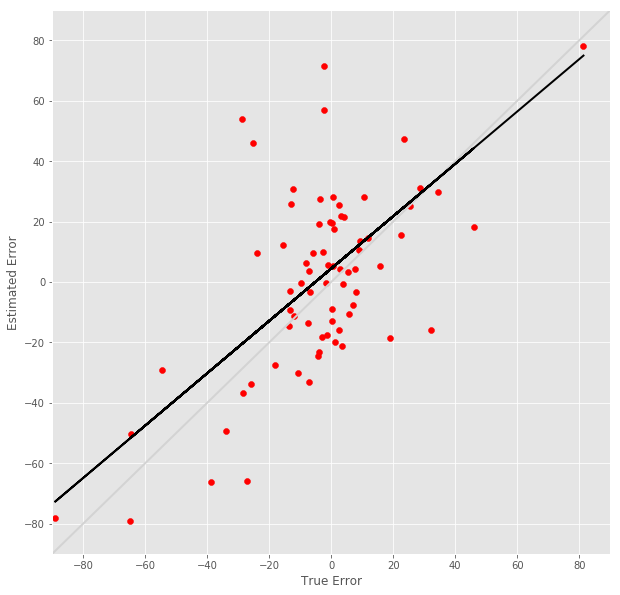

R^2 score for regression on RT: 0.2595
k = 0.8657


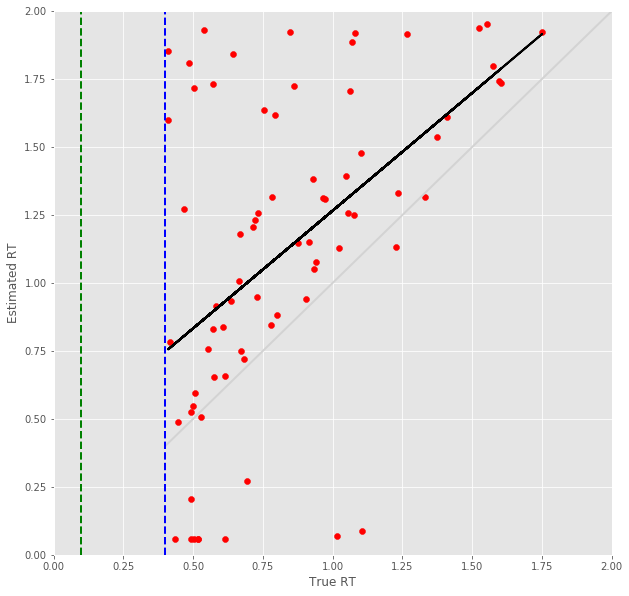

27 -step(s) forecast:
Test Score for 27 -steps forecast: 3.8169 RMSE
Predict Score for 27 -steps forecast: 3.5894 RMSE
Error Test Score for 27 -steps forecast: 0.4545 RMSE
RT Test Score for 27 -steps forecast: 0.5269 RMSE
Error Test Corr for 27 -steps forecast: 0.7159
RT Test Corr for 27 -steps forecast: 0.3949


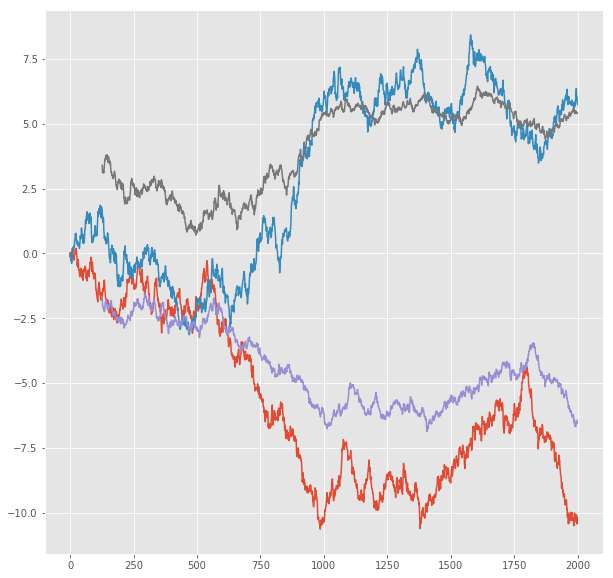

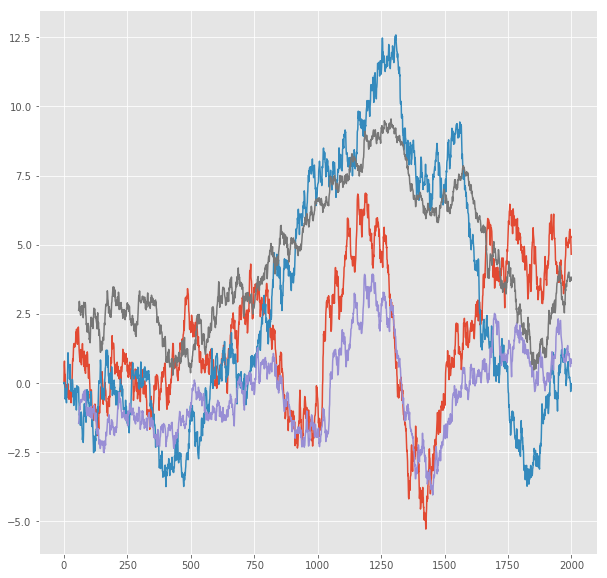

R^2 score for regression on Error: 0.5125
k = 0.9276


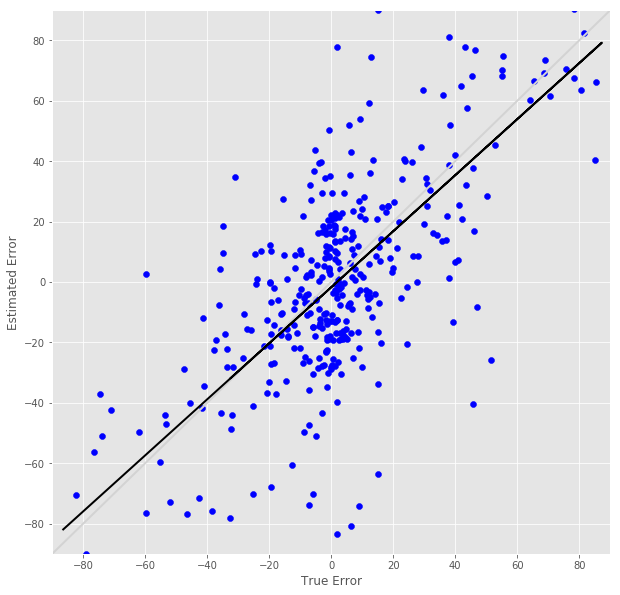

R^2 score for regression on RT: 0.1559
k = 0.6067


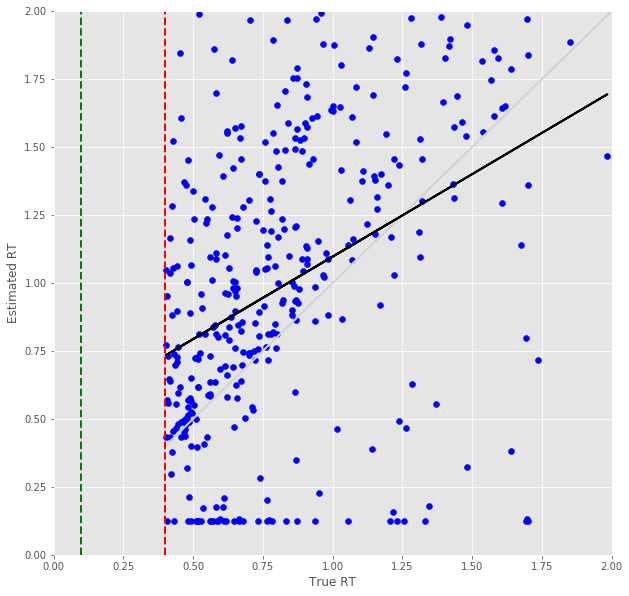

Error Prediction Score: 0.4696 RMSE
RT Prediction Score: 0.5625 RMSE
Error Prediction Corr: 0.6268
RT Prediction Corr: 0.5533
R^2 score for regression on Error: 0.3929
k = 0.8573


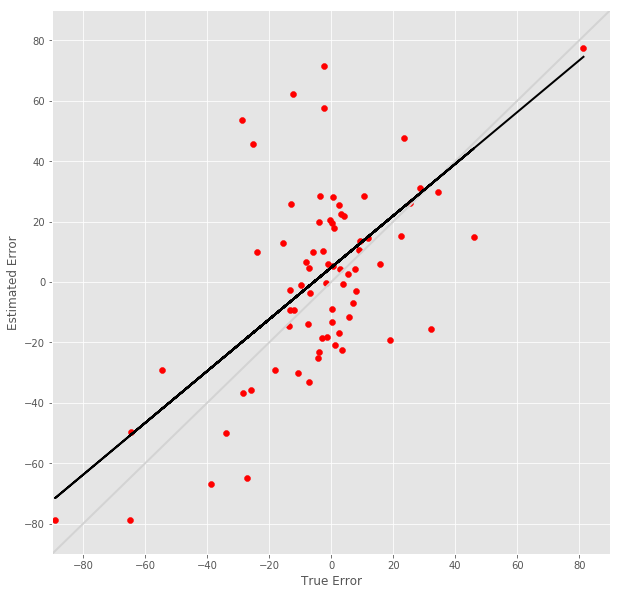

R^2 score for regression on RT: 0.3062
k = 0.9566


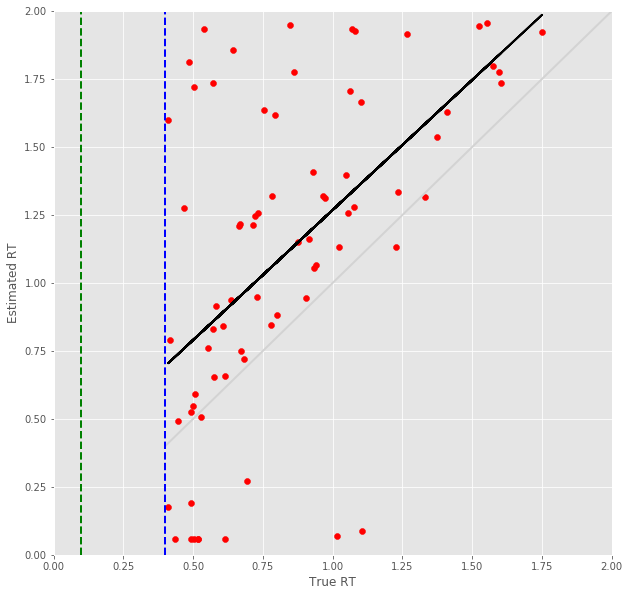

28 -step(s) forecast:
Test Score for 28 -steps forecast: 3.9087 RMSE
Predict Score for 28 -steps forecast: 3.6777 RMSE
Error Test Score for 28 -steps forecast: 0.4645 RMSE
RT Test Score for 28 -steps forecast: 0.5422 RMSE
Error Test Corr for 28 -steps forecast: 0.7042
RT Test Corr for 28 -steps forecast: 0.3775


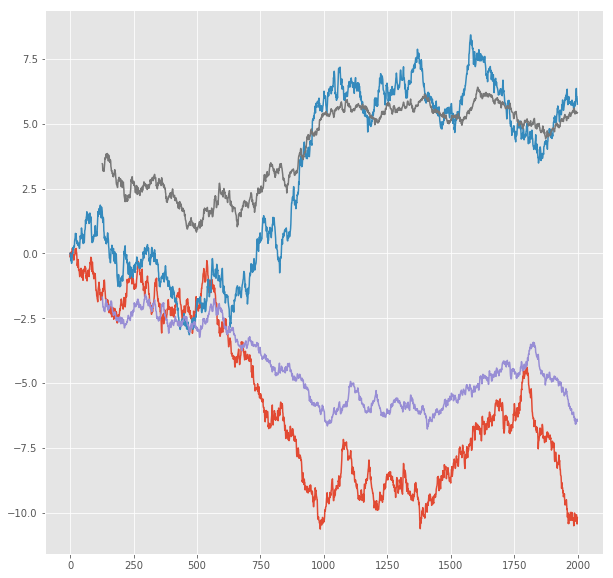

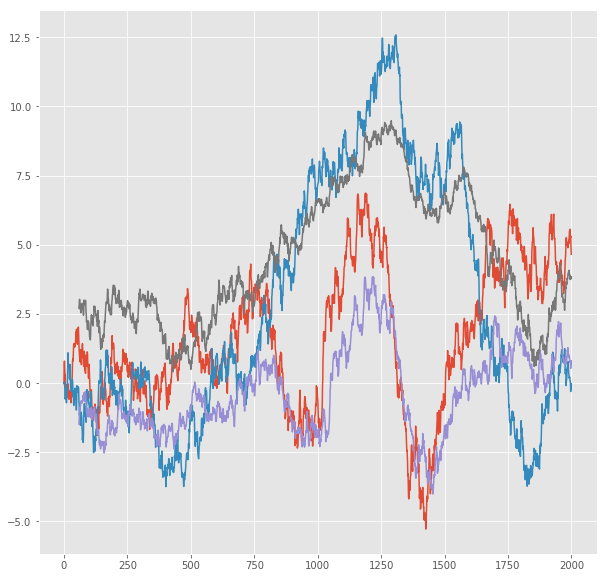

R^2 score for regression on Error: 0.4958
k = 0.9227


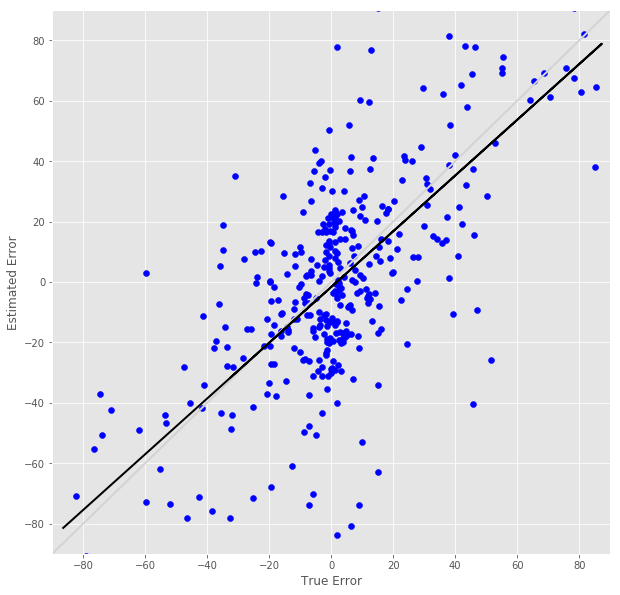

R^2 score for regression on RT: 0.1425
k = 0.5923


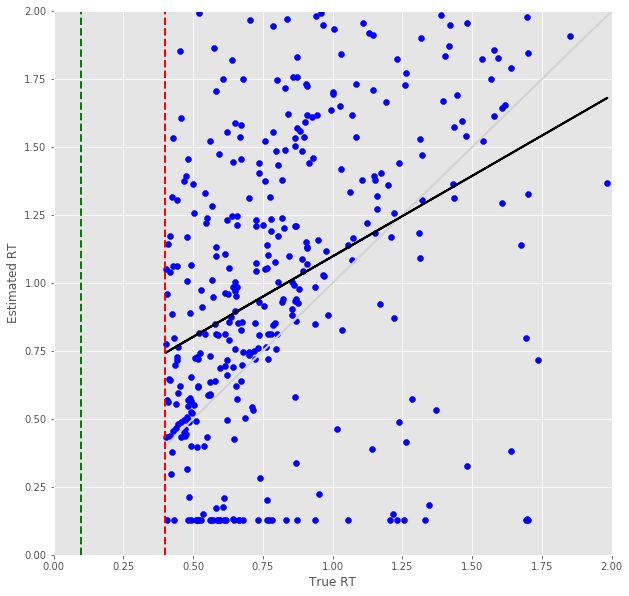

Error Prediction Score: 0.4728 RMSE
RT Prediction Score: 0.5865 RMSE
Error Prediction Corr: 0.6233
RT Prediction Corr: 0.5318
R^2 score for regression on Error: 0.3885
k = 0.8561


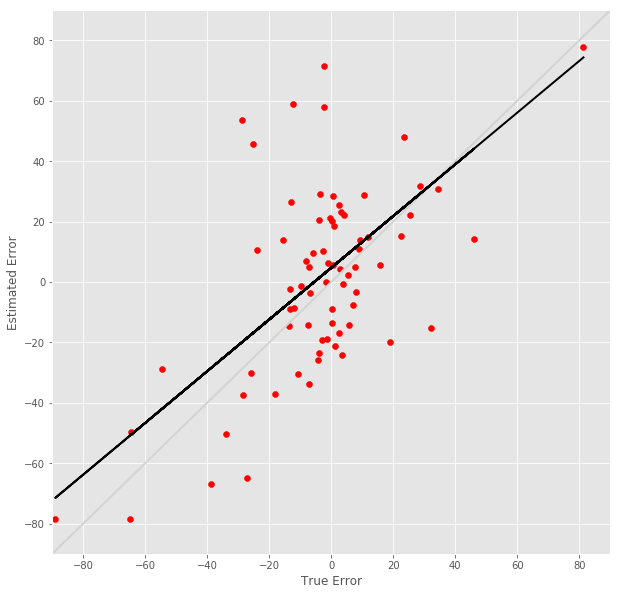

R^2 score for regression on RT: 0.2828
k = 0.9378


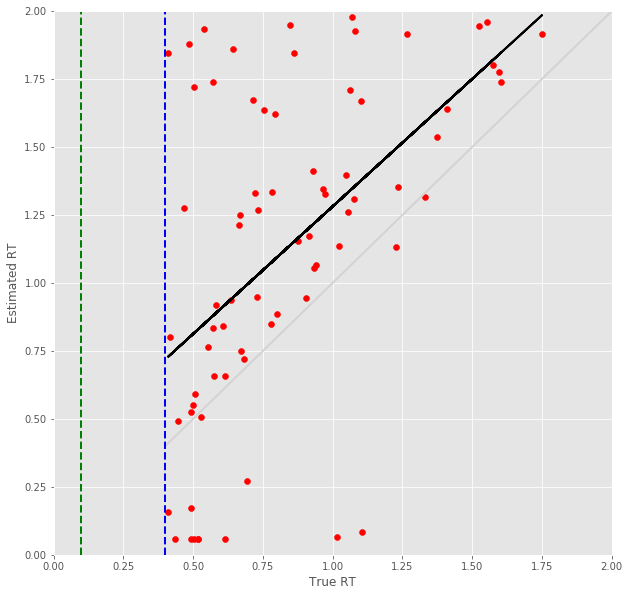

29 -step(s) forecast:
Test Score for 29 -steps forecast: 3.9983 RMSE
Predict Score for 29 -steps forecast: 3.7638 RMSE
Error Test Score for 29 -steps forecast: 0.4721 RMSE
RT Test Score for 29 -steps forecast: 0.5406 RMSE
Error Test Corr for 29 -steps forecast: 0.6985
RT Test Corr for 29 -steps forecast: 0.3705


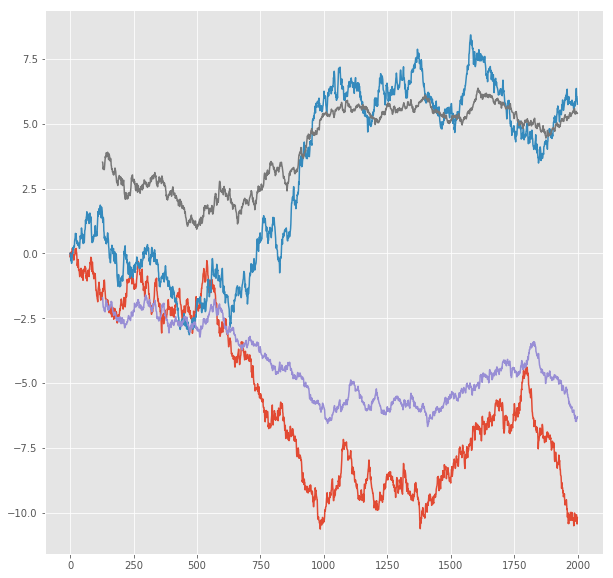

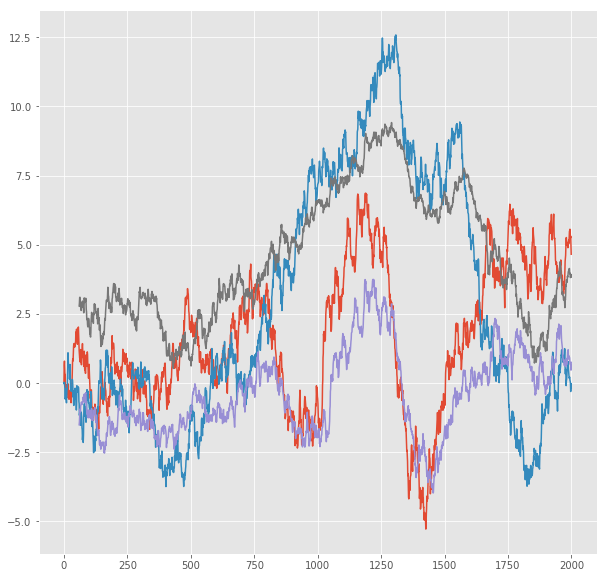

R^2 score for regression on Error: 0.4880
k = 0.9164


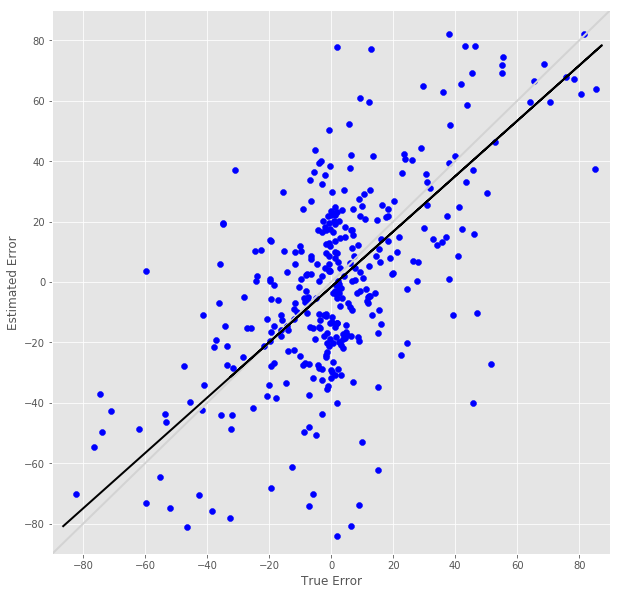

R^2 score for regression on RT: 0.1373
k = 0.5817


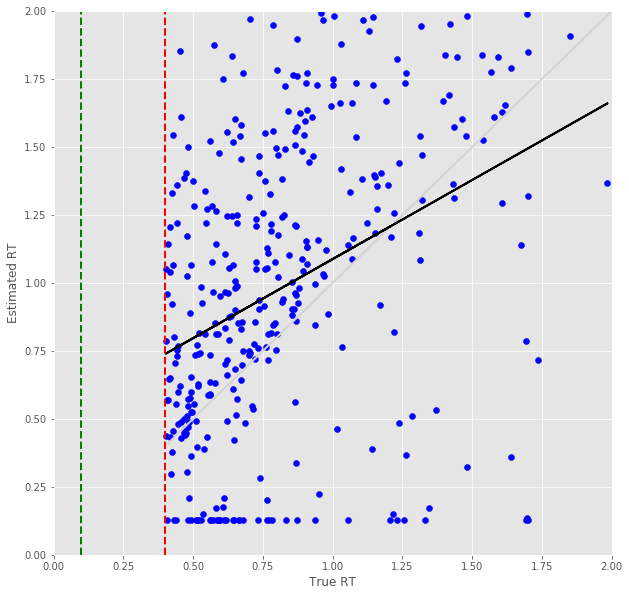

Error Prediction Score: 0.4853 RMSE
RT Prediction Score: 0.6112 RMSE
Error Prediction Corr: 0.6281
RT Prediction Corr: 0.4962
R^2 score for regression on Error: 0.3946
k = 0.8694


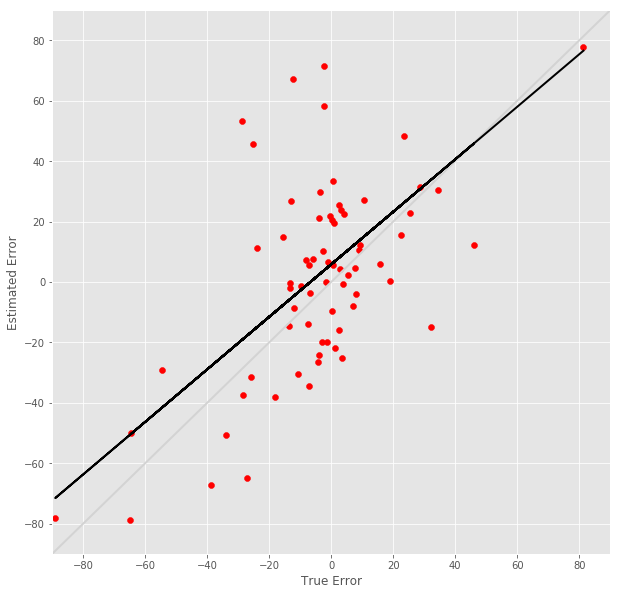

R^2 score for regression on RT: 0.2462
k = 0.8970


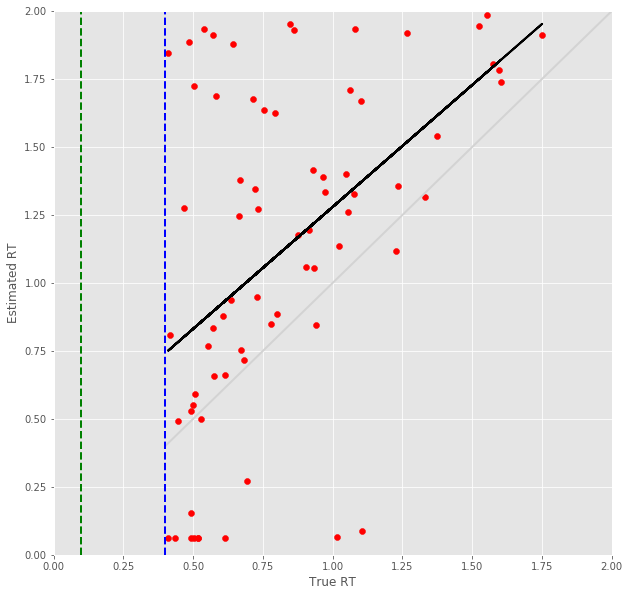

30 -step(s) forecast:
Test Score for 30 -steps forecast: 4.0857 RMSE
Predict Score for 30 -steps forecast: 3.8479 RMSE
Error Test Score for 30 -steps forecast: 0.4820 RMSE
RT Test Score for 30 -steps forecast: 0.5570 RMSE
Error Test Corr for 30 -steps forecast: 0.6905
RT Test Corr for 30 -steps forecast: 0.3402


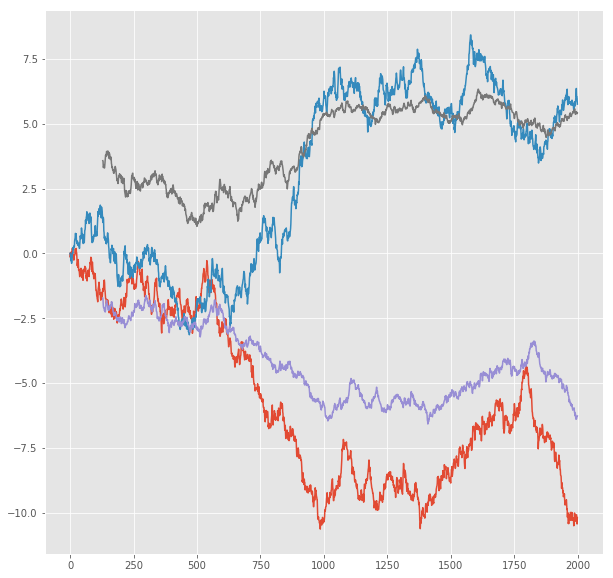

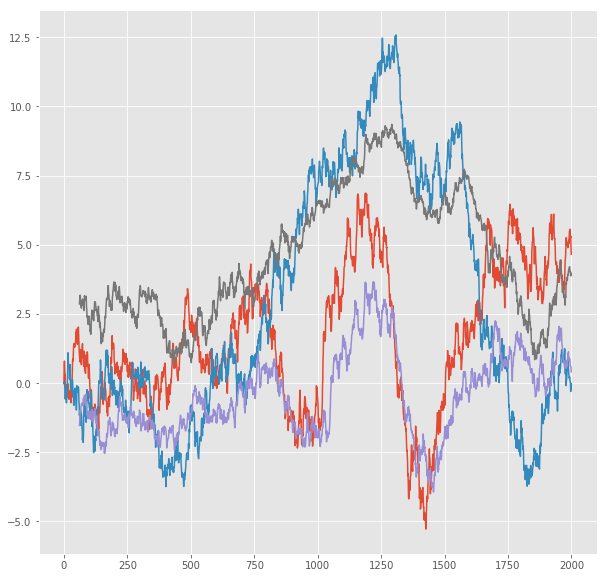

R^2 score for regression on Error: 0.4767
k = 0.9183


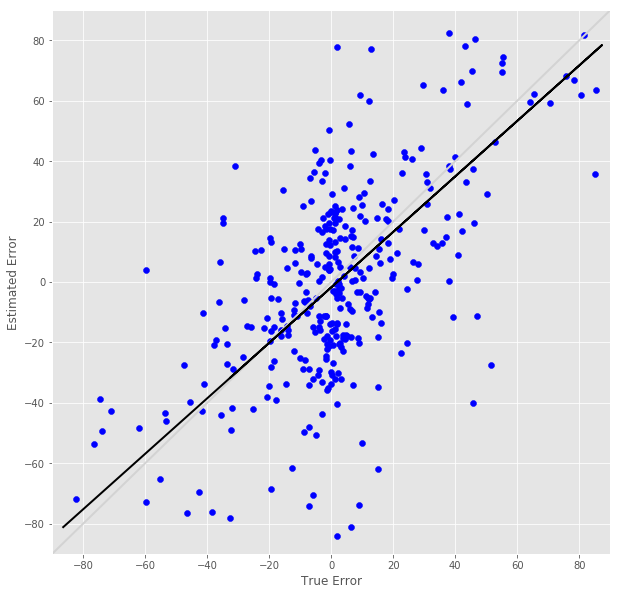

R^2 score for regression on RT: 0.1157
k = 0.5433


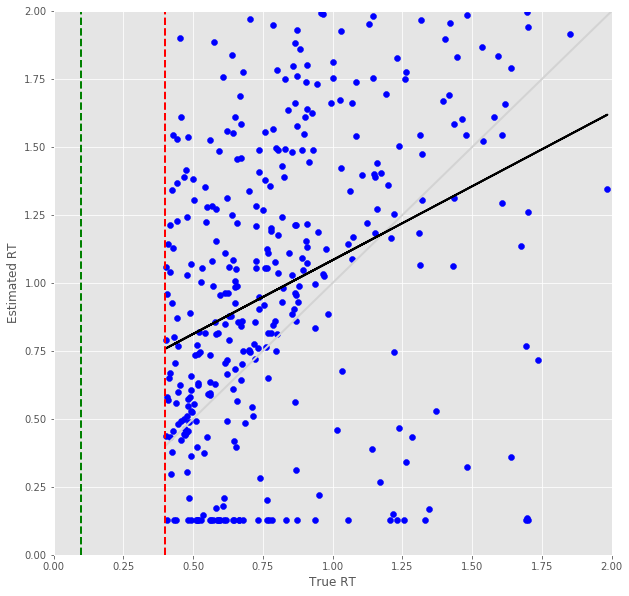

Error Prediction Score: 0.4903 RMSE
RT Prediction Score: 0.6278 RMSE
Error Prediction Corr: 0.6235
RT Prediction Corr: 0.4679
R^2 score for regression on Error: 0.3888
k = 0.8646


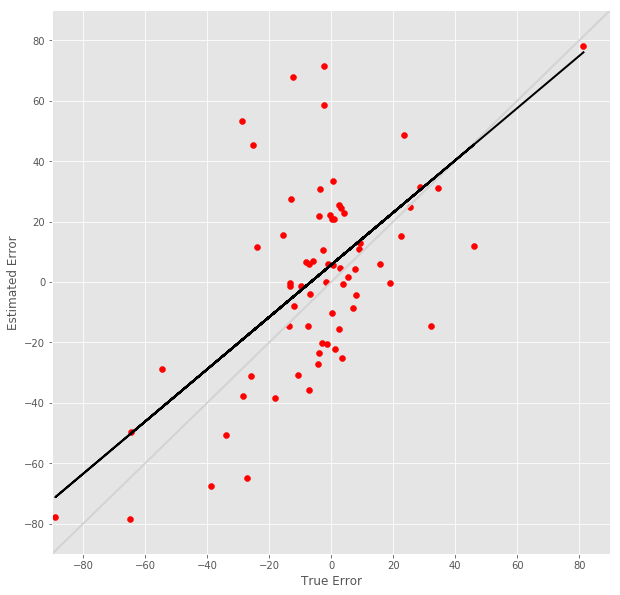

R^2 score for regression on RT: 0.2189
k = 0.8747


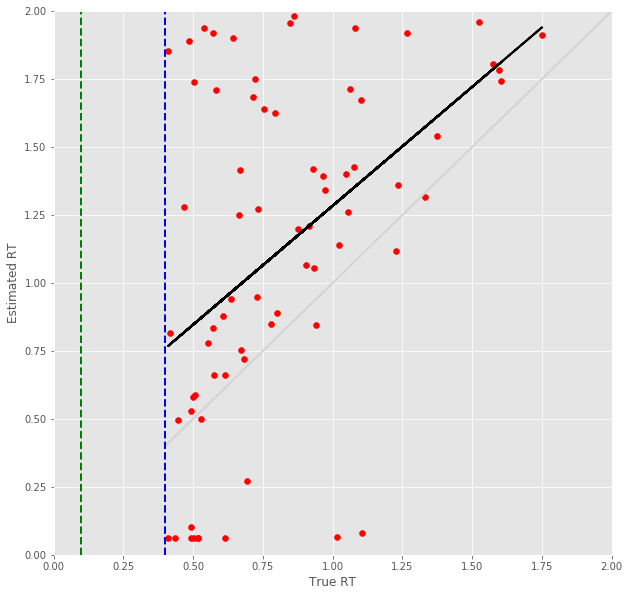

31 -step(s) forecast:
Test Score for 31 -steps forecast: 4.1709 RMSE
Predict Score for 31 -steps forecast: 3.9300 RMSE
Error Test Score for 31 -steps forecast: 0.5017 RMSE
RT Test Score for 31 -steps forecast: 0.5683 RMSE
Error Test Corr for 31 -steps forecast: 0.6803
RT Test Corr for 31 -steps forecast: 0.3047


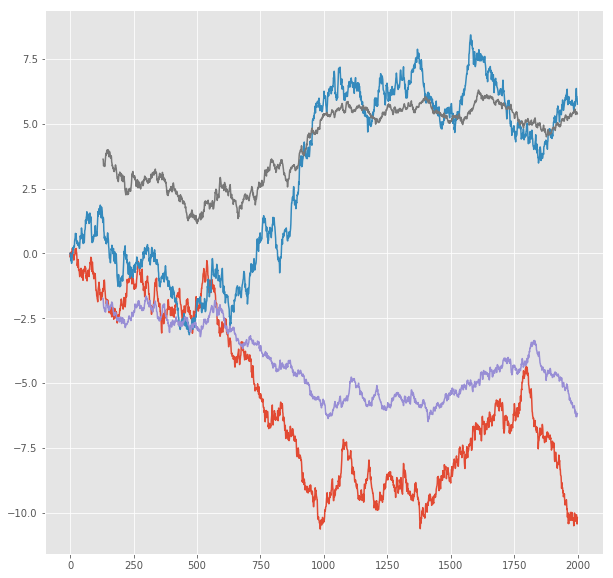

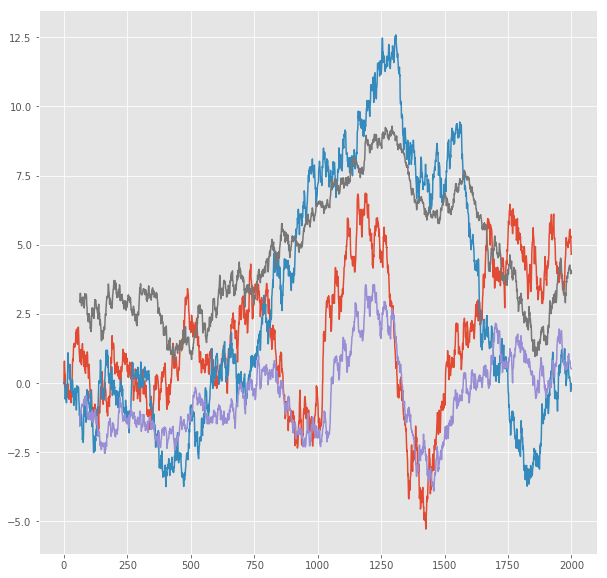

R^2 score for regression on Error: 0.4628
k = 0.9186


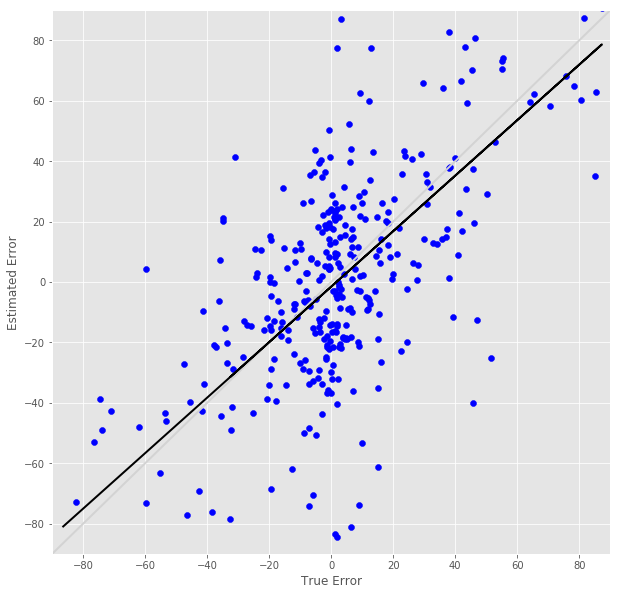

R^2 score for regression on RT: 0.0928
k = 0.4929


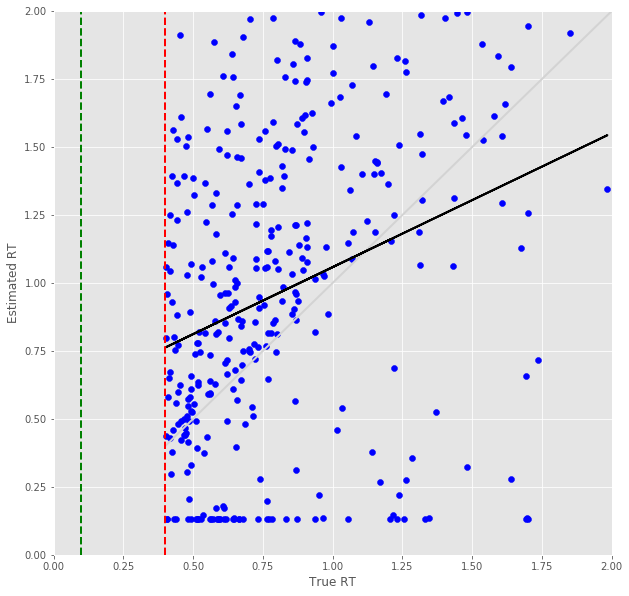

Error Prediction Score: 0.4999 RMSE
RT Prediction Score: 0.6229 RMSE
Error Prediction Corr: 0.6195
RT Prediction Corr: 0.4747
R^2 score for regression on Error: 0.3838
k = 0.8583


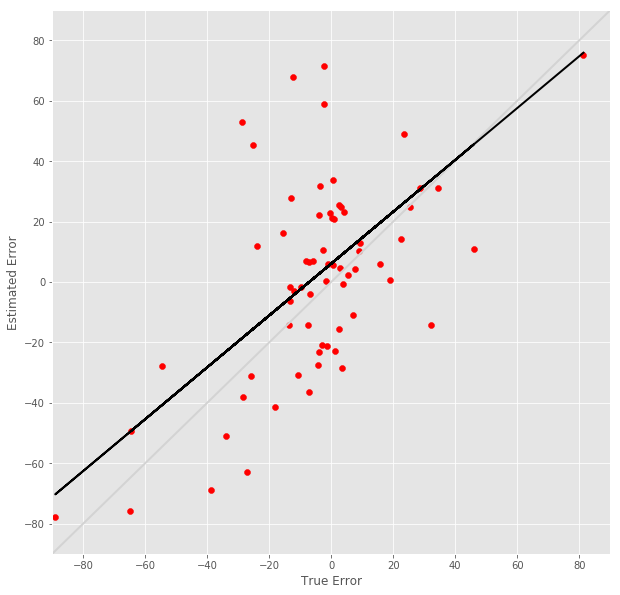

R^2 score for regression on RT: 0.2253
k = 0.8768


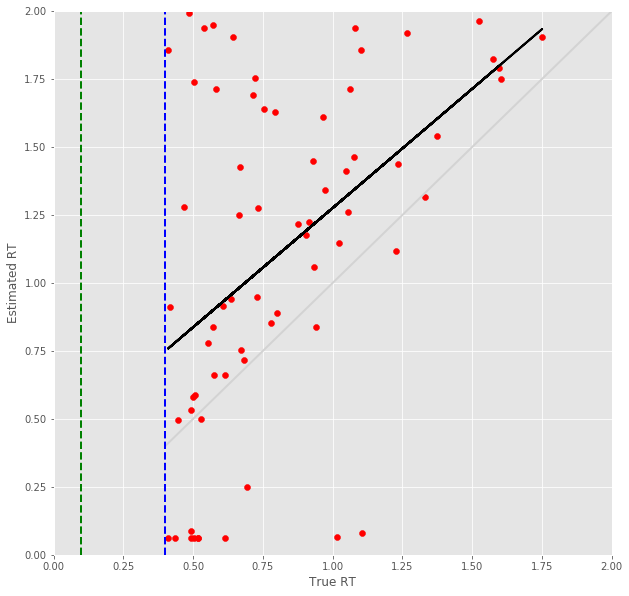

32 -step(s) forecast:
Test Score for 32 -steps forecast: 4.2542 RMSE
Predict Score for 32 -steps forecast: 4.0102 RMSE
Error Test Score for 32 -steps forecast: 0.5108 RMSE
RT Test Score for 32 -steps forecast: 0.5724 RMSE
Error Test Corr for 32 -steps forecast: 0.6636
RT Test Corr for 32 -steps forecast: 0.2777


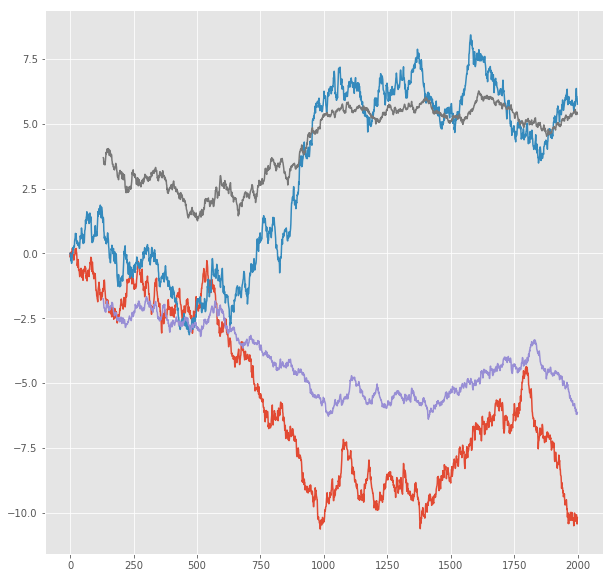

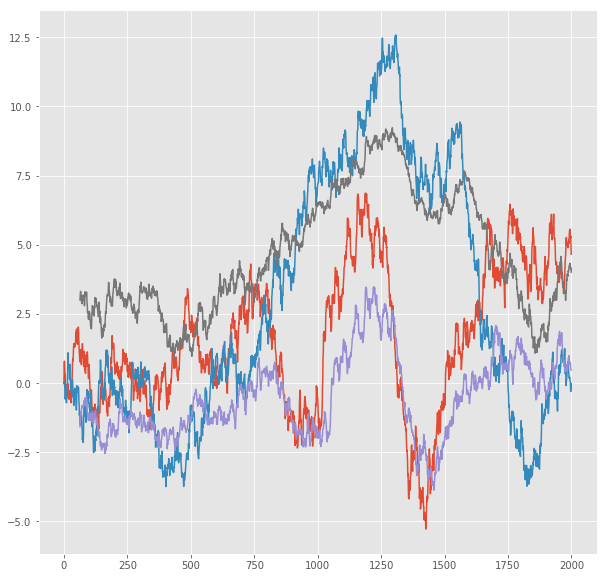

R^2 score for regression on Error: 0.4404
k = 0.9035


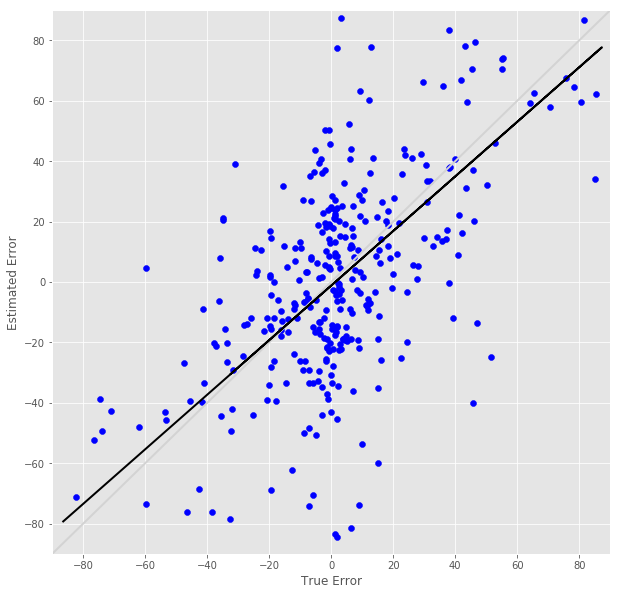

R^2 score for regression on RT: 0.0771
k = 0.4493


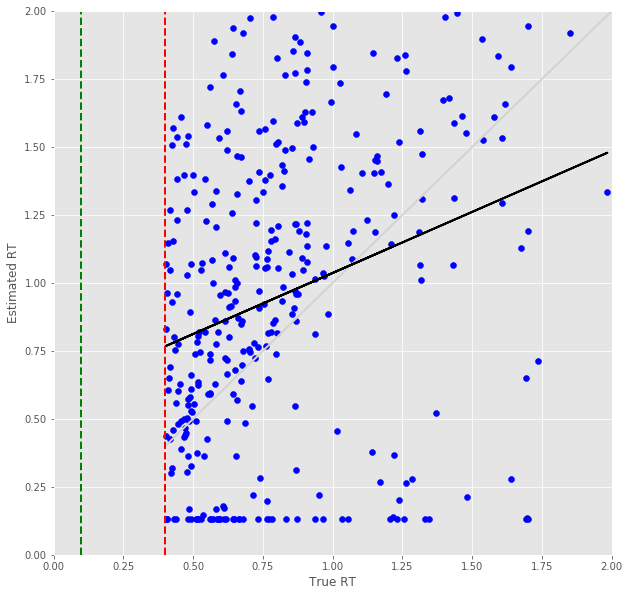

Error Prediction Score: 0.5046 RMSE
RT Prediction Score: 0.5904 RMSE
Error Prediction Corr: 0.6225
RT Prediction Corr: 0.5267
R^2 score for regression on Error: 0.3875
k = 0.8530


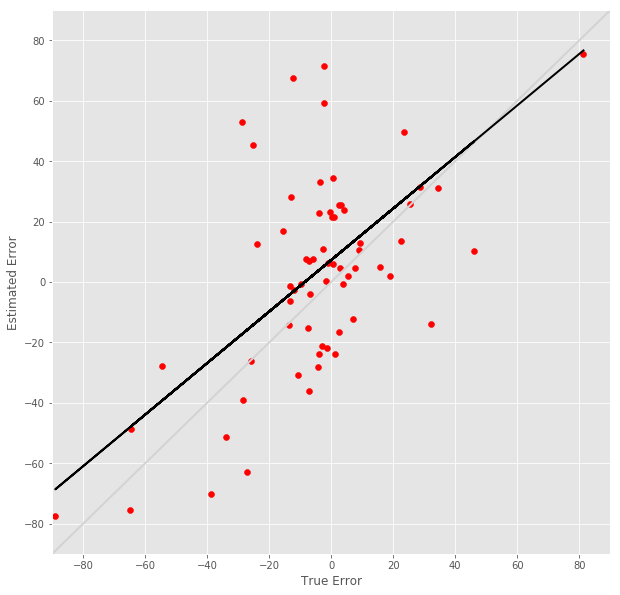

R^2 score for regression on RT: 0.2774
k = 0.9648


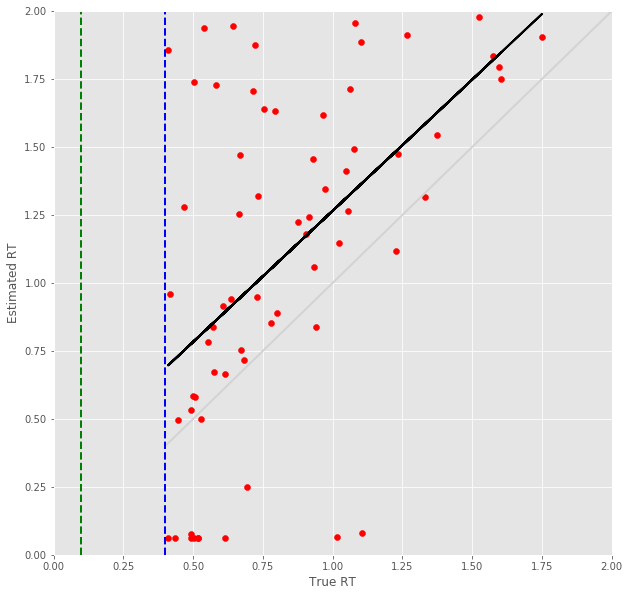

In [12]:
testScore, predictScore = [], []
NumEffectiveTest, ResponseTestScore, RTTestScore = [], [], []
NumEffectivePrediction, ResponsePredictionScore, RTPredictionScore = [], [], []
ResponseTestCorr, RTTestCorr, ResponsePredictionCorr, RTPredictionCorr = [], [], [], []

X_test_temp = testX
X_predict_temp = predictX

for FORECAST_STEP in range(1, FORECAST_MAX + 1):
    print('%d -step(s) forecast:' % (FORECAST_STEP))
    
    # use this function to prepare the train and test datasets for targeting
    
    testY, predictY = [], []
    for k in range(numSeries):
        kk = k * test_size
        for i in range(test_size - look_back - FORECAST_STEP + 1):
            testY.append(test[kk + i + look_back + FORECAST_STEP - 1, :])
    for k in range(numPredict):
        kk = k * lentmax
        for i in range(lentmax - look_back - FORECAST_STEP + 1):
            predictY.append(predict[kk + i + look_back + FORECAST_STEP - 1, :])
    testY = numpy.array(testY)
    predictY = numpy.array(predictY)

    # make predictions
    testPredict = model.predict(X_test_temp)
    predictPredict = model.predict(X_predict_temp)
    if FORECAST_STEP <= FORECAST_MAX:
        X_test_trouble = X_test_temp
        X_predict_trouble = X_predict_temp
        for l in range(look_back - 1):
            X_test_trouble[:, l, :] = X_test_trouble[:, l + 1, :]
            X_predict_trouble[:, l, :] = X_predict_trouble[:, l + 1, :]
        X_test_trouble[:, look_back - 1, :] = testPredict
        X_predict_trouble[:, look_back - 1, :] = predictPredict
        X_test_temp, X_predict_temp = [], []
        for i in range(numSeries):
            for j in range(test_size - look_back - FORECAST_STEP):
                k = i * (test_size - look_back - FORECAST_STEP + 1) + j
                X_test_temp.append(X_test_trouble[k])
        for i in range(numPredict):
            for j in range(lentmax - look_back - FORECAST_STEP):
                k = i * (lentmax - look_back - FORECAST_STEP + 1) + j
                X_predict_temp.append(X_predict_trouble[k])
        X_test_temp = numpy.array(X_test_temp)
        X_predict_temp = numpy.array(X_predict_temp)
        
    # invert predictions
    testPredict = scaler.inverse_transform(testPredict)
    testY = scaler.inverse_transform(testY)
    predictPredict = scaler.inverse_transform(predictPredict)
    predictY = scaler.inverse_transform(predictY)

    testScore.append(math.sqrt(mean_squared_error(testY, testPredict)))
    predictScore.append(math.sqrt(mean_squared_error(predictY, predictPredict)))
    print('Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, testScore[FORECAST_STEP - 1]))
    print('Predict Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, predictScore[FORECAST_STEP - 1]))
    
    # shift test predictions for plotting
    testPredictPlot = numpy.empty_like(Data)
    testPredictPlot[:, :, :] = numpy.nan
    for s in range(numSeries):
        for t in range(test_size - look_back - FORECAST_STEP + 1):
            testPredictPlot[s, t + TRAIN_SIZE + FORECAST_STEP - 1, :] = testPredict[t + s * (test_size - look_back - FORECAST_STEP + 1), :]

    # shift complete predictions for plotting
    predictPredictPlot = numpy.empty_like(Data_p)
    predictPredictPlot[:, :, :] = numpy.nan
    for s in range(numPredict):
        for t in range(TOTAL_TIME - look_back - FORECAST_STEP + 1):
            predictPredictPlot[s, t + look_back + FORECAST_STEP - 1, :] = predictPredict[t + s * (TOTAL_TIME - look_back - FORECAST_STEP + 1), :]
    
    # Output the estimation score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = trainPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break
            temp = testPredictPlot[s, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectiveTest.append(float(len(Err)) / numSeries)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponseTestScore.append(0)
        RTTestScore.append(0)
        ResponseTestCorr.append(0)
        RTTestCorr.append(0)
    else:
        ResponseTestScore.append(math.sqrt(sum(Err) / len(Err)))
        RTTestScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponseTestCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTTestCorr.append(S1.corr(S2))
    
    print('Error Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, ResponseTestScore[FORECAST_STEP - 1]))
    print('RT Test Score for %d -steps forecast: %.4f RMSE' % (FORECAST_STEP, RTTestScore[FORECAST_STEP - 1]))
    print('Error Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, ResponseTestCorr[FORECAST_STEP - 1]))
    print('RT Test Corr for %d -steps forecast: %.4f' % (FORECAST_STEP, RTTestCorr[FORECAST_STEP - 1]))
    
    #lalala
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data[loc])
    plt.plot(testPredictPlot[loc])
    plt.show()
    
    loc = 0
    plt.figure(figsize=(10, 10))
    plt.style.use('ggplot')
    plt.plot(Data_p[loc])
    plt.plot(predictPredictPlot[loc])
    plt.show()
    #lalala
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'b')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'b')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='r')
        plt.show()
    
    # Output the prediction score
    Observed_theta, Observed_error, Observed_locRT = [], [], []
    Estimated_theta, Estimated_error, Estimated_locRT = [], [], []
    for s in range(numSeries, numSeries + numPredict):
        a_r = a[s] - math.sqrt(h) * sigma[s] / 2.0
        for k in range(lentmax):
            temp = predictPredictPlot[s - numSeries, k, :]
            if (temp[0] ** 2 + temp[1] ** 2 >= a_r ** 2):
                Observed_locRT.append(RTloc[s])
                Estimated_locRT.append(k)
                Observed_theta.append(Response[s])
                tt = atan_positive(temp[0], temp[1]) / 2.0 / math.pi * 180
                Estimated_theta.append(tt)
                Observed_error.append(Error[s])
                Estimated_error.append(quardric_dance(semicircular_error(tt, Target[s]), Error[s]))
                break

    Res0 = [i * math.pi / 180 for i in Observed_error]
    Res = [i * math.pi / 180 for i in Estimated_error]
    Err = Res
    for i in range((len(Observed_error))):
        Err[i] = (semicircular_error(Estimated_error[i], Observed_error[i]) * math.pi / 180) ** 2
    NumEffectivePrediction.append(float(len(Err)) / numPredict)
    RT0 = [i * h for i in Observed_locRT]
    RT = [i * h for i in Estimated_locRT]
    if len(Err) == 0:
        ResponsePredictionScore.append(0)
        RTPredictionScore.append(0)
        ResponsePredictionCorr.append(0)
        RTPredictionCorr.append(0)
    else:
        ResponsePredictionScore.append(math.sqrt(sum(Err) / len(Err)))
        RTPredictionScore.append(math.sqrt(mean_squared_error(RT0, RT)))
        S1 = pd.Series(Estimated_error)
        S2 = pd.Series(Observed_error)
        ResponsePredictionCorr.append(S1.corr(S2))
        S1 = pd.Series(RT0)
        S2 = pd.Series(RT)
        RTPredictionCorr.append(S1.corr(S2))
            
    print('Error Prediction Score: %.4f RMSE' % (ResponsePredictionScore[FORECAST_STEP - 1]))
    print('RT Prediction Score: %.4f RMSE' % (RTPredictionScore[FORECAST_STEP - 1]))
    print('Error Prediction Corr: %.4f' % (ResponsePredictionCorr[FORECAST_STEP - 1]))
    print('RT Prediction Corr: %.4f' % (RTPredictionCorr[FORECAST_STEP - 1]))
    
    # plot Response Error and Reaction Time
    if len(Err) > 0:
        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(-90, 90)
        plt.ylim(-90, 90)
        plt.scatter(Observed_error, Estimated_error, color = 'r')
        plt.xlabel("True Error")  
        plt.ylabel("Estimated Error")
        xx = numpy.linspace(-90, 90, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        Observed_error = numpy.array(Observed_error)
        reg = LinearRegression().fit(Observed_error.reshape(-1, 1), Estimated_error)
        print('R^2 score for regression on Error: %.4f' % (reg.score(Observed_error.reshape(-1, 1), Estimated_error)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(Observed_error.reshape(-1, 1))
        plt.plot(Observed_error, pred, linewidth = 2, color = 'k')
        plt.show()

        plt.figure(figsize=(10, 10))
        plt.style.use('ggplot')
        plt.xlim(0, tmax)
        plt.ylim(0, tmax)
        plt.scatter(RT0, RT, color = 'r')
        plt.xlabel("True RT")  
        plt.ylabel("Estimated RT")
        xx = numpy.linspace(EFFECTIVE_LOC * h, tmax, 1000)
        yy = xx
        plt.plot(xx, yy, linewidth = 2, color = 'lightgrey')
        RT0 = numpy.array(RT0)
        reg = LinearRegression().fit(RT0.reshape(-1, 1), RT)
        print('R^2 score for regression on RT: %.4f' % (reg.score(RT0.reshape(-1, 1), RT)))
        print('k = %.4f' % (reg.coef_))
        pred = reg.predict(RT0.reshape(-1, 1))
        plt.plot(RT0, pred, linewidth = 2, color = 'k')
        plt.axvline((TRAIN_SIZE - 1) * h, linestyle="dashed", linewidth = 2, color='g')
        plt.axvline(EFFECTIVE_LOC * h, linestyle="dashed", linewidth = 2, color='b')
        plt.show()
    

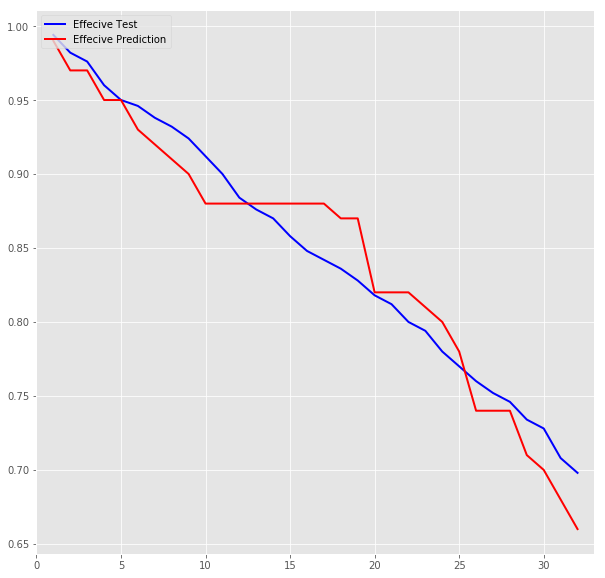

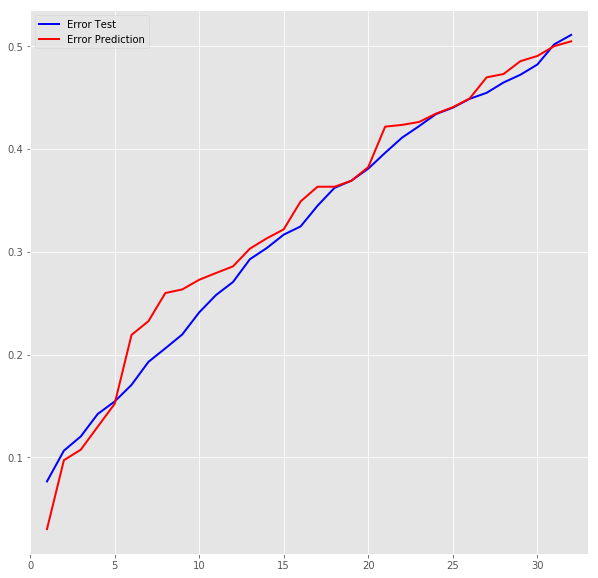

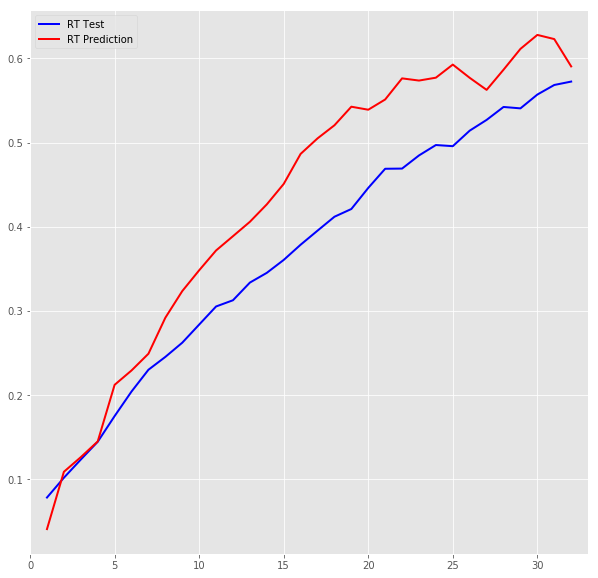

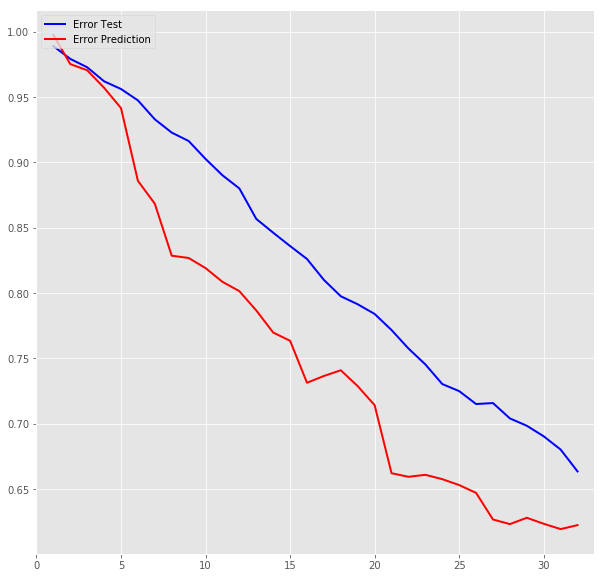

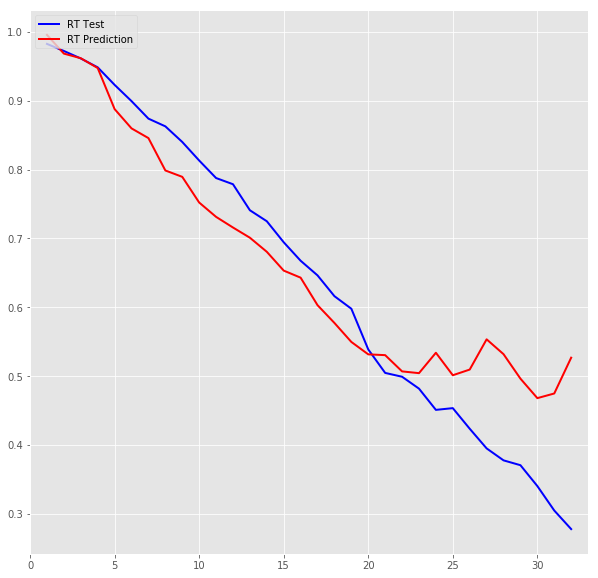

In [13]:
NumEffectiveTest = numpy.array(NumEffectiveTest)
ResponseTestScore = numpy.array(ResponseTestScore)
RTTestScore = numpy.array(RTTestScore)
ResponseTestCorr = numpy.array(ResponseTestCorr)
RTTestCorr = numpy.array(RTTestCorr)
NumEffectivePrediction = numpy.array(NumEffectivePrediction)
ResponsePredictionScore = numpy.array(ResponsePredictionScore)
RTPredictionScore = numpy.array(RTPredictionScore)
ResponsePredictionCorr = numpy.array(ResponsePredictionCorr)
RTPredictionCorr = numpy.array(RTPredictionCorr)

xx = numpy.arange(1, FORECAST_MAX + 1)

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
EffectiveTestPlot = plt.plot(xx, NumEffectiveTest, linewidth = 2, color = 'b', label = "Effecive Test")
EffectivePredictionPlot = plt.plot(xx, NumEffectivePrediction, linewidth = 2, color = 'r', label = "Effecive Prediction")
plt.legend(handles=[EffectiveTestPlot[0], EffectivePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestPlot = plt.plot(xx, ResponseTestScore, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionPlot = plt.plot(xx, ResponsePredictionScore, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestPlot[0], ResponsePredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestPlot = plt.plot(xx, RTTestScore, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionPlot = plt.plot(xx, RTPredictionScore, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestPlot[0], RTPredictionPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
ResponseTestCorrPlot = plt.plot(xx, ResponseTestCorr, linewidth = 2, color = 'b', label = "Error Test")
ResponsePredictionCorrPlot = plt.plot(xx, ResponsePredictionCorr, linewidth = 2, color = 'r', label = "Error Prediction")
plt.legend(handles=[ResponseTestCorrPlot[0], ResponsePredictionCorrPlot[0]],loc="upper left")
plt.show()

plt.figure(figsize=(10, 10))
plt.style.use('ggplot')
plt.xlim(0, FORECAST_MAX + 1)
RTTestCorrPlot = plt.plot(xx, RTTestCorr, linewidth = 2, color = 'b', label = "RT Test")
RTPredictionCorrPlot = plt.plot(xx, RTPredictionCorr, linewidth = 2, color = 'r', label = "RT Prediction")
plt.legend(handles=[RTTestCorrPlot[0], RTPredictionCorrPlot[0]],loc="upper left")
plt.show()
